## ***Time Series Analysis and Prediction - Weather Time Series Analysis and Forecast***
##### **Alice Mangara** (2020242411) | **Diana Mortágua** (2020242508)

## ***London***

In [75]:
# Data Collection from Open-Meteo API

import requests
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose

def get_weather_data(latitude, longitude, start_date, end_date):
    url = f"https://archive-api.open-meteo.com/v1/era5?latitude={latitude}&longitude={longitude}&start_date={start_date}&end_date={end_date}&daily=temperature_2m_mean,rain_sum,temperature_2m_min,wind_speed_10m_max&timezone=auto"
    response = requests.get(url)
    data = response.json()
    df = pd.DataFrame({
        'date': data['daily']['time'],
        'mean_temperature': data['daily']['temperature_2m_mean'],
        'min_temperature': data['daily']['temperature_2m_min'],
        'rain':  data['daily']['rain_sum'],
        'wind': data['daily']['wind_speed_10m_max']
    })
    df['date'] = pd.to_datetime(df['date'])
    return df


latitude = 51.5085  # Latitude for London, UK
longitude = -0.1257   # Longitude for London, UK
start_date = '1940-01-01'
end_date = '2024-10-23'

df_weather = get_weather_data(latitude, longitude, start_date, end_date)
df_weather.head()

,date,mean_temperature,min_temperature,rain,wind
0,1940-01-01,-0.2,-3.5,NaN,17.9
1,1940-01-02,-2.0,-3.5,0.0,17.2
2,1940-01-03,-1.1,-3.8,0.0,19.1
3,1940-01-04,0.1,-2.0,0.0,17.7
4,1940-01-05,-0.7,-3.5,0.0,9.2


In [76]:
# Data Cleaning
#df_weather.isnull().sum()

df_weather.dropna(inplace=True)
df_weather.isnull().sum()


,0
date,0
mean_temperature,0
min_temperature,0
rain,0
wind,0


## First lets see the mean temperature over the years

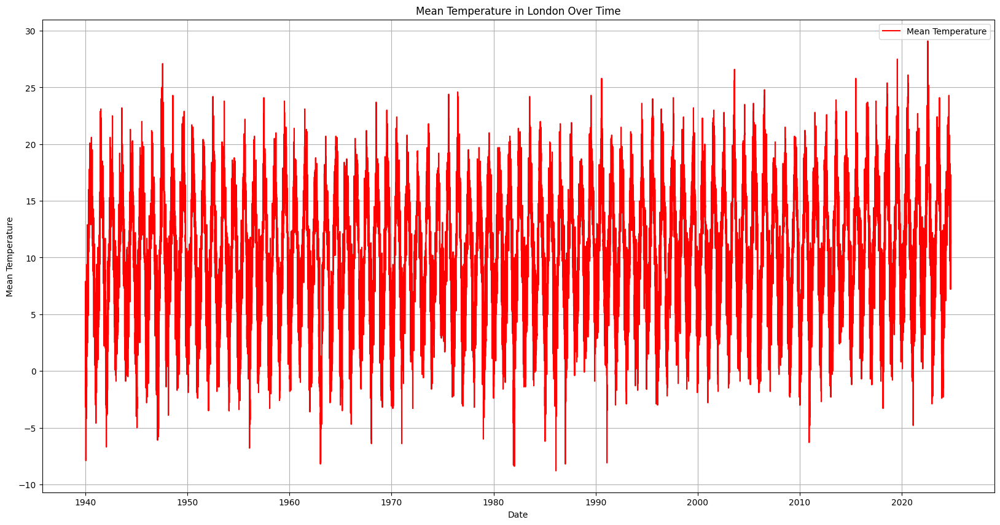

In [77]:
# Plot the mean temperature in London over time
plt.figure(figsize=(20,10))
plt.plot(df_weather['date'], df_weather['mean_temperature'], color='red', label='Mean Temperature')
plt.title('Mean Temperature in London Over Time')
plt.xlabel('Date')
plt.ylabel('Mean Temperature')
plt.legend()
plt.grid(True)
plt.gca().set_facecolor('white')

plt.show()

## Most appropriate decomposition model is: additive decomposition, seasonal component doesnt change with the trend


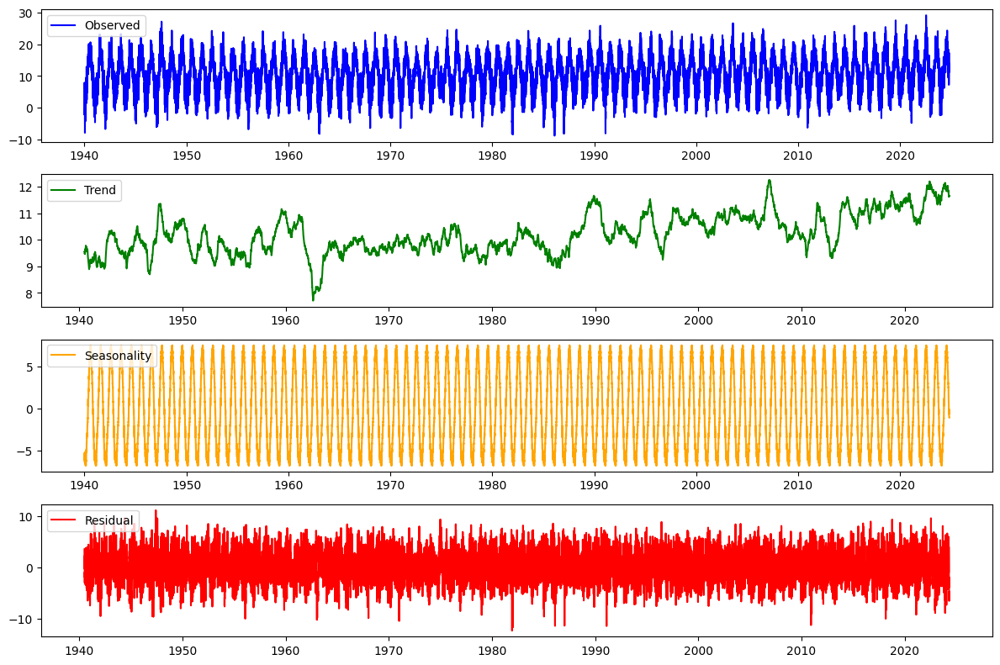

In [78]:
from statsmodels.tsa.seasonal import seasonal_decompose

# Decompose the time series
decomposition = seasonal_decompose(df_weather['mean_temperature'], model='additive', period=365)

# Plotting the decomposition
plt.figure(figsize=(12, 8))

# Observed
plt.subplot(411)
plt.plot(df_weather['date'], decomposition.observed, label='Observed', color='blue')
plt.legend(loc='upper left')

# Trend
plt.subplot(412)
plt.plot(df_weather['date'], decomposition.trend, label='Trend', color='green')
plt.legend(loc='upper left')

# Seasonal
plt.subplot(413)
plt.plot(df_weather['date'], decomposition.seasonal, label='Seasonality', color='orange')
plt.legend(loc='upper left')

# Residual
plt.subplot(414)
plt.plot(df_weather['date'], decomposition.resid, label='Residual', color='red')
plt.legend(loc='upper left')

plt.tight_layout()
plt.show()


## 4.1 - Data Splitting

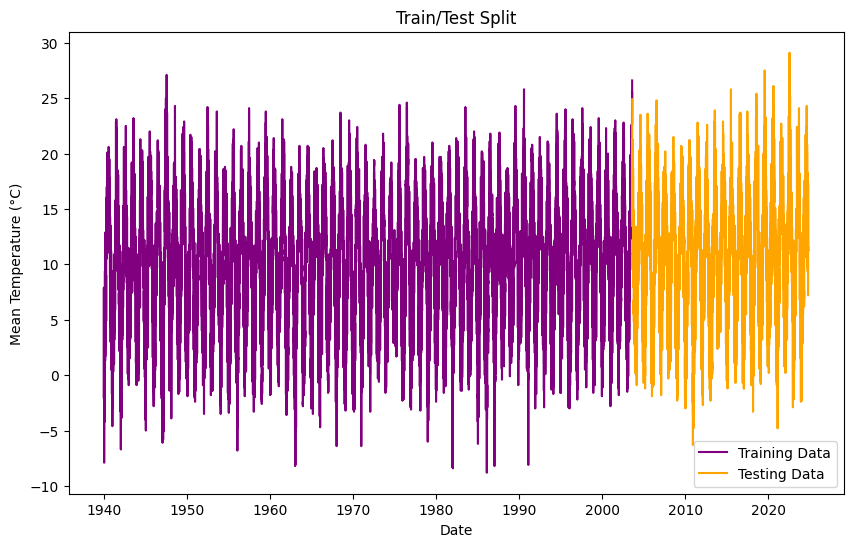

In [79]:
train_size = int(len(df_weather) * 0.75)

train_data = df_weather[:train_size]
test_data = df_weather[train_size:]

plt.figure(figsize=(10,6))
plt.plot(train_data['date'], train_data['mean_temperature'],color= 'purple',label='Training Data')
plt.plot(test_data['date'], test_data['mean_temperature'],color = 'orange',label='Testing Data')
plt.title('Train/Test Split')
plt.xlabel('Date')
plt.ylabel('Mean Temperature (°C)')
plt.legend()
plt.gca().set_facecolor('white')
plt.show()


In [80]:
import numpy as np
dados = train_data[['date', 'mean_temperature']]
dadosTS=pd.Series(data=np.array(dados["mean_temperature"]),index=dados["date"],name="Mean temperature")
dadosTS.dropna()

,Mean temperature
date,
1940-01-02,-2.0
1940-01-03,-1.1
1940-01-04,0.1
1940-01-05,-0.7
1940-01-06,4.1
...,...
2003-08-06,25.6
2003-08-07,22.6
2003-08-08,22.7


## 4.2 - Basic description techniques & transformations

Check seasonality

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

def plot_acf_pacf(ts, lags_acf, lags_pacf):
    N = len(ts.dropna())
    critical_value = 1.96 / np.sqrt(N)

    # Plot ACF
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plot_acf(ts.dropna(), lags=lags_acf, ax=plt.gca())
    plt.axhline(y=critical_value, color='red', linestyle='--', label='Critical Value (95%)')
    plt.axhline(y=-critical_value, color='red', linestyle='--')
    plt.title('ACF')
    plt.legend()

    # Plot PACF
    plt.subplot(1, 2, 2)
    plot_pacf(ts.dropna(), lags=lags_pacf, ax=plt.gca())
    plt.axhline(y=critical_value, color='red', linestyle='--', label='Critical Value (95%)')
    plt.axhline(y=-critical_value, color='red', linestyle='--')
    plt.title('PACF')
    plt.legend()

    plt.tight_layout()
    plt.show()

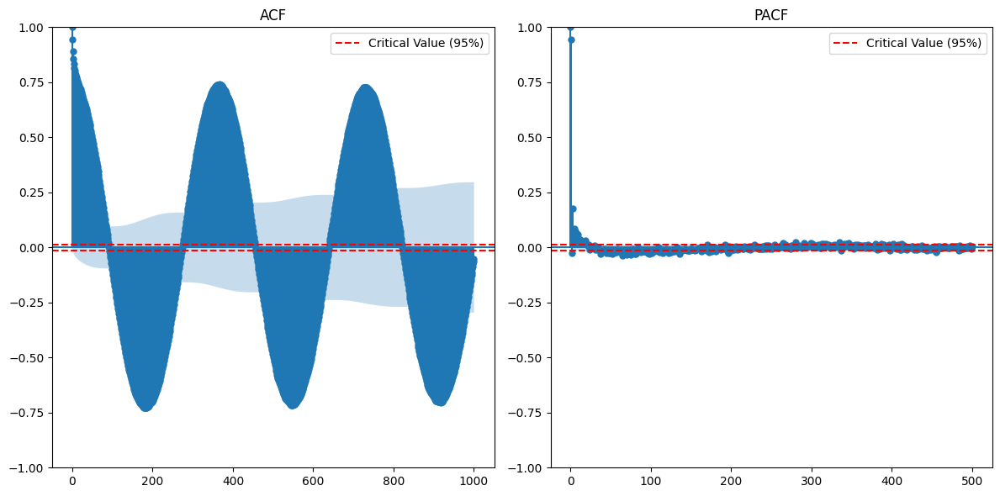

In [ ]:
plot_acf_pacf(dadosTS,1000, 500)

In [ ]:
import numpy as np
def ADF_test(TS, regression = 'c'):
    result = adfuller(TS.dropna(),regression=regression)
    adf_statistic = result[0]
    p_value = result[1]
    critical_values = result[4]

    print('ADF Statistic:', adf_statistic)
    print('p-value:', p_value)
    print('Critical Values:')
    for key, value in critical_values.items():
        print(f'   {key}: {value}')
    if p_value < 0.05 or p_value < 0.01:
        print( "It is stationary!")
    else:
        print("It is not stationary")

In [ ]:
ADF_test(dadosTS, 'ct')

ADF Statistic: -11.499010663340139
p-value: 2.704965636805543e-18
Critical Values:
   1%: -3.959160542030714
   5%: -3.4106793887955473
   10%: -3.127161532493937
It is stationary!


Looking at the ACF, since the time series clearly has seasonality yearly, one might be temped to say it is not stationary. However, a stationary time series can still exhibit seasonal patterns if the seasonal effects are consistent and do not change over time. While the series may be stationary since its mean and variance do not change, it can still contain seasonal components. We will check later if this is the case. Let's check stationarity using only a short amount of the TS:

In [ ]:
ADF_test(dadosTS[:365+365], 'ct')

ADF Statistic: -1.769872561080612
p-value: 0.7191008999419171
Critical Values:
   1%: -3.9714342807035248
   5%: -3.416622413612142
   10%: -3.1306587882812758
It is not stationary


When using only two years, then the ADF test says it is not stationary. So let's try to make it also stationary taking trend and seasonality out of the TS.


## Time-series components
In general, one can say that a TS is composed of three components: trend, seasonality, and erratic/irregular component.<p>
        The trend represents a systematic change in the TS mean, long-term, or general direction of the TS. The trend can be modeled using different functions, but usually, polynomial functions of different orders are selected. For example, a TS can have a linearly increasing behavior, thus a first-order polynomial is sufficient, but TS can present a high order trend, and for example, an order two polynomial will be more adequate. To complement, a trend can be increasing, decreasing, or constant (in this case an order-0 polynomial will suffice).<p>
        Seasonality is related to recurring and periodic patterns that occur along time, and seasonality analysis aims to capture these patterns. Seasonality can be induced by, for example, weather season changes.<p>
        The irregular component can be obtained by removing the trend and seasonality from the TS. It is expected that no seasonal or trend to be visible in the irregular component and represent short-term TS changes.<p>


### a) Trend

### Smoothing the trend with MA and LOWESS

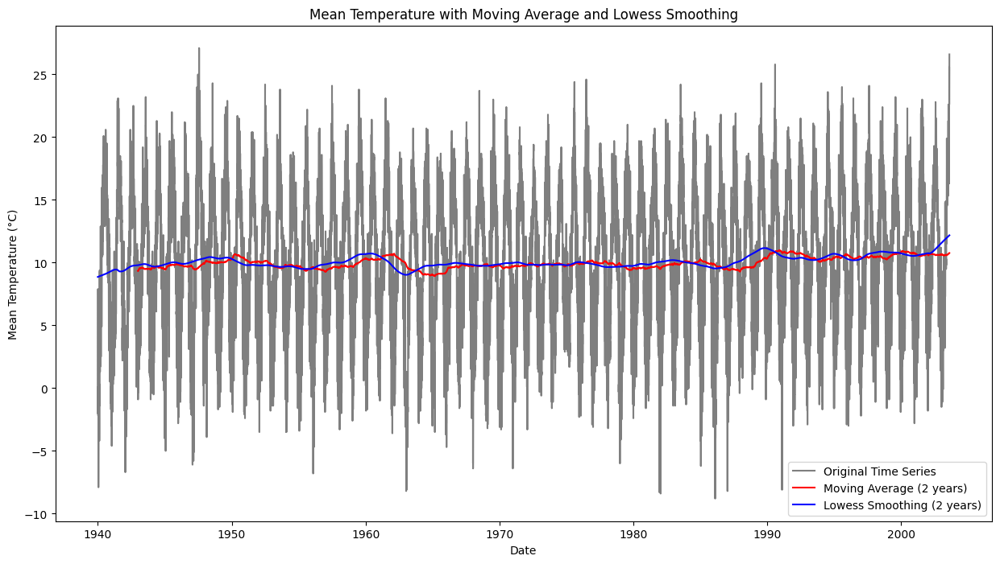

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm

# Define moving average of 3 years to smooth the data
window_size = 365+365+365
MA = train_data['mean_temperature'].rolling(window_size).mean()

lowess = sm.nonparametric.lowess(train_data['mean_temperature'], train_data['date'], frac=0.05)

# Plot the original time series, moving average, and lowess smoothing together
plt.figure(figsize=(15, 8))
plt.plot(train_data['date'], train_data['mean_temperature'], label='Original Time Series', color='black', alpha=0.5)
plt.plot(train_data['date'], MA, label='Moving Average (2 years)', color='red')
plt.plot(train_data['date'], lowess[:, 1], label='Lowess Smoothing (2 years)', color='blue')
plt.title('Mean Temperature with Moving Average and Lowess Smoothing')
plt.xlabel('Date')
plt.ylabel('Mean Temperature (°C)')
plt.legend()
plt.show()


In [ ]:
MA_mse = np.mean((train_data['mean_temperature'] - MA) ** 2)
MA_rmse = np.sqrt(MA_mse)

lowess_values = lowess[:, 1]
LOWESS_mse = np.mean((train_data['mean_temperature'] - lowess_values) ** 2)
LOWESS_rmse = np.sqrt(LOWESS_mse)

print(f"Moving Average - MSE: {MA_mse:.4f}, RMSE: {MA_rmse:.4f}")
print(f"LOWESS - MSE: {LOWESS_mse:.4f}, RMSE: {LOWESS_rmse:.4f}")


Moving Average - MSE: 31.0477, RMSE: 5.5720
LOWESS - MSE: 31.0694, RMSE: 5.5740


We will chose MA over LOWESS following error metric's results.

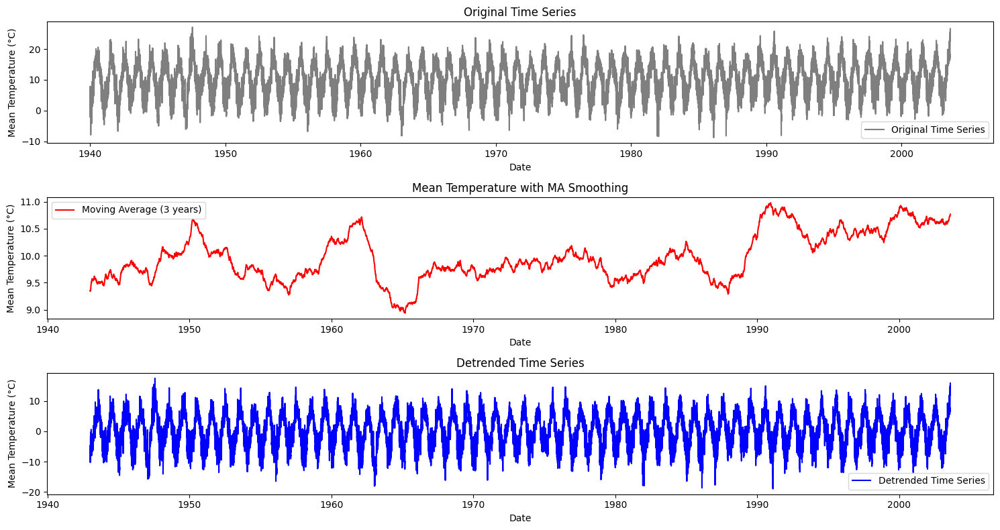

In [ ]:
# Remover a tendencia - a MA à serie original para obter a serie estacionaria
detrended = train_data['mean_temperature'] - MA

plt.figure(figsize=(15, 8))
plt.subplot(3, 1, 1)
plt.plot(train_data['date'], train_data['mean_temperature'], label='Original Time Series', color='black', alpha=0.5)
plt.title('Original Time Series')
plt.xlabel('Date')
plt.ylabel('Mean Temperature (°C)')
plt.legend()


plt.subplot(3, 1, 2)
plt.plot(train_data['date'], MA, label='Moving Average (3 years)', color='red')
plt.title('Mean Temperature with MA Smoothing')
plt.xlabel('Date')
plt.ylabel('Mean Temperature (°C)')
plt.legend()

plt.subplot(3, 1, 3)
plt.plot(train_data['date'], detrended, label='Detrended Time Series', color='blue')
plt.title('Detrended Time Series')
plt.xlabel('Date')
plt.ylabel('Mean Temperature (°C)')
plt.legend()

plt.tight_layout()
plt.show()


### b) Seasonality

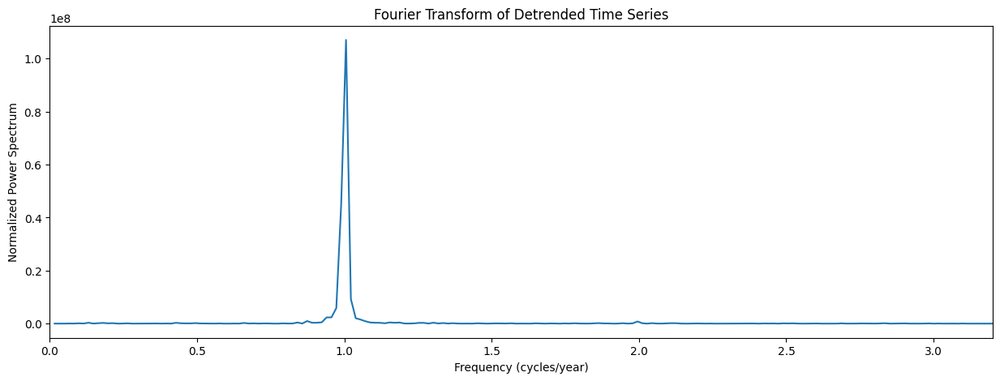

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming detrended is your time series data

# Perform Fourier Transform
fTS = np.fft.fft(detrended.dropna())
frequencies = np.fft.fftfreq(len(fTS), d=1) * 365  # Convert Hz to cycles/year

# Calculate the power spectrum
power_spectrum = np.abs(fTS)**2

# Normalize the spectrum
variance = np.var(detrended.dropna())
normalized_power_spectrum = power_spectrum / variance

# Prepare to plot
plt.figure(figsize=(15, 5))

# Filter frequencies and power spectrum for positive frequencies only
positive_frequencies = frequencies[frequencies > 0]
normalized_power_spectrum_pos = normalized_power_spectrum[frequencies > 0]

# Plot
plt.plot(positive_frequencies, normalized_power_spectrum_pos)
plt.xlabel("Frequency (cycles/year)")
plt.ylabel("Normalized Power Spectrum")
plt.title("Fourier Transform of Detrended Time Series")
plt.xlim(0, 3.2)

plt.show()

The 1 Cycles/Year and 2 Cycles/Year components should be removed, so Wn = 2.1.

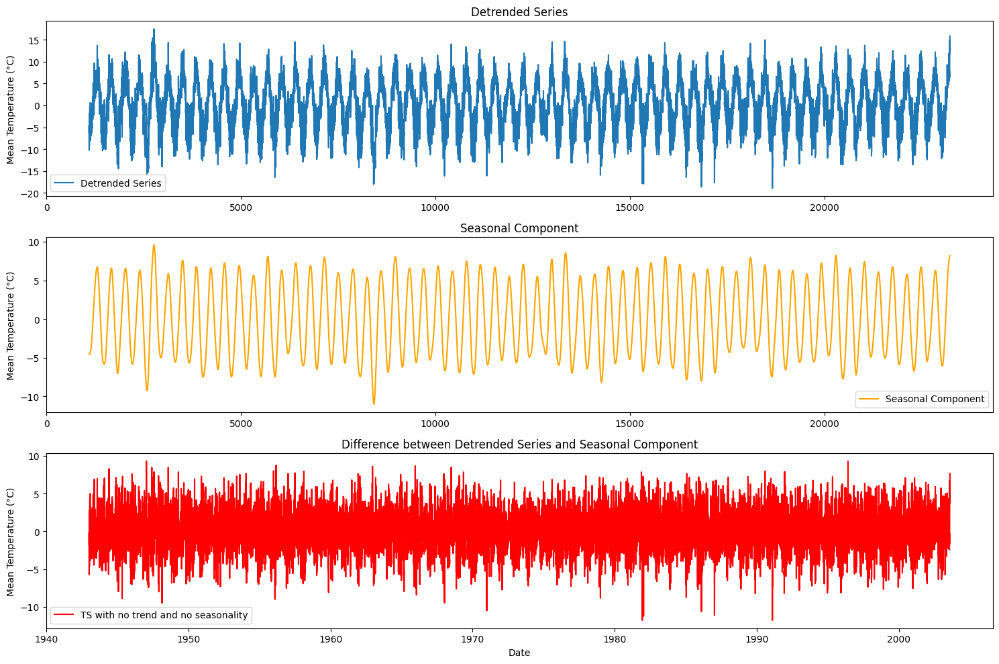

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
import scipy.signal as scs
import requests

fTS = np.fft.fft(detrended.dropna())
frequencies = np.fft.fftfreq(len(fTS), d=1)

samp_freq = 365  # 365 samples a year
Wn = 2.1
sos = scs.butter(N=2, fs=samp_freq, Wn=Wn, output='sos')

# Apply the filter to the detrended series
Seasonal = scs.sosfiltfilt(sos,detrended.dropna())

#Ppower spectrum of the filtered component
fTS_filtered = (np.abs(np.fft.rfft(Seasonal - np.mean(Seasonal))) ** 2 / detrended.size)
f_filtered = np.fft.rfftfreq(detrended.size, d=1/samp_freq)
SeaTS = pd.Series(data=Seasonal, index=detrended.dropna().index, name="Seasonal Component")

plt.figure(figsize=(15, 10))
plt.subplot(3, 1, 1)
plt.plot(detrended.index, detrended, label='Detrended Series')
plt.title("Detrended Series")
plt.ylabel('Mean Temperature (°C)')
plt.legend()

plt.subplot(3, 1, 2)
plt.plot(SeaTS.index, SeaTS, label='Seasonal Component', color='orange')
plt.title("Seasonal Component")
plt.ylabel('Mean Temperature (°C)')
plt.legend()

# Compute difference
difference = detrended - SeaTS
difference.index = train_data["date"]
plt.subplot(3, 1, 3)
plt.plot(difference.index, difference, label='TS with no trend and no seasonality', color='red')
plt.title("Difference between Detrended Series and Seasonal Component")
plt.ylabel('Mean Temperature (°C)')
plt.xlabel('Date')
plt.legend()

plt.tight_layout()
plt.show()


The erratic component looks random as we hoped.

In [ ]:
ADF_test(difference)

ADF Statistic: -27.576082220353868
p-value: 0.0
Critical Values:
   1%: -3.4306460642849315
   5%: -2.8616708506904707
   10%: -2.5668396481286377
It is stationary!


In [ ]:
ADF_test(difference.dropna()[:365+365])

ADF Statistic: -8.706752043557607
p-value: 3.6825562572805664e-14
Critical Values:
   1%: -3.4393893552577723
   5%: -2.8655292671104644
   10%: -2.5688943376666744
It is stationary!


We can see that now the whole TS is stationary!

Let's compare this to take the trend and seasonality implicity by differencing the time series.

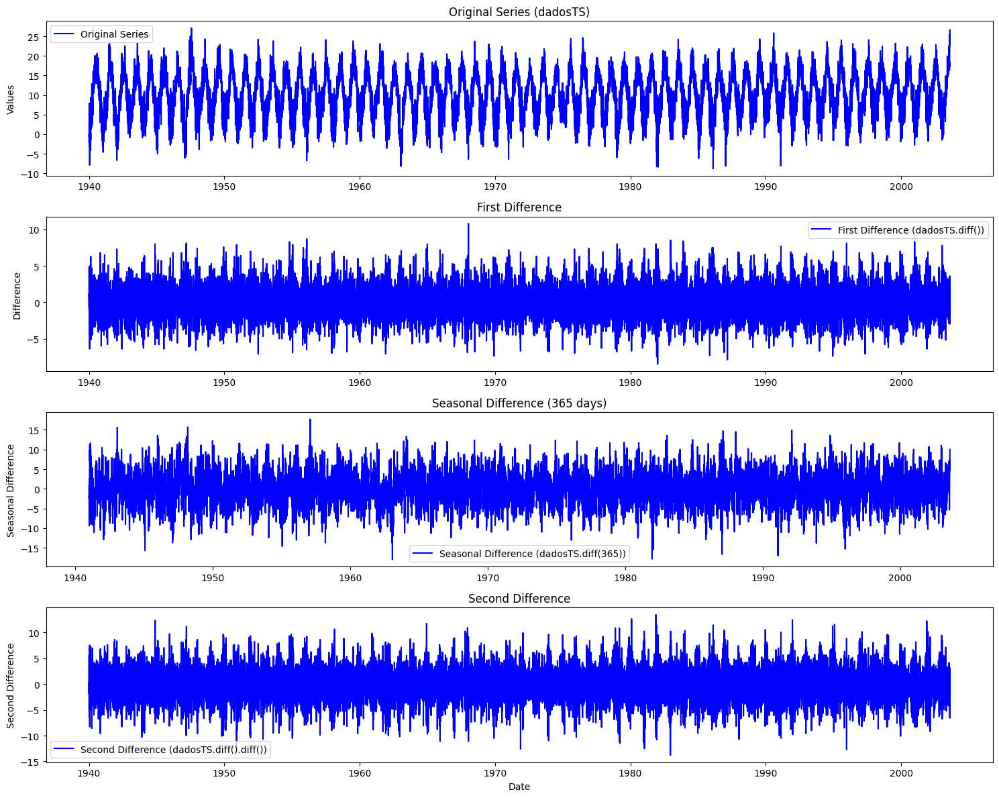

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 12))

# Original series
plt.subplot(4, 1, 1)
plt.plot(dadosTS.index, dadosTS, label='Original Series', color='blue')
plt.title("Original Series (dadosTS)")
plt.ylabel('Values')
plt.legend()

# First difference
plt.subplot(4, 1, 2)
plt.plot(dadosTS.index, dadosTS.diff(), label='First Difference (dadosTS.diff())', color='blue')
plt.title("First Difference")
plt.ylabel('Difference')
plt.legend()

# Seasonal difference
plt.subplot(4, 1, 3)
plt.plot(dadosTS.index, dadosTS.diff(365), label='Seasonal Difference (dadosTS.diff(365))', color='blue')
plt.title("Seasonal Difference (365 days)")
plt.ylabel('Seasonal Difference')
plt.legend()

# Second difference
plt.subplot(4, 1, 4)
plt.plot(dadosTS.index, dadosTS.diff().diff(), label='Second Difference (dadosTS.diff().diff())', color='blue')
plt.title("Second Difference")
plt.ylabel('Second Difference')
plt.xlabel('Date')
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
ADF_test(dadosTS.diff(), 'c')

ADF Statistic: -21.38267014494354
p-value: 0.0
Critical Values:
   1%: -3.430632104309746
   5%: -2.8616646811330857
   10%: -2.566836364196453
It is stationary!


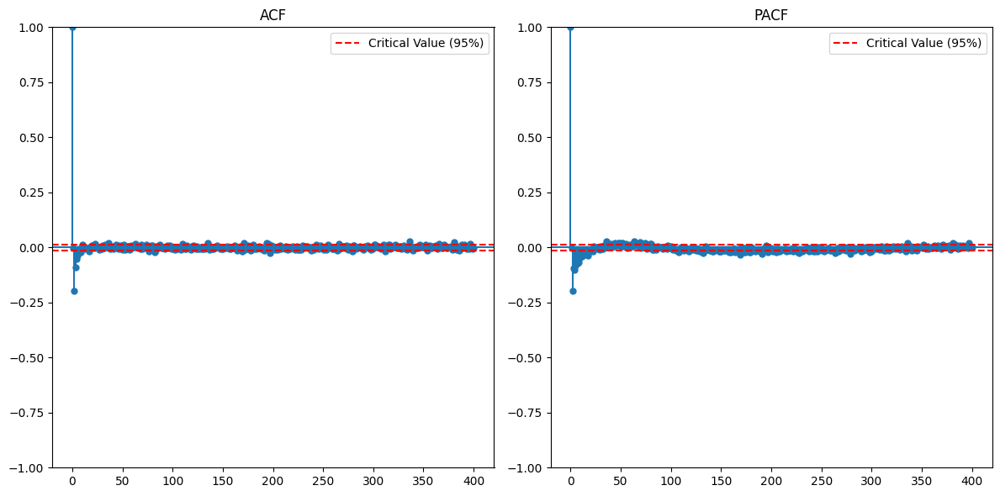

In [ ]:
plot_acf_pacf(dadosTS.diff(),400,400)

In [ ]:
ADF_test(dadosTS.diff().dropna()[:365+365], 'c')

ADF Statistic: -11.869029395159279
p-value: 6.570279128606569e-22
Critical Values:
   1%: -3.439477677285233
   5%: -2.865568186630048
   10%: -2.5689150720653977
It is stationary!


In [ ]:
ADF_test(dadosTS.diff().diff(), 'c')

ADF Statistic: -45.69291048720983
p-value: 0.0
Critical Values:
   1%: -3.430632116480204
   5%: -2.861664686511786
   10%: -2.5668363670594254
It is stationary!


In [ ]:
ADF_test(dadosTS.diff().diff().dropna()[:365+365], 'c')

ADF Statistic: -12.385595028626131
p-value: 4.9176882079611395e-23
Critical Values:
   1%: -3.439606888036868
   5%: -2.865625121924057
   10%: -2.5689454046801052
It is stationary!


In [ ]:
ADF_test(dadosTS.diff().diff(365), 'c')

ADF Statistic: -35.45917894011337
p-value: 0.0
Critical Values:
   1%: -3.43063659227587
   5%: -2.8616666645756306
   10%: -2.5668374199427597
It is stationary!


In [ ]:
ADF_test(dadosTS.diff().diff(365).dropna()[:365+365], 'c')

ADF Statistic: -10.84554541112437
p-value: 1.5758594062096628e-19
Critical Values:
   1%: -3.439580754053961
   5%: -2.865613606467485
   10%: -2.568939269723711
It is stationary!


We can see that tring to remove trend and seasonality by differenciating is much more drastic that doing the implicit removal like we did, so we won't explore it further, just using it once in the predictions to see if we are correct in the assessment that using differencing is not the best approach for our data.

# Model Fitting AR, MA or ARMA

Let's first define some functions to avoid confusing code

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
import warnings

#funtion to check which orders are the best for the ARIMA model by minimizing AIC
def best_fit(TS, p=None,d=None,q=None):
    warnings.simplefilter(action='ignore', category=UserWarning)
    results = []
    if p == None or d == None or q == None:
        p_values = range(0, 3)  # 0, 1, 2
        d_values = range(0, 2)  # 0, 1
        q_values = range(0, 3)  # 0, 1, 2
    else:
        p_values = range(0, p+1)
        d_values = range(0, d+1)
        q_values = range(0, q+1)
    for p in p_values:
        for d in d_values:
            for q in q_values:
                try:
                    model = ARIMA(TS, order=(p, d, q))
                    model_fit = model.fit()
                    results.append((p, d, q, model_fit.aic))
                    print(f'ARIMA({p},{d},{q}) - AIC: {model_fit.aic}')
                except Exception as e:
                    print(f'ARIMA({p},{d},{q}) - Error: {e}')
    results_df = pd.DataFrame(results, columns=['p', 'd', 'q', 'AIC'])
    best_result = results_df.loc[results_df['AIC'].idxmin()]
    print(f'Best ARIMA model: ARIMA({best_result["p"]},{best_result["d"]},{best_result["q"]}) - AIC: {best_result["AIC"]}')


In [ ]:
import sklearn.metrics as metrics

#print metrics of ARIMA predictions
def ARIMA_metrics(predictions,actual_values=None):
    if actual_values is None:
        actual_values = test_data['mean_temperature'].values
    mae = metrics.mean_absolute_error(actual_values, predictions)
    mse = metrics.mean_squared_error(actual_values, predictions)
    rmse = np.sqrt(mse)
    non_zero_indices = actual_values != 0
    mape = np.mean(np.abs((actual_values[non_zero_indices] - predictions[non_zero_indices]) / actual_values[non_zero_indices])) * 100

    print("Error metrics:")
    print("MAE:", mae)
    print("MSE:", mse)
    print("RMSE:", rmse)
    print("MAPE:", mape, "%")


In [ ]:

"""
plot the predictions giving the predictions, the ci values, the data that the model was
fitted on and optionally, the indication if it is daily data or weekly data, and the
real test_values that we are trying to predict, and the variable
"""

def plot_predictions(forecast_mean,forecast_ci,fitted_data, test_index = "D", test = None, var = 'mean_temperature'):
    if test_index == "D":
        start_date = '2003-08-11'
        end_date = '2024-10-23'
        test_index = pd.date_range(start=start_date, end=end_date, freq='D')
    elif test_index == "W":
        start_date = '2003-08-11'
        end_date = '2024-10-23'
        test_index = pd.date_range(start=start_date, end=end_date, freq='W')

    forecast_df = pd.DataFrame({'Predicted': forecast_mean,
                                'Lower CI': forecast_ci.iloc[:, 0],
                                'Upper CI': forecast_ci.iloc[:, 1]},
                                index=test_index)

    if test is None:
        test = test_data
    plt.figure(figsize=(15, 6))
    plt.plot(fitted_data.index, fitted_data.values, label='Original Weekly Data')
    plt.plot(test['date'], test[var], label='Test Data', linestyle='--', color='black', alpha = 0.2)
    plt.plot(forecast_df.index, forecast_df['Predicted'], color='green', label='Predicted Values', linestyle='--')
    plt.fill_between(forecast_df.index,
                    forecast_df['Lower CI'],
                    forecast_df['Upper CI'],
                    color='red', alpha=0.2, label='Confidence Interval')
    plt.title('ARIMA Model Forecast from 2003-08-11 to 2024-10-23')
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.legend()
    plt.show()
    plt.figure(figsize=(15, 5))
    plt.plot(test['date'], test[var], label='Actual', color='black', alpha = 0.4)
    plt.plot(forecast_df.index, forecast_df['Predicted'], label='Predicted', color='red')
    plt.title('Actual vs Predicted values')
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.legend()
    plt.show()

In [ ]:
"""
When forecasting values for time series with no trend and seasonality, we need to add it later to
predict true values of mean_temperature in the test_data. This function allows us to find the
section in the trend and seasonality variables that starts at the same month and day as the prediction.

Give the date of the first predicted point, the forecast length, the funtion of the
trend and seasonality and the indication of it is daily or weekly data.
"""
def find_dates(predicted_start_date, forecast_length, trend, seasonality, tempo = None):
    if tempo == None:
        start_forecast_date = predicted_start_date - pd.Timedelta(days=forecast_length)
    elif tempo == "W":
        start_forecast_date = predicted_start_date - pd.Timedelta(weeks=forecast_length)
    else:
        raise ValueError('Either use nothing or "W" for the tempo variable, please!')
    target_month = predicted_start_date.month
    target_day = predicted_start_date.day
    latest_matching_date = None
    min_index = max(trend.index.min(), seasonality.index.min())
    while start_forecast_date.year >= min_index.year:
        if start_forecast_date.day == target_day and start_forecast_date.month == target_month:
            latest_matching_date = start_forecast_date
            break
        start_forecast_date -= pd.Timedelta(days=1)
    if tempo == None:
        if latest_matching_date:
            end_date = latest_matching_date + pd.Timedelta(days=forecast_length - 1)
    elif tempo == "W":
        if latest_matching_date:
                end_date = latest_matching_date + pd.Timedelta(weeks=forecast_length)


    return latest_matching_date, end_date


Now let's start the analysis, let's start first using the original TS even though it isn't recommended for stationary reasons, as seen before

In [ ]:
best_fit(dadosTS)

ARIMA(0,0,0) - AIC: 146067.61327132417
ARIMA(0,0,1) - AIC: 122979.1075506866
ARIMA(0,0,2) - AIC: 111615.13477697421
ARIMA(0,1,0) - AIC: 94957.91315311182
ARIMA(0,1,1) - AIC: 94959.46803713981
ARIMA(0,1,2) - AIC: 93695.28914980163
ARIMA(1,0,0) - AIC: 94320.90412063636
ARIMA(1,0,1) - AIC: 94300.06622466163
ARIMA(1,0,2) - AIC: 93411.69314226157
ARIMA(1,1,0) - AIC: 94959.6458044946
ARIMA(1,1,1) - AIC: 93402.09236986277
ARIMA(1,1,2) - AIC: 92828.72351505554
ARIMA(2,0,0) - AIC: 94308.3934366139
ARIMA(2,0,1) - AIC: 94126.43512802213
ARIMA(2,0,2) - AIC: 92751.57039472723
ARIMA(2,1,0) - AIC: 94021.2784242667
ARIMA(2,1,1) - AIC: 92890.05767072632
ARIMA(2,1,2) - AIC: 92822.59526294663
Best ARIMA model: ARIMA(2.0,0.0,2.0) - AIC: 92751.57039472723


ARIMA(2,0,2) is the most suitable model with AIC: 92754.89

In [ ]:
model = ARIMA(dadosTS,order= (2,0,2))
model_fit = model.fit()
print(model_fit.summary())

                               SARIMAX Results                                
Dep. Variable:       Mean temperature   No. Observations:                23232
Model:                 ARIMA(2, 0, 2)   Log Likelihood              -46369.785
Date:                Fri, 29 Nov 2024   AIC                          92751.570
Time:                        14:06:57   BIC                          92799.890
Sample:                    01-02-1940   HQIC                         92767.265
                         - 08-10-2003                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         10.0050      0.556     18.005      0.000       8.916      11.094
ar.L1          1.5497      0.013    123.614      0.000       1.525       1.574
ar.L2         -0.5534      0.012    -44.964      0.0

All coefficients show statistical significance. The Ljung-Box test results indicate no significant autocorrelation in the residuals at lag 1, which is good, but the JB statistic is quite high, suggesting the residuals may not be normally distributed. For now, the model still appears to be a reasonably good fit.

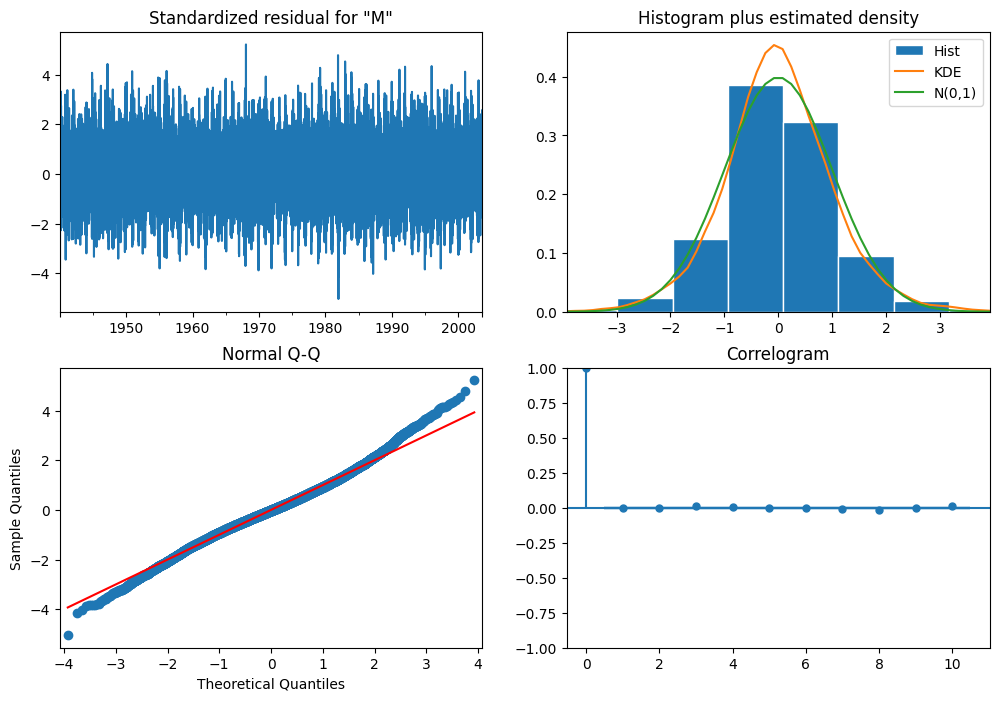

In [ ]:
model_fit.plot_diagnostics(figsize=(12, 8))
plt.show()

Residuals look random, histograms look like a normal distribution, quantiles of the residuals look very similar to quantiles of a normal distribution (except for smaller and larger values), and the correlogram is only statistically different from zero at T=0. Diagnostics look promising.


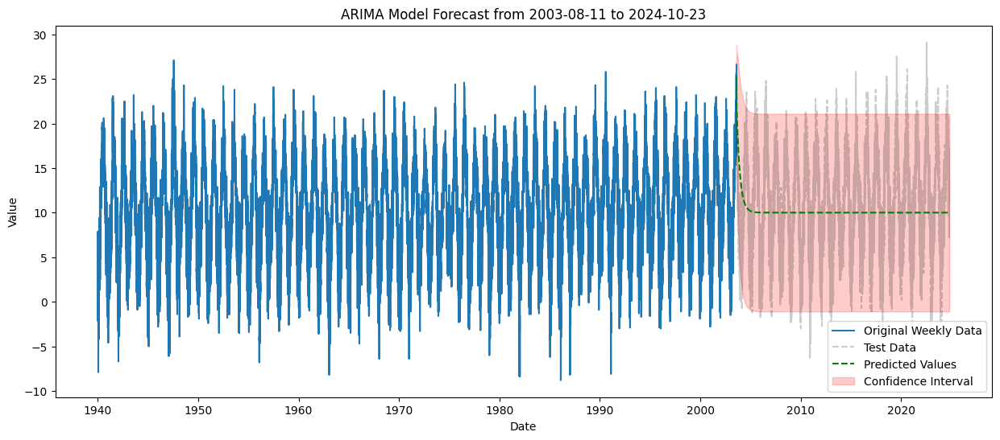

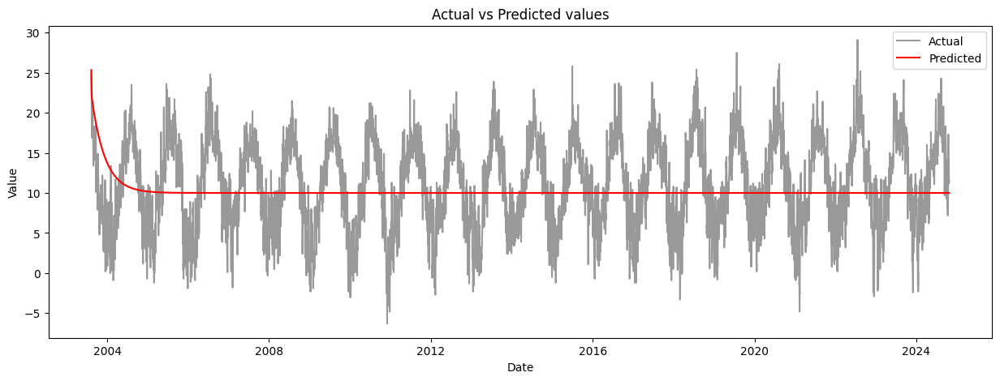

In [ ]:
forecast_results = model_fit.get_forecast(steps=len(test_data))
forecast_mean = forecast_results.predicted_mean
forecast_ci = forecast_results.conf_int()
plot_predictions(forecast_mean,forecast_ci,dadosTS,"D")

In [ ]:
import sklearn.metrics as metrics

actual_values = test_data['mean_temperature'].values
mae = metrics.mean_absolute_error(actual_values, forecast_mean.values)
mse = metrics.mean_squared_error(actual_values, forecast_mean.values)
rmse = np.sqrt(mse)
non_zero_indices = actual_values != 0
mape = np.mean(np.abs((actual_values[non_zero_indices] - forecast_mean.values[non_zero_indices]) / actual_values[non_zero_indices])) * 100

print("Error metrics:")
print("MAE:", mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("MAPE:", mape, "%")

Error metrics:
MAE: 4.744985959045052
MSE: 32.284648618375606
RMSE: 5.681958167601694
MAPE: 152.9526890370973 %


The model not able to correctly predict the behavious of the series in the test period, the almost constant value it predicted was off only by 4.7 degrees.

Let's try and use our in-sample data weekly (instead of daily), and use AIC comparison to find the best model

In [ ]:
from statsmodels.tools.eval_measures import aic
import itertools
weekly_data = dadosTS.resample('W').mean().dropna()

best_fit(weekly_data.dropna())


ARIMA(0,0,0) - AIC: 20507.17521790239
ARIMA(0,0,1) - AIC: 17884.70791455671
ARIMA(0,0,2) - AIC: 16873.09406014306
ARIMA(0,1,0) - AIC: 15255.286193070982
ARIMA(0,1,1) - AIC: 15081.308791224877
ARIMA(0,1,2) - AIC: 15055.574220722305
ARIMA(1,0,0) - AIC: 15093.495179431271
ARIMA(1,0,1) - AIC: 14994.471428676517
ARIMA(1,0,2) - AIC: 14979.705502265122
ARIMA(1,1,0) - AIC: 15129.384919028711
ARIMA(1,1,1) - AIC: 15067.39147307126
ARIMA(1,1,2) - AIC: 15044.683253247398
ARIMA(2,0,0) - AIC: 15019.048434054836
ARIMA(2,0,1) - AIC: 14988.017583108161
ARIMA(2,0,2) - AIC: 14967.430177954706
ARIMA(2,1,0) - AIC: 15039.69794284632
ARIMA(2,1,1) - AIC: 15040.345546842242
ARIMA(2,1,2) - AIC: 14870.511392994425
Best ARIMA model: ARIMA(2.0,1.0,2.0) - AIC: 14870.511392994425


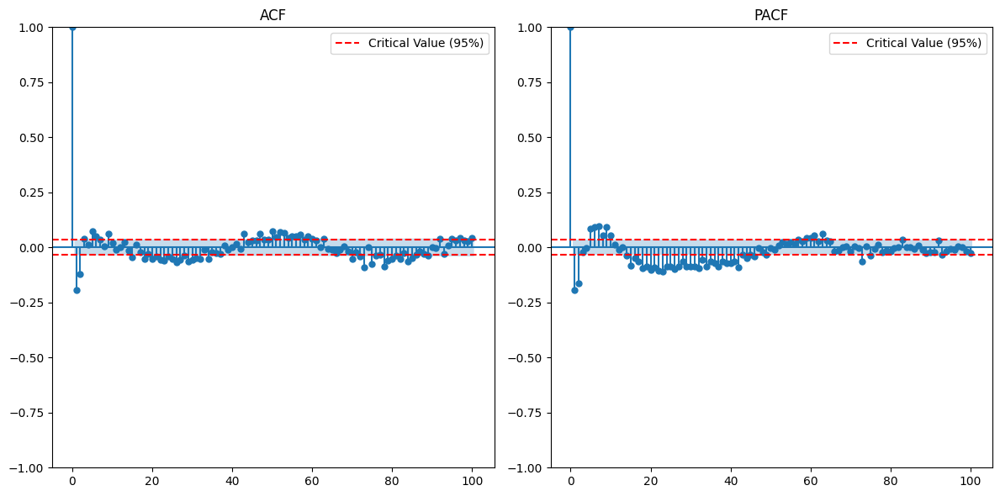

In [ ]:
plot_acf_pacf(weekly_data.diff(), 100,100)

In [ ]:
model = ARIMA(weekly_data, order = (2,1,2))
model_weekly = model.fit()

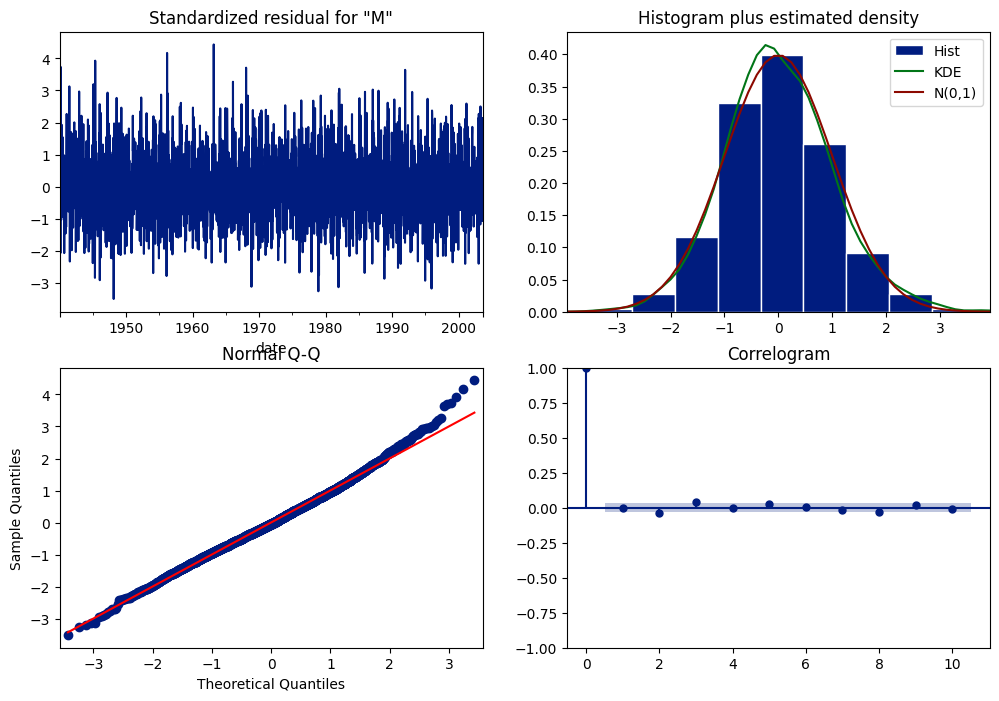

In [ ]:
model_weekly.plot_diagnostics(figsize=(12, 8))
plt.show()

In [ ]:
print(model_weekly.summary())

                               SARIMAX Results                                
Dep. Variable:       Mean temperature   No. Observations:                 3319
Model:                 ARIMA(2, 1, 2)   Log Likelihood               -7430.256
Date:                Thu, 28 Nov 2024   AIC                          14870.511
Time:                        14:59:10   BIC                          14901.047
Sample:                    01-07-1940   HQIC                         14881.439
                         - 08-10-2003                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.4453      0.027     53.244      0.000       1.392       1.499
ar.L2         -0.5209      0.027    -19.092      0.000      -0.574      -0.467
ma.L1         -1.7291      0.018    -94.746      0.0

The model looks like a good fit looking at evaluation metrics. Ljung-Box test shows a p-value of 0.96, indicating that there’s no significant autocorrelation in the residuals too. P-values of 0.000 regarding each coefficients suggest that all of them are statistically significant. However heteroskedasticity test indicates that we do not have strong evidence of heteroskedasticity in the residuals.

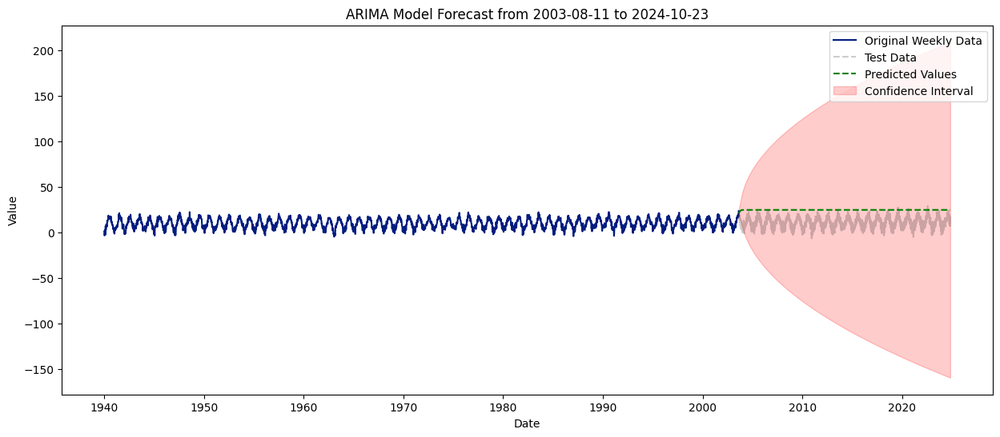

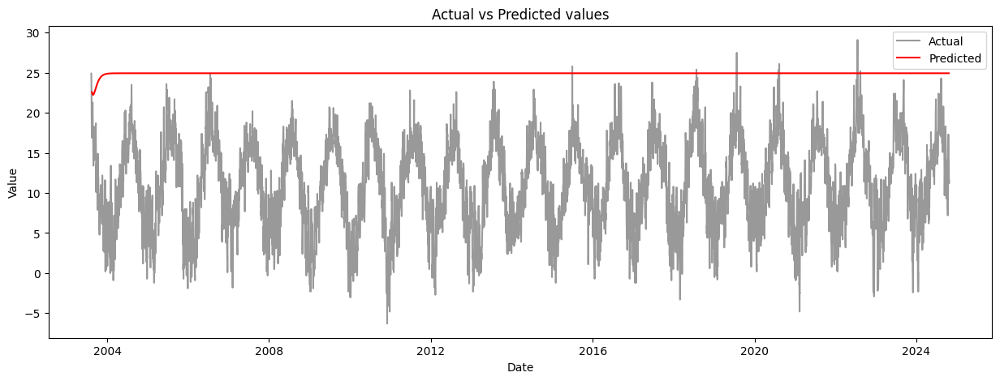

In [ ]:
test_data_indexed = test_data.set_index('date')
weekly_test = test_data_indexed.resample('W').mean().dropna()
forecast_results = model_weekly.get_forecast(steps=len(weekly_test))
forecast_mean = forecast_results.predicted_mean
forecast_ci = forecast_results.conf_int()
plot_predictions(forecast_mean,forecast_ci,weekly_data,'W')

In [ ]:
import sklearn.metrics as metrics
actual_values = weekly_test['mean_temperature'].values
ARIMA_metrics(forecast_mean, actual_values)

Error metrics:
MAE: 13.930092506912889
MSE: 221.66072098508207
RMSE: 14.888274614107642
MAPE: 689.7407968493704 %


Let's see if **SARIMA** is a good model for our data. Let's start by analyzing the data's ACF and PACF.

In [ ]:
print("2 years of weekly resample:\n")
ADF_test(weekly_data[:52*2], regression = 'ct')
print("=-"*20)
print("3 years of weekly resample:\n")
ADF_test(weekly_data[:52*3], regression = 'ct')
print("=-"*20)
print("Weekly resample (2 years) differenced\n")
ADF_test(weekly_data[:52*2].diff(), regression = 'c')

2 years of weekly resample:

ADF Statistic: -3.3365534129087617
p-value: 0.06045989461999313
Critical Values:
   1%: -4.061865559807901
   5%: -3.4598875383872256
   10%: -3.155966861981154
It is not stationary
=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
3 years of weekly resample:

ADF Statistic: -4.35198629505094
p-value: 0.0026090966543583813
Critical Values:
   1%: -4.023514459232879
   5%: -3.441649494385999
   10%: -3.145330713164287
It is stationary!
=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
Weekly resample (2 years) differenced

ADF Statistic: -14.337607570998117
p-value: 1.0734386704340999e-26
Critical Values:
   1%: -3.4961490537199116
   5%: -2.8903209639580556
   10%: -2.5821223452518263
It is stationary!


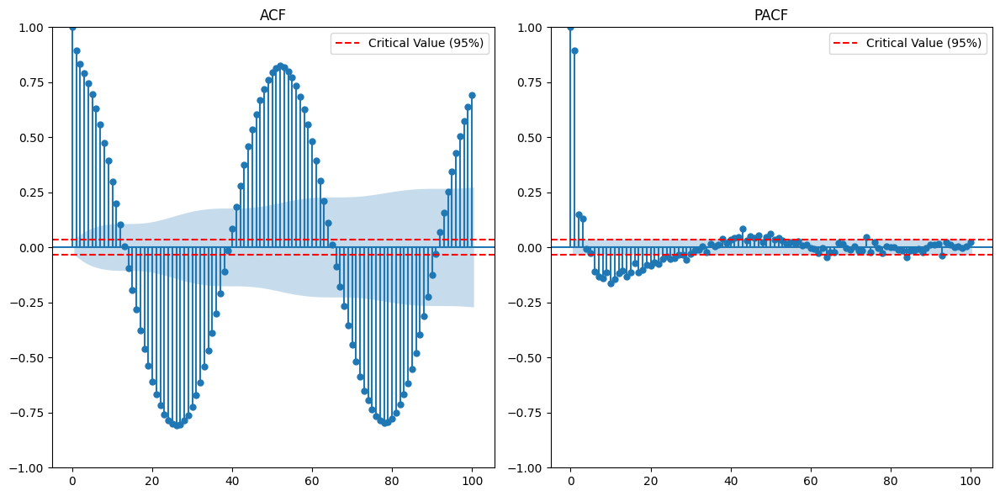

In [ ]:
plot_acf_pacf(weekly_data, 100,100)

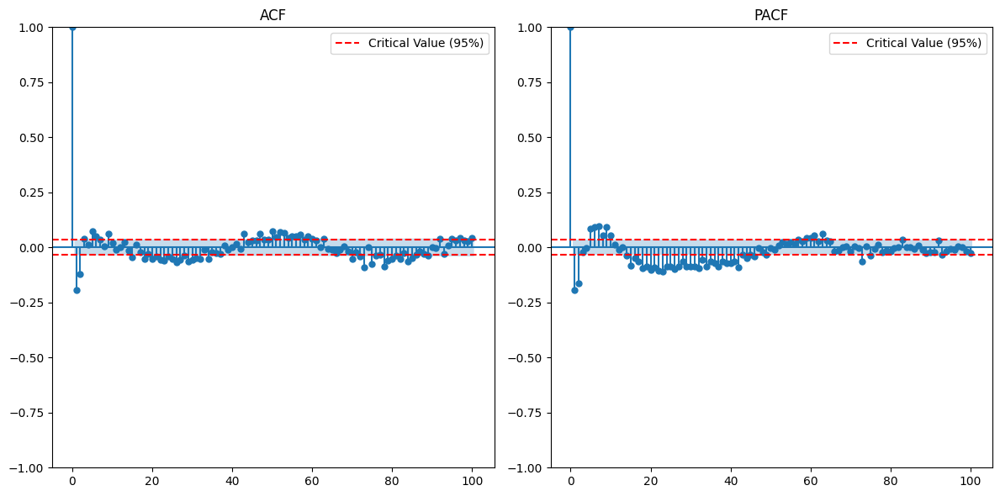

In [ ]:
plot_acf_pacf(weekly_data.diff(), 100,100)

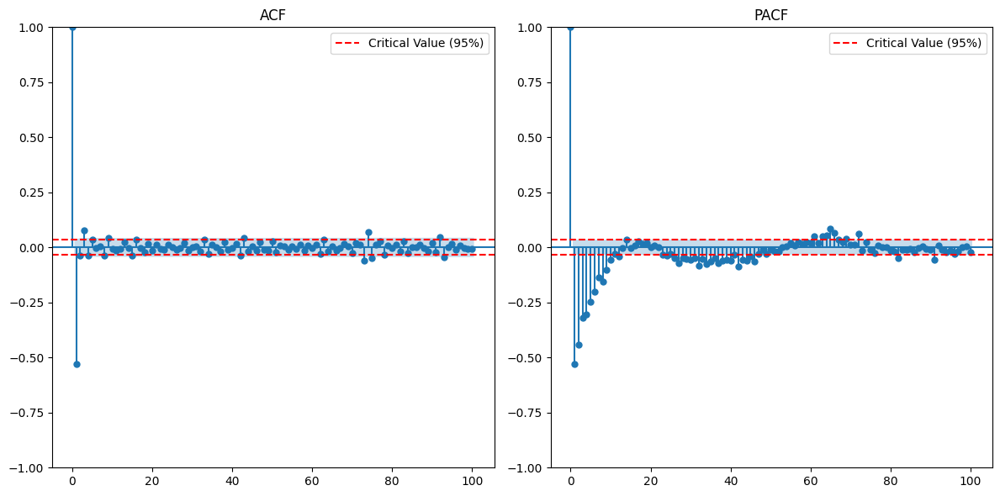

In [ ]:
plot_acf_pacf(weekly_data.diff().diff(), 100,100)

Trend is removed after 1st differencing, since ACF quickly decays to zero. Looking at the ACF and PACF, both have mainly 1 value more distant from zero. A good model to try might have p=1 and q=1 and d=1.

In [ ]:
best_fit(weekly_data,2,2,2)

ARIMA(0,0,0) - AIC: 20507.17521790239
ARIMA(0,0,1) - AIC: 17884.70791455671
ARIMA(0,0,2) - AIC: 16873.09406014306
ARIMA(0,1,0) - AIC: 15255.286193070982
ARIMA(0,1,1) - AIC: 15081.308791224877
ARIMA(0,1,2) - AIC: 15055.574220722305
ARIMA(0,2,0) - AIC: 18137.533983912108
ARIMA(0,2,1) - AIC: 15261.772954469625
ARIMA(0,2,2) - AIC: 15088.430960442143
ARIMA(1,0,0) - AIC: 15093.495179431271
ARIMA(1,0,1) - AIC: 14994.471428676517
ARIMA(1,0,2) - AIC: 14979.705502265122
ARIMA(1,1,0) - AIC: 15129.384919028711
ARIMA(1,1,1) - AIC: 15067.39147307126
ARIMA(1,1,2) - AIC: 15044.683253247398
ARIMA(1,2,0) - AIC: 17042.302075625168
ARIMA(1,2,1) - AIC: 15136.254286860483
ARIMA(1,2,2) - AIC: 15264.710699518651
ARIMA(2,0,0) - AIC: 15019.048434054836
ARIMA(2,0,1) - AIC: 14988.017583108161
ARIMA(2,0,2) - AIC: 14967.430177954706
ARIMA(2,1,0) - AIC: 15039.69794284632
ARIMA(2,1,1) - AIC: 15040.345546842242
ARIMA(2,1,2) - AIC: 14870.511392994425
ARIMA(2,2,0) - AIC: 16321.642720930646
ARIMA(2,2,1) - AIC: 15046.8872

In [ ]:
best_fit(weekly_data.diff())

ARIMA(0,0,0) - AIC: 15257.260646645129
ARIMA(0,0,1) - AIC: 15083.263803788304
ARIMA(0,0,2) - AIC: 15057.522779568048
ARIMA(0,1,0) - AIC: 18153.187400592084
ARIMA(0,1,1) - AIC: 15277.430161033437
ARIMA(0,1,2) - AIC: 15104.082592694762
ARIMA(1,0,0) - AIC: 15131.349593617864
ARIMA(1,0,1) - AIC: 15069.342119432386
ARIMA(1,0,2) - AIC: 15046.632621394525
ARIMA(1,1,0) - AIC: 17057.955473696325
ARIMA(1,1,1) - AIC: 15151.907921082024
ARIMA(1,1,2) - AIC: 15280.364110490993
ARIMA(2,0,0) - AIC: 15041.64919537623
ARIMA(2,0,1) - AIC: 15042.29488898677
ARIMA(2,0,2) - AIC: 14872.486481795562
ARIMA(2,1,0) - AIC: 16337.296131710893
ARIMA(2,1,1) - AIC: 15062.540264738946
ARIMA(2,1,2) - AIC: 15063.226855293336
Best ARIMA model: ARIMA(2.0,0.0,2.0) - AIC: 14872.486481795562


In [ ]:
best_fit(weekly_data.diff().diff())

ARIMA(0,0,0) - AIC: 18139.53299622402
ARIMA(0,0,1) - AIC: 15263.782522903757
ARIMA(0,0,2) - AIC: 15090.456391704382
ARIMA(0,1,0) - AIC: 21857.88518615368
ARIMA(0,1,1) - AIC: 18158.843900100248
ARIMA(0,1,2) - AIC: 15531.436529582663
ARIMA(1,0,0) - AIC: 17044.299723181874
ARIMA(1,0,1) - AIC: 15138.367691561356
ARIMA(1,0,2) - AIC: 15266.73182310909
ARIMA(1,1,0) - AIC: 19950.376117253654
ARIMA(1,1,1) - AIC: 17064.779269175175
ARIMA(1,1,2) - AIC: 15438.75183073014
ARIMA(2,0,0) - AIC: 16323.640448844239
ARIMA(2,0,1) - AIC: 15050.563439747912
ARIMA(2,0,2) - AIC: 15123.531002011372
ARIMA(2,1,0) - AIC: 18721.24319207951
ARIMA(2,1,1) - AIC: 16345.09936201508
ARIMA(2,1,2) - AIC: 15087.072753858594
Best ARIMA model: ARIMA(2.0,0.0,1.0) - AIC: 15050.563439747912


as best_fit(weekly_data), best_fit(weekly_data.diff()) and our visual assessment of the ACF and PACf agree with using (2,1,2). Although best_fit(weekly_data.diff().diff()) says to use (2,2,1), that combination does not have a good AIC score on best_fit(weeklt_data). For those reasons, we will use (2,1,2) for the non seaosnal orders of SARIMA

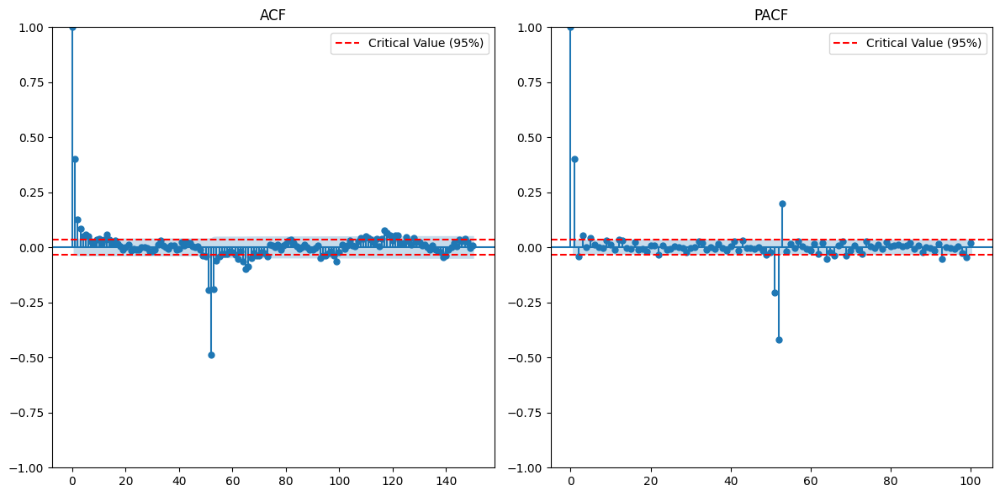

In [ ]:
plot_acf_pacf(weekly_data.diff(52), 150,100)

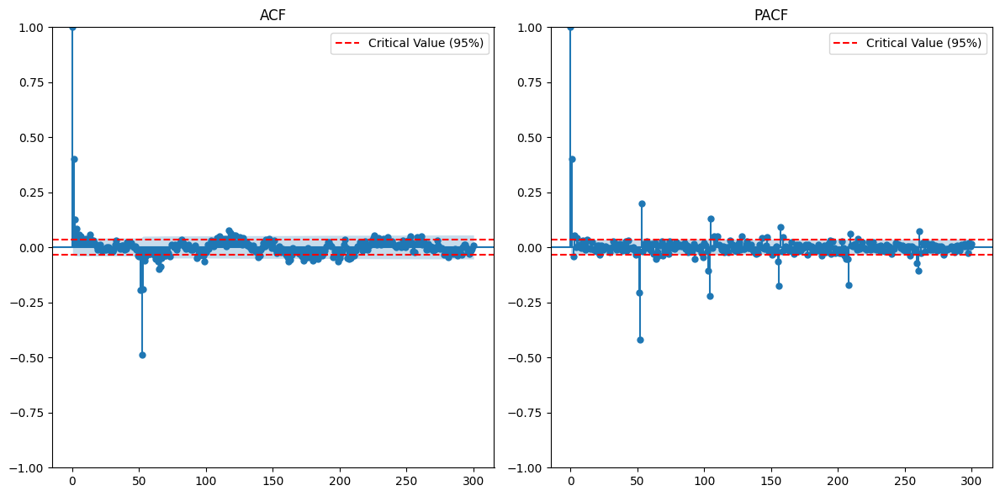

In [ ]:
plot_acf_pacf(weekly_data.diff(52), 300,300)

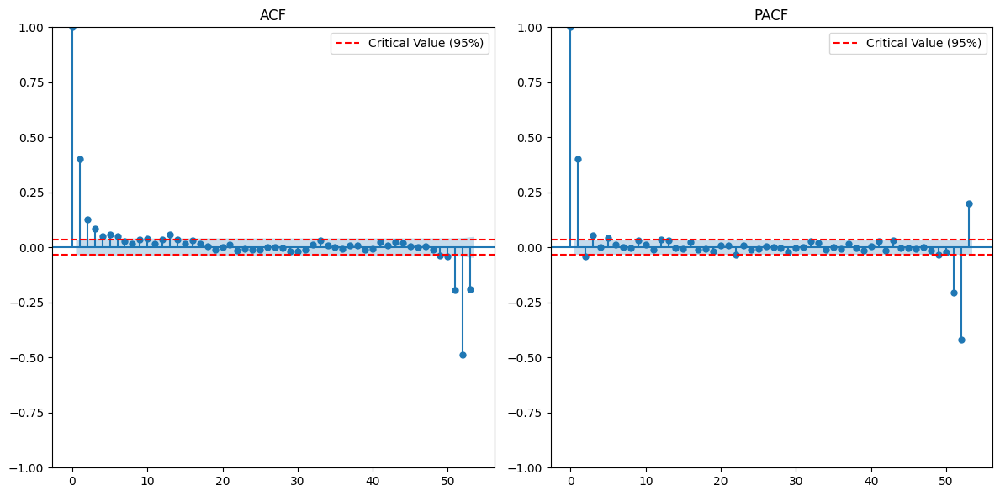

In [ ]:
plot_acf_pacf(weekly_data.diff(52), 53,53)

In [ ]:
print("\nWeekly resample seasonal differenced")
ADF_test(weekly_data.diff(52), regression = 'c')
print("=-"*25)
print("\nWeekly resample (3 years) seasonal differenced")
ADF_test(weekly_data[:52*3].diff(52), regression = 'c')
print("=-"*25)
print("\nWeekly resample (2 years) seasonal differenced")
ADF_test(weekly_data[:52*2].diff(52), regression = 'c')


Weekly resample seasonal differenced
ADF Statistic: -21.23398506909452
p-value: 0.0
Critical Values:
   1%: -3.4323562701985906
   5%: -2.8624264505639583
   10%: -2.567241876495445
It is stationary!
=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

Weekly resample (3 years) seasonal differenced
ADF Statistic: -4.410237150612189
p-value: 0.00028469169750505627
Critical Values:
   1%: -3.497501033
   5%: -2.89090644
   10%: -2.5824349
It is stationary!
=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

Weekly resample (2 years) seasonal differenced
ADF Statistic: -1.4830195221368734
p-value: 0.541893992623601
Critical Values:
   1%: -3.5925042342183704
   5%: -2.931549768951162
   10%: -2.60406594375338
It is not stationary


Text(42.722222222222214, 0.5, 'Par. Autocorrelation')

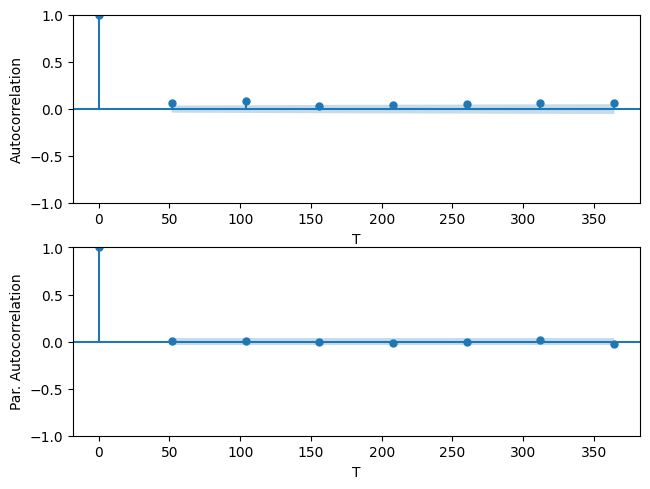

In [ ]:
fig, axs=plt.subplots(2)
fig.tight_layout()

plot_acf(weekly_data[:].diff().dropna(),lags=range(0,52*8,52),ax=axs[0],title='')
axs[0].set_xlabel("T")
axs[0].set_ylabel("Autocorrelation")
plot_pacf(weekly_data[:].diff().dropna(),ax=axs[1],title='',lags=range(0,52*8,52))
axs[1].set_xlabel("T")
axs[1].set_ylabel("Par. Autocorrelation")

In [ ]:
import numpy as np
dados = train_data[['date', 'mean_temperature']]
dadosTS=pd.Series(data=np.array(dados["mean_temperature"]),index=dados["date"],name="Mean temperature")
dadosTS.dropna()
weekly_data = dadosTS.resample('W').mean().dropna()

In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

model_sarima_w = SARIMAX(weekly_data, order=(2, 1, 2), seasonal_order=(0, 1, 2, 52))
model_weekly_s = model_sarima_w.fit()

In [ ]:
print(model_weekly_s.summary())

                                     SARIMAX Results                                      
Dep. Variable:                   Mean temperature   No. Observations:                 3319
Model:             SARIMAX(2, 1, 2)x(0, 1, 2, 52)   Log Likelihood               -7054.764
Date:                            Mon, 02 Dec 2024   AIC                          14123.529
Time:                                    12:41:35   BIC                          14166.168
Sample:                                01-07-1940   HQIC                         14138.800
                                     - 08-10-2003                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3699      0.102     -3.613      0.000      -0.571      -0.169
ar.L2          0.3631      0.055   

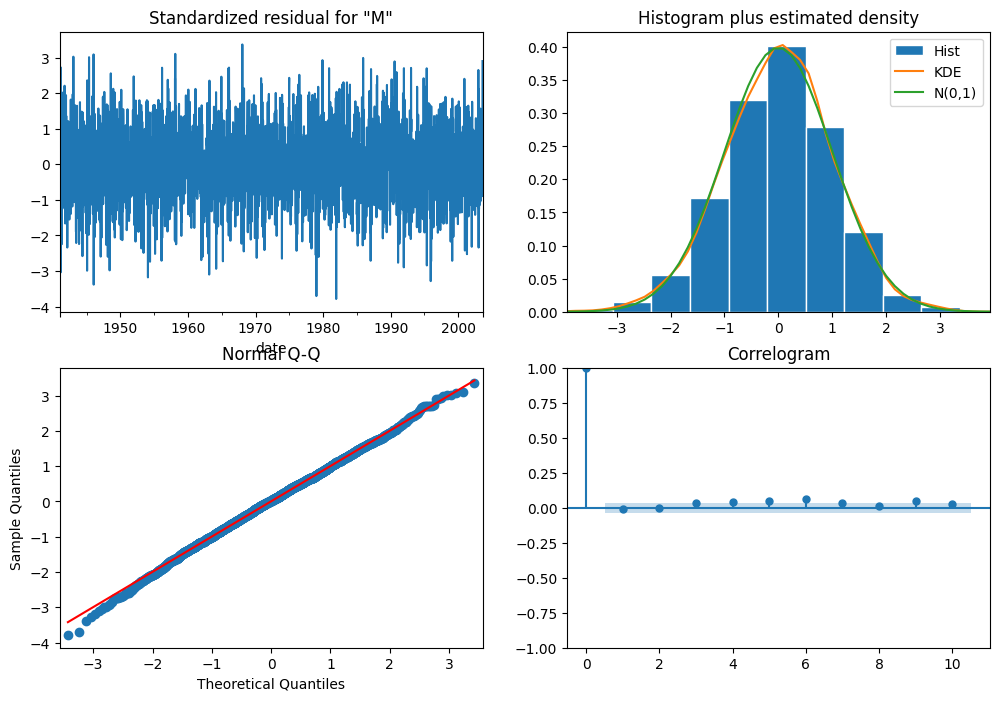

In [ ]:
model_weekly_s.plot_diagnostics(figsize=(12, 8))
plt.show()

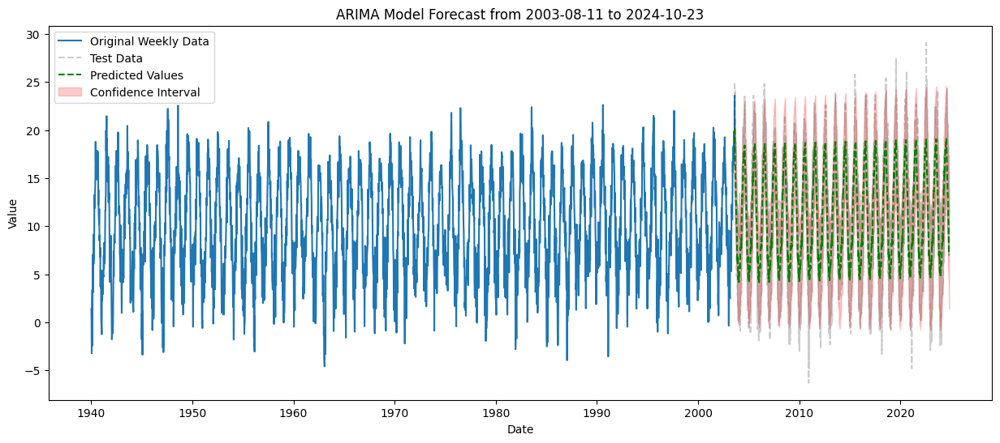

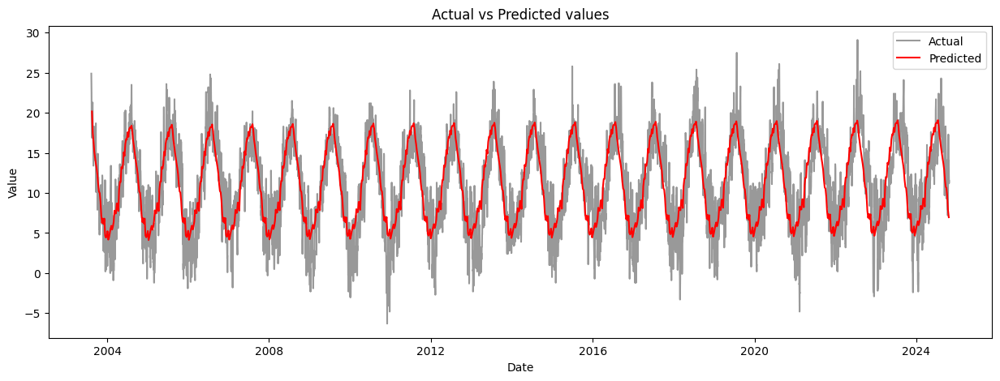

In [ ]:
test_data_indexed = test_data.set_index('date')
weekly_test = test_data_indexed.resample('W').mean().dropna()
forecast_results = model_weekly_s.get_forecast(steps=len(weekly_test))
forecast_mean = forecast_results.predicted_mean
forecast_ci = forecast_results.conf_int()
plot_predictions(forecast_mean,forecast_ci,weekly_data,'W')

In [ ]:
import sklearn.metrics as metrics
actual_values = weekly_test['mean_temperature'].values
ARIMA_metrics(forecast_mean, actual_values)

Error metrics:
MAE: 2.3576955751913524
MSE: 8.594941934616614
RMSE: 2.931713139892205
MAPE: 139.52806456177439 %


We will try using non seasonal order (2,2,1) as that is what best_fit(weekly_data.diff().diff() suggested, and also that the ACF and PACF plot of seasonal differencing suggest.

In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

model_sarima_w = SARIMAX(weekly_data, order=(2, 1, 1), seasonal_order=(0, 1, 2, 52))
model_weekly_s_2 = model_sarima_w.fit()

In [ ]:
print(model_weekly_s_2.summary())

                                        SARIMAX Results                                        
Dep. Variable:                        Mean temperature   No. Observations:                 3319
Model:             SARIMAX(2, 1, 1)x(0, 1, [1, 2], 52)   Log Likelihood               -7058.842
Date:                                 Mon, 02 Dec 2024   AIC                          14129.684
Time:                                         13:29:27   BIC                          14166.232
Sample:                                     01-07-1940   HQIC                         14142.774
                                          - 08-10-2003                                         
Covariance Type:                                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4626      0.016     28.480      0.000       0.431       0

We can see that the Ljung-Box test states that there is no significant autocorrelation left in the residuals. The coefficients for the AR terms and MA terms are mostly statistically significant, with p-values of 0.000. However, the coefficients for ar.L2 and ma.S.L104 have p-values of 0.981 and 0.350, respectively, indicating that they are not statistically significant (and to note that the p-values are larger than those in SARIMA(2, 1, 2)(0, 1, 2, 52)). The Jarque-Bera test suggests some non-normality in the residuals with p value 0.03, which could be a concern for inference unless addressed. The heteroskedasticity test suggests no presence of significant changes in variance over time.

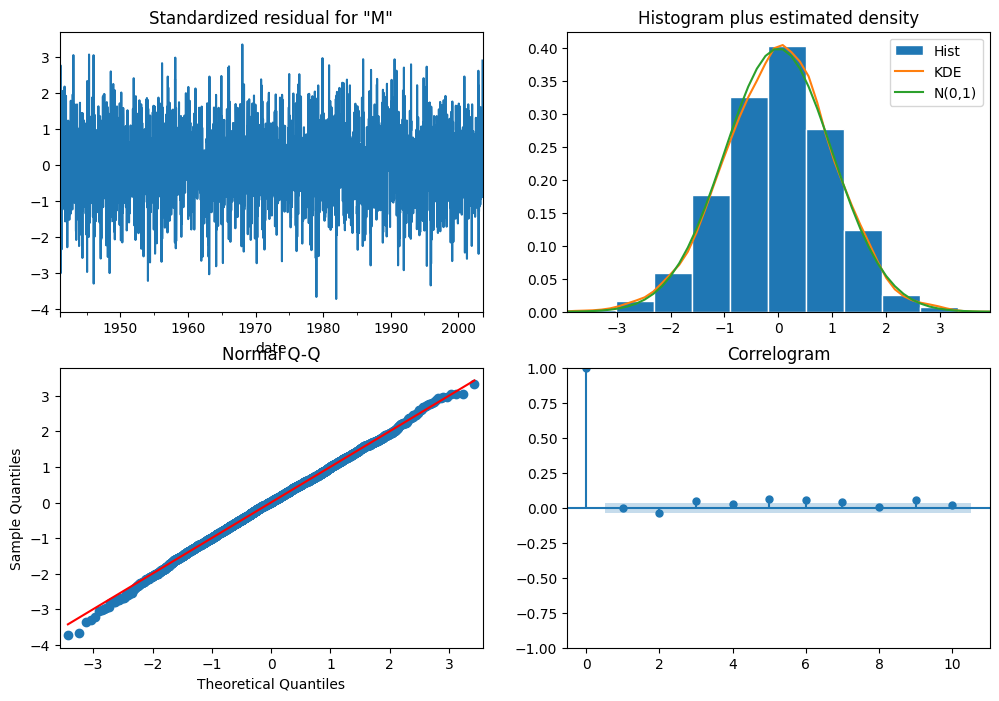

In [ ]:
model_weekly_s_2.plot_diagnostics(figsize=(12, 8))
plt.show()

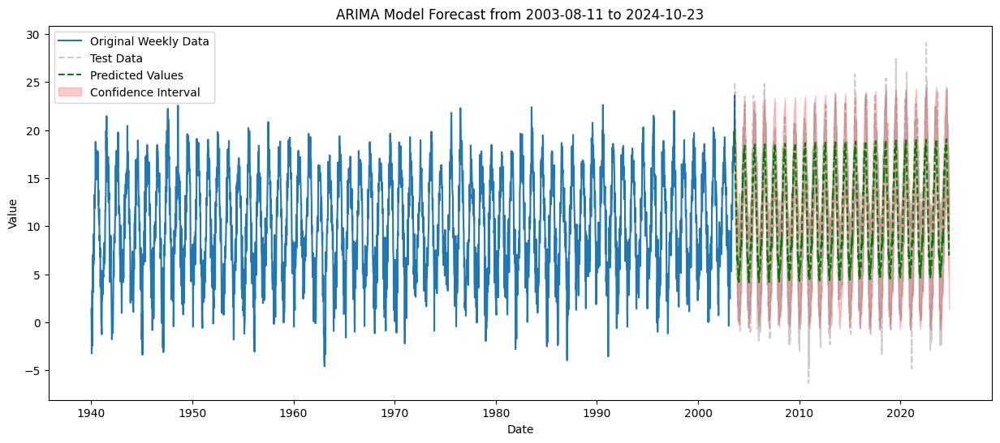

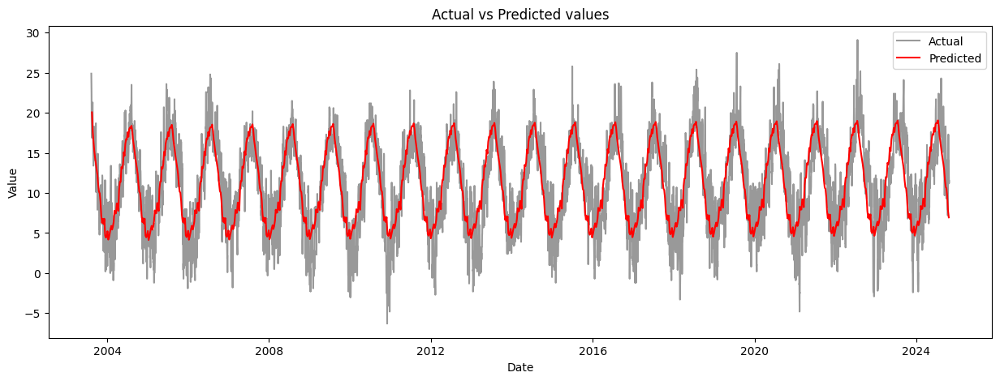

In [ ]:
test_data_indexed = test_data.set_index('date')
weekly_test = test_data_indexed.resample('W').mean().dropna()
forecast_results = model_weekly_s_2.get_forecast(steps=len(weekly_test))
forecast_mean = forecast_results.predicted_mean
forecast_ci = forecast_results.conf_int()
plot_predictions(forecast_mean,forecast_ci,weekly_data,'W')

In [ ]:
import sklearn.metrics as metrics
actual_values = weekly_test['mean_temperature'].values
ARIMA_metrics(forecast_mean, actual_values)

Error metrics:
MAE: 2.360731693349132
MSE: 8.615182339344681
RMSE: 2.935163085646977
MAPE: 139.41458021541345 %


Let's try using now our data with trend and seasonality taken explicitly.

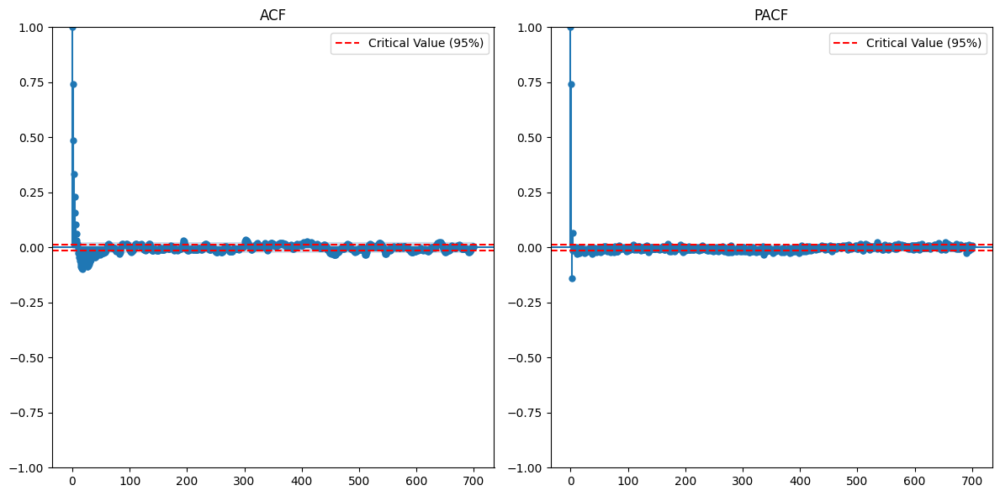

In [ ]:
plot_acf_pacf(difference.dropna(), 700,700)

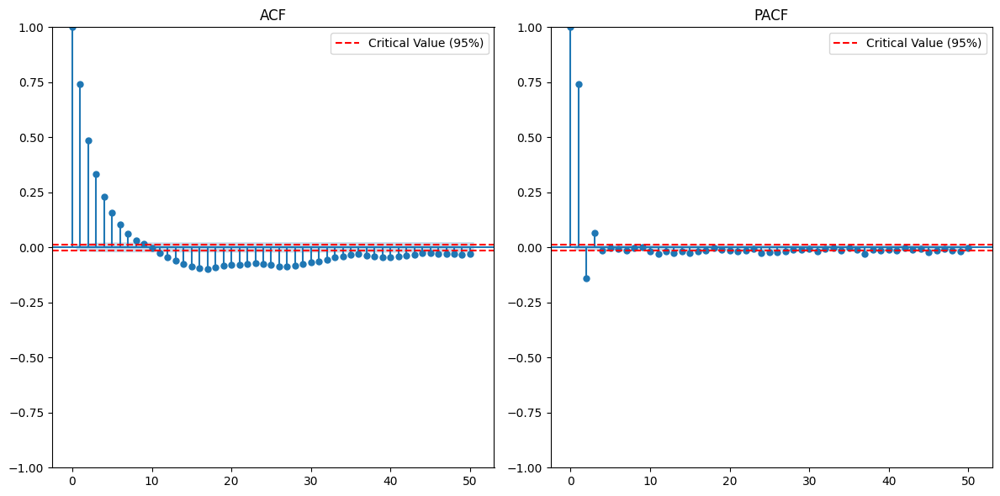

In [ ]:
plot_acf_pacf(difference.dropna(), 50,50)

In [ ]:
best_fit(difference.dropna())

ARIMA(0,0,0) - AIC: 104956.94097391589
ARIMA(0,0,1) - AIC: 91938.81846320513
ARIMA(0,0,2) - AIC: 88633.86610264186
ARIMA(0,1,0) - AIC: 90415.68522161485
ARIMA(0,1,1) - AIC: 90415.73101468256
ARIMA(0,1,2) - AIC: 89118.12040250073
ARIMA(1,0,0) - AIC: 87353.38180440696
ARIMA(1,0,1) - AIC: 86842.341870037
ARIMA(1,0,2) - AIC: 86816.61470965677
ARIMA(1,1,0) - AIC: 90416.52727873172
ARIMA(1,1,1) - AIC: 87357.77299757265
ARIMA(1,1,2) - AIC: 86846.97544005798
ARIMA(2,0,0) - AIC: 86913.14611098301
ARIMA(2,0,1) - AIC: 86820.41933650714
ARIMA(2,0,2) - AIC: 86818.16759677169
ARIMA(2,1,0) - AIC: 89490.7057096424
ARIMA(2,1,1) - AIC: 86917.8016848162
ARIMA(2,1,2) - AIC: 86824.99521688574
Best ARIMA model: ARIMA(1.0,0.0,2.0) - AIC: 86816.61470965677


ARIMA(1,0,2) has the smallest AIC:  86823.425 so we will use it.

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
model_dif = ARIMA(difference.dropna(), order=(2,0,2))
model_fit_dif = model_dif.fit()

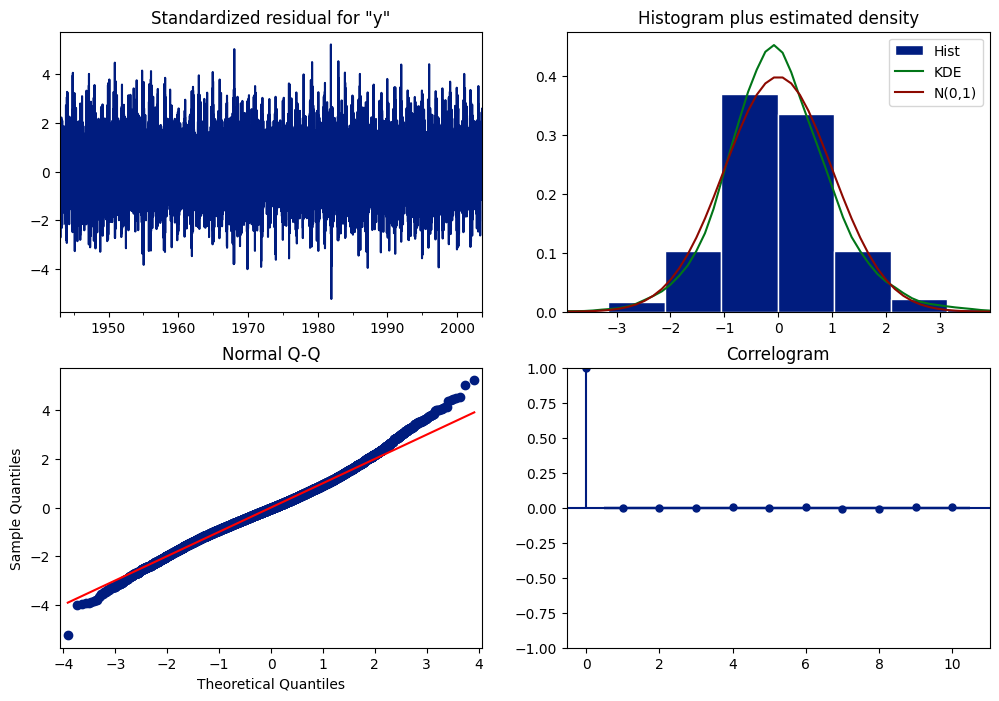

In [ ]:
model_fit_dif.plot_diagnostics(figsize=(12, 8))
plt.show()

In [ ]:
print(model_fit_dif.summary())

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                22138
Model:                 ARIMA(2, 0, 2)   Log Likelihood              -43403.084
Date:                Thu, 28 Nov 2024   AIC                          86818.168
Time:                        15:00:46   BIC                          86866.198
Sample:                    12-31-1942   HQIC                         86833.805
                         - 08-10-2003                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0006      0.042      0.015      0.988      -0.081       0.083
ar.L1          0.7998      0.163      4.909      0.000       0.480       1.119
ar.L2         -0.0728      0.106     -0.686      0.4

The Ljung-Box has a p-value of 1, suggesting that there is no significant autocorrelation in the residuals. The coefficients for the AR terms and MA terms are mostly not statistically significant, only ar.L1 has a p-value of 0.0, being significant. The constant term, arL2, ma.L1 and ma.L2 are all not statistically significant with p-values 0.988, 0.493, 0.734 and 0.025 respectively. The estimated variance of the residuals is 2.9542. The heteroskedasticity test shows a p-value of 0.29, indicating that there is no significant heteroskedasticity, but the Jarque-Bera Test shows that the residuals are not normally distributed, with p-value 0.00.

We add trend and seasonality back to the predictions to see which values would be predicted in reality

In [ ]:
MA.index = train_data["date"]

In [ ]:
SeaTS.index = train_data["date"][-len(SeaTS.dropna()):]

Latest matching date found: 1981-08-11 00:00:00
End date for forecast: 2002-10-24 00:00:00


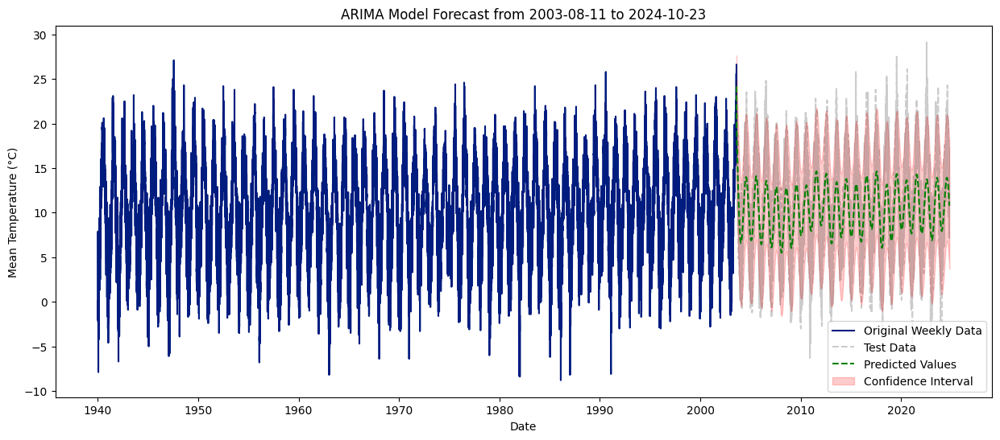

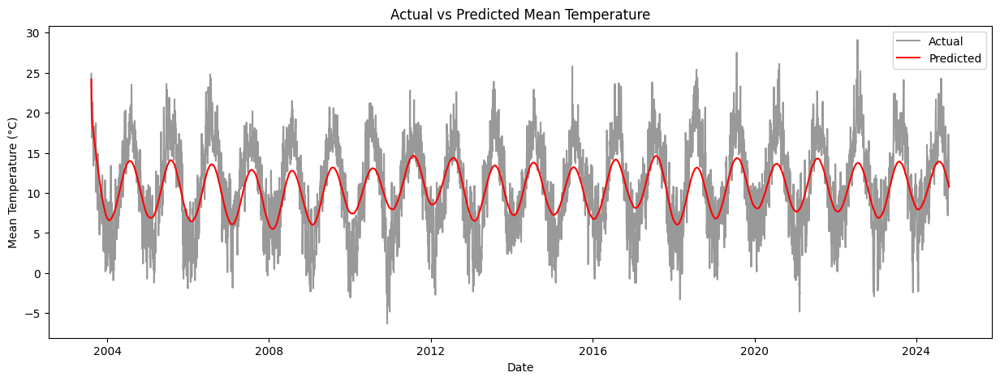

In [ ]:
forecast_length = len(test_data)
forecast = model_fit_dif.get_forecast(steps=forecast_length)
predicted_residuals = forecast.predicted_mean
forecast_ci = forecast.conf_int()

predicted_start_date = predicted_residuals.index[0]
forecast_length = len(predicted_residuals)
latest_matching_date, end_date = find_dates(predicted_start_date, forecast_length, MA, SeaTS)
print(f"Latest matching date found: {latest_matching_date}")
print(f"End date for forecast: {end_date}")

trend_values = MA[latest_matching_date:end_date].values
seasonal_values = SeaTS[latest_matching_date:end_date].values

final_predictions = predicted_residuals.values + trend_values + seasonal_values
predicted_mean = pd.Series(final_predictions, index=predicted_residuals.index)

adjusted_lower_ci = forecast_ci['lower y'] + trend_values + seasonal_values
adjusted_upper_ci = forecast_ci['upper y'] + trend_values + seasonal_values

cis = pd.DataFrame({
    'lower y': adjusted_lower_ci,
    'upper y': adjusted_upper_ci
}, index=predicted_residuals.index)

plot_predictions(final_predictions, cis, dadosTS, 'D')

In [ ]:
ARIMA_metrics(final_predictions)

Error metrics:
MAE: 3.0376150197420375
MSE: 14.297361873589603
RMSE: 3.781185247192949
MAPE: 107.54048961438147 %


We can see that the prediction is not very good.

Let's see how differenced data works when used weekly instead of daily, since with the original TS it was a huge help.

In [ ]:
final_w = difference.dropna().resample('W').mean().dropna()

best_fit(final_w)


ARIMA(0,0,0) - AIC: 12922.77778177923
ARIMA(0,0,1) - AIC: 12708.84506271718
ARIMA(0,0,2) - AIC: 12687.544315375899
ARIMA(0,1,0) - AIC: 14308.884096993568
ARIMA(0,1,1) - AIC: 12927.777311658976
ARIMA(0,1,2) - AIC: 12713.382445562649
ARIMA(1,0,0) - AIC: 12763.902010920003
ARIMA(1,0,1) - AIC: 12698.166375553155
ARIMA(1,0,2) - AIC: 12305.73432454155
ARIMA(1,1,0) - AIC: 14060.20419049725
ARIMA(1,1,1) - AIC: 12768.435968924832
ARIMA(1,1,2) - AIC: 12702.81553531428
ARIMA(2,0,0) - AIC: 12657.330865291871
ARIMA(2,0,1) - AIC: 12301.96937777464
ARIMA(2,0,2) - AIC: 12293.698377871848
ARIMA(2,1,0) - AIC: 13754.151971466355
ARIMA(2,1,1) - AIC: 12662.224077245944
ARIMA(2,1,2) - AIC: 12316.896143054311
Best ARIMA model: ARIMA(2.0,0.0,2.0) - AIC: 12293.698377871848


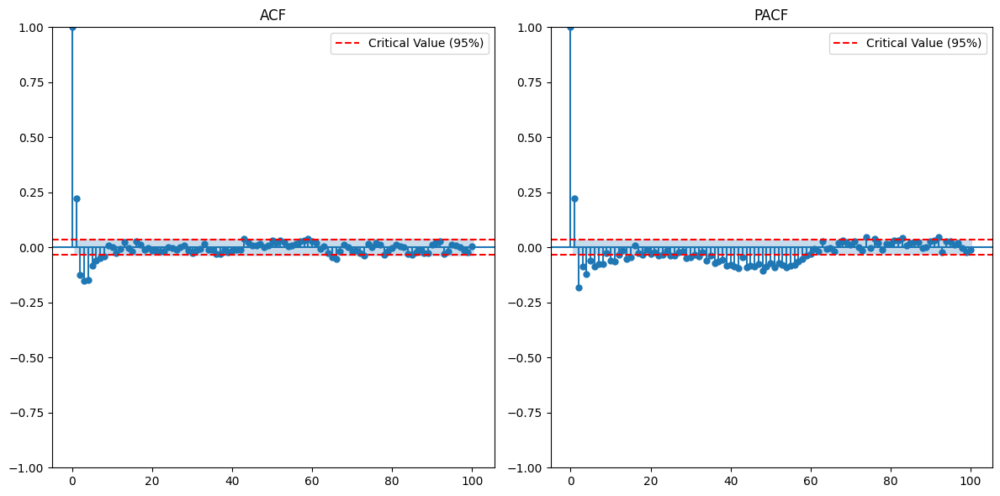

In [ ]:
plot_acf_pacf(final_w,100,100)

In [ ]:
model_w_dif_ = ARIMA(final_w, order = (2,0,2))
model_w_dif = model_w_dif_.fit()

In [ ]:
print(model_w_dif.summary())

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 3163
Model:                 ARIMA(2, 0, 2)   Log Likelihood               -6140.849
Date:                Fri, 29 Nov 2024   AIC                          12293.698
Time:                        15:33:08   BIC                          12330.054
Sample:                    01-03-1943   HQIC                         12306.740
                         - 08-10-2003                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const      -1.633e-05      0.000     -0.091      0.928      -0.000       0.000
ar.L1          0.9446      0.048     19.732      0.000       0.851       1.038
ar.L2         -0.1890      0.043     -4.348      0.0

Latest matching date found: 1981-08-17 00:00:00
End date for forecast: 2002-11-04 00:00:00


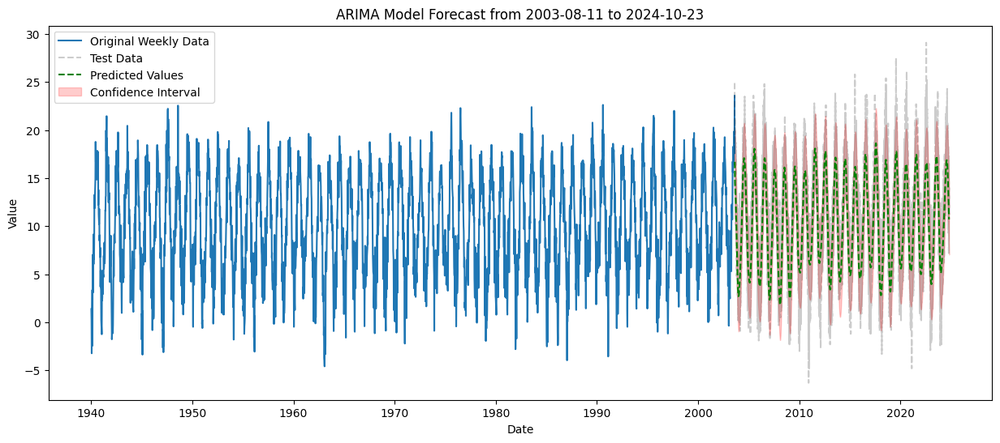

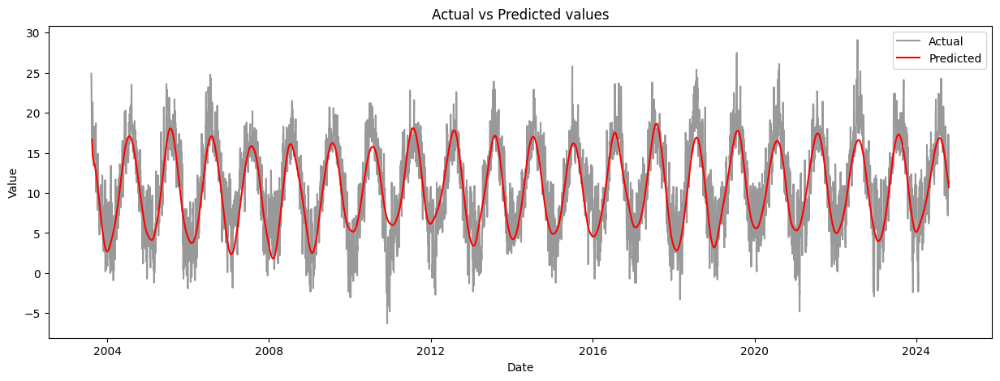

In [ ]:
test_data_indexed = test_data.set_index('date')
weekly_test = test_data_indexed.resample('W').mean().dropna()
weekly_data = dadosTS.resample('W').mean().dropna()

forecast_length = len(weekly_test)
forecast = model_w_dif.get_forecast(steps=forecast_length)
predicted_residuals = forecast.predicted_mean
forecast_ci = forecast.conf_int()

seasonal_weekly = SeaTS.dropna().resample('W').mean()
MA_date = MA.copy()
MA_date = MA_date[-len(SeaTS.dropna()):]
MA_date.index =  SeaTS.dropna().index
MA_weekly = MA_date.resample('W').mean()

predicted_start_date = predicted_residuals.index[0]
forecast_length = len(predicted_residuals)
latest_matching_date, end_date = find_dates(predicted_start_date, forecast_length, MA_weekly, seasonal_weekly, "W")

print(f"Latest matching date found: {latest_matching_date}")
print(f"End date for forecast: {end_date}")


trend_values = MA_weekly[latest_matching_date:end_date].values
seasonal_values = seasonal_weekly[latest_matching_date:end_date].values

valores = predicted_residuals + trend_values +seasonal_values
forecast_ci["lower y"] = forecast_ci["lower y"] + trend_values + seasonal_values
forecast_ci["upper y"] = forecast_ci["upper y"] + trend_values+ seasonal_values

plot_predictions(valores,forecast_ci,weekly_data,'W')

In [ ]:
import sklearn.metrics as metrics
test_data_indexed = test_data.set_index('date')
weekly_test = test_data_indexed.resample('W').mean().dropna()
actual_values = weekly_test['mean_temperature'].values
ARIMA_metrics(valores, actual_values)

Error metrics:
MAE: 1.9275277759990166
MSE: 6.039564805744679
RMSE: 2.457552604878414
MAPE: 106.095725177268 %


Having the objective to have the most accurate predictions in absolute terms, using weekly data of the original data series with no trend and seasonality taken by MA and Butterworth Infinite Impulse Response filter is the best option.

Let's try using SARIMA in the detrend and deseasonalized TS, with weekly data as it showed the best results.

In [ ]:
final_w = difference.dropna().resample('W').mean().dropna()

ADF_test(final_w)

ADF Statistic: -15.77081748767361
p-value: 1.1615919160469887e-28
Critical Values:
   1%: -3.4324389453866817
   5%: -2.8624629669644266
   10%: -2.5672613171352516
It is stationary!


In [ ]:
final_w = difference.dropna().resample('W').mean().dropna()

ADF_test(final_w[:52]) #52 weeks = 1 year

ADF Statistic: -5.843571643073576
p-value: 3.728421488511622e-07
Critical Values:
   1%: -3.5656240522121956
   5%: -2.920142229157715
   10%: -2.598014675124952
It is stationary!


Text(42.722222222222214, 0.5, 'Par. Autocorrelation')

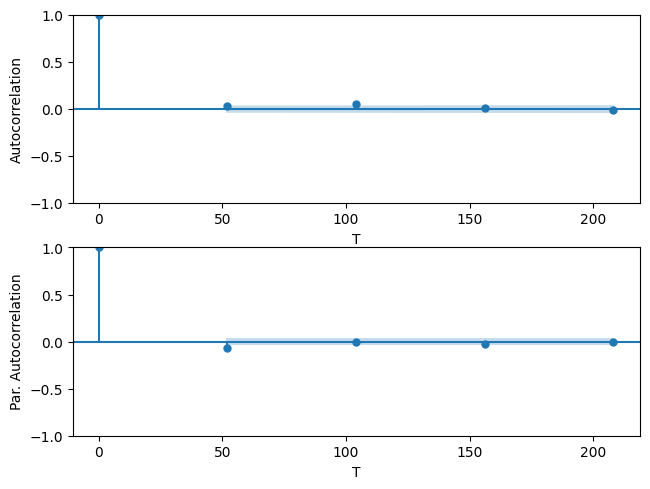

In [ ]:
fig, axs=plt.subplots(2)
fig.tight_layout()

plot_acf(final_w[:].dropna(),lags=range(0,52*5,52),ax=axs[0],title='')
axs[0].set_xlabel("T")
axs[0].set_ylabel("Autocorrelation")
plot_pacf(final_w[:].dropna(),ax=axs[1],title='',lags=range(0,52*5,52))
axs[1].set_xlabel("T")
axs[1].set_ylabel("Par. Autocorrelation")

In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
final_w = difference.dropna().resample('W').mean().dropna()

model_sarima_w_dif = SARIMAX(final_w, order=(2, 0, 2), seasonal_order=(1, 1, 2, 52))
model_weekly_s_dif = model_sarima_w_dif.fit()

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [ ]:
print(model_weekly_s_dif.summary())

                                     SARIMAX Results                                      
Dep. Variable:                                  y   No. Observations:                 1582
Model:             SARIMAX(2, 0, 2)x(1, 1, 2, 52)   Log Likelihood               -2980.012
Date:                            Mon, 02 Dec 2024   AIC                           5976.025
Time:                                    17:19:02   BIC                           6018.689
Sample:                                04-22-1973   HQIC                          5991.903
                                     - 08-10-2003                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.2635      0.051     24.994      0.000       1.164       1.363
ar.L2         -0.5512      0.040   

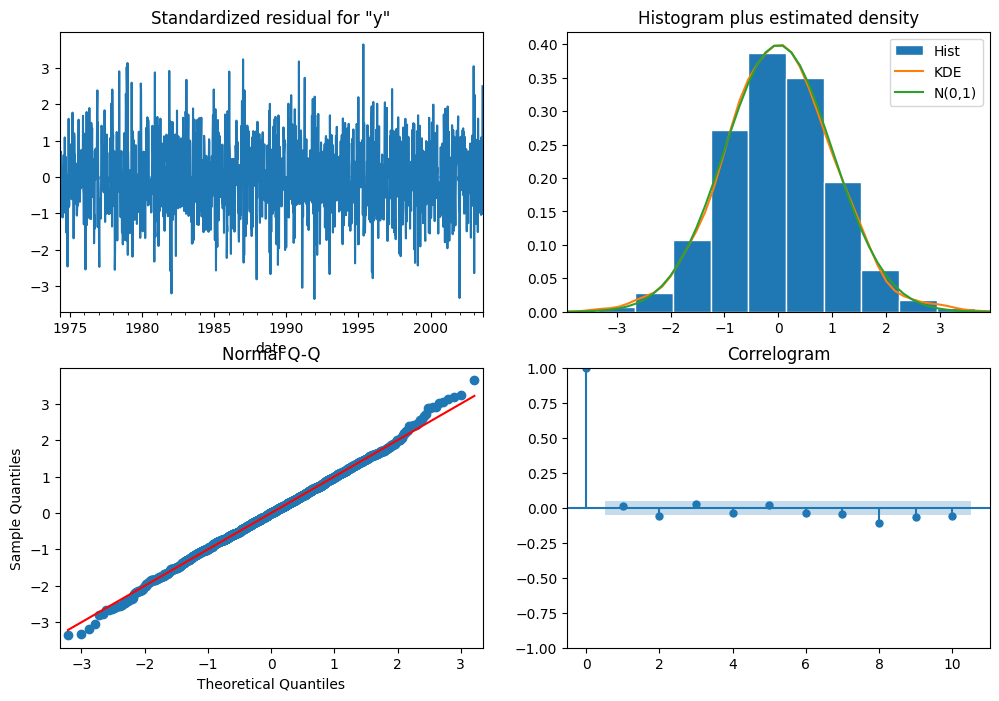

In [ ]:
model_weekly_s_dif.plot_diagnostics(figsize=(12, 8))
plt.show()

Latest matching date found: 1981-08-17 00:00:00
End date for forecast: 2002-11-04 00:00:00


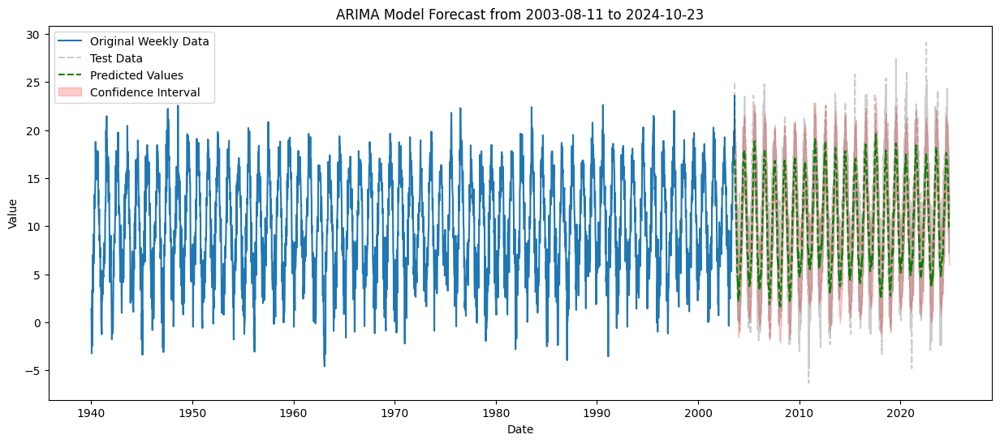

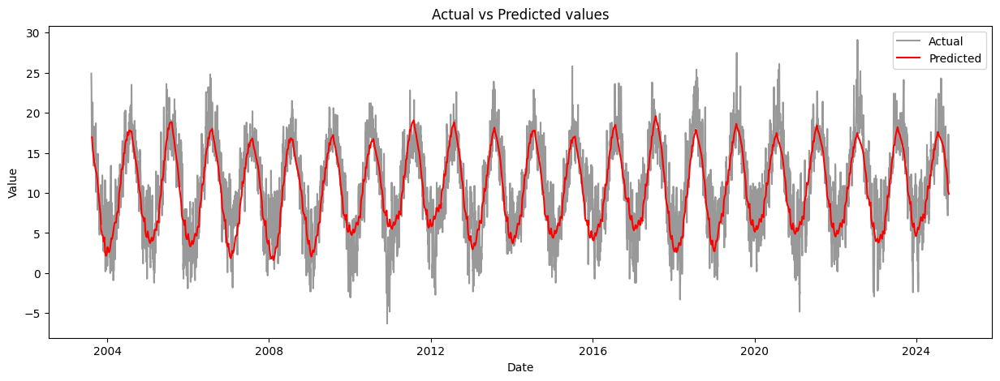

In [ ]:
test_data_indexed = test_data.set_index('date')
weekly_test = test_data_indexed.resample('W').mean().dropna()
forecast_results_dif = model_weekly_s_dif.get_forecast(steps=len(weekly_test))
forecast_mean_dif = forecast_results_dif.predicted_mean
forecast_ci_dif = forecast_results_dif.conf_int()
SeaTS.index = train_data["date"][-len(SeaTS):]
weekly_test = test_data_indexed.resample('W').mean().dropna()
weekly_data = dadosTS.resample('W').mean().dropna()

seasonal_weekly = SeaTS.dropna().resample('W').mean()
MA_date = MA.copy()
MA_date = MA_date[-len(SeaTS.dropna()):]
MA_date.index =  SeaTS.dropna().index
MA_weekly = MA_date.resample('W').mean()

predicted_start_date = forecast_mean_dif.index[0]
forecast_length = len(forecast_mean_dif)
latest_matching_date, end_date = find_dates(predicted_start_date, forecast_length, MA_weekly, seasonal_weekly, "W")

print(f"Latest matching date found: {latest_matching_date}")
print(f"End date for forecast: {end_date}")


trend_values = MA_weekly[latest_matching_date:end_date].values
seasonal_values = seasonal_weekly[latest_matching_date:end_date].values

valores_dif = forecast_mean_dif + trend_values +seasonal_values
forecast_ci_dif["lower y"] = forecast_ci_dif["lower y"] + trend_values + seasonal_values
forecast_ci_dif["upper y"] = forecast_ci_dif["upper y"] + trend_values+ seasonal_values

plot_predictions(valores_dif,forecast_ci_dif,weekly_data,'W')

In [ ]:
import sklearn.metrics as metrics
test_data_indexed = test_data.set_index('date')
weekly_test = test_data_indexed.resample('W').mean().dropna()
actual_values = weekly_test['mean_temperature'].values
ARIMA_metrics(valores_dif, actual_values)

Error metrics:
MAE: 1.97132021776451
MSE: 6.259286681640415
RMSE: 2.5018566469005403
MAPE: 101.75496828692336 %


We will now try with D=0 as we didn't see and seasonality when doing seasonal differencing

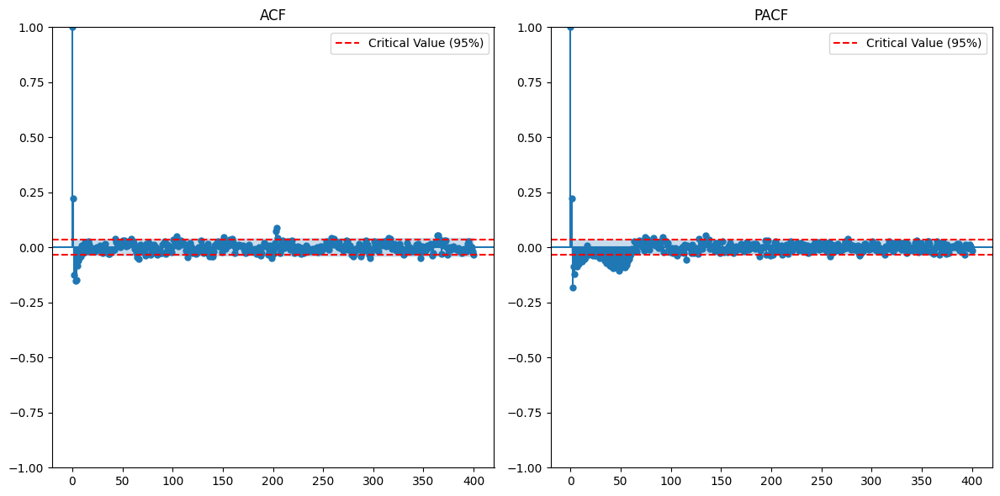

In [ ]:
plot_acf_pacf(final_w,400,400)

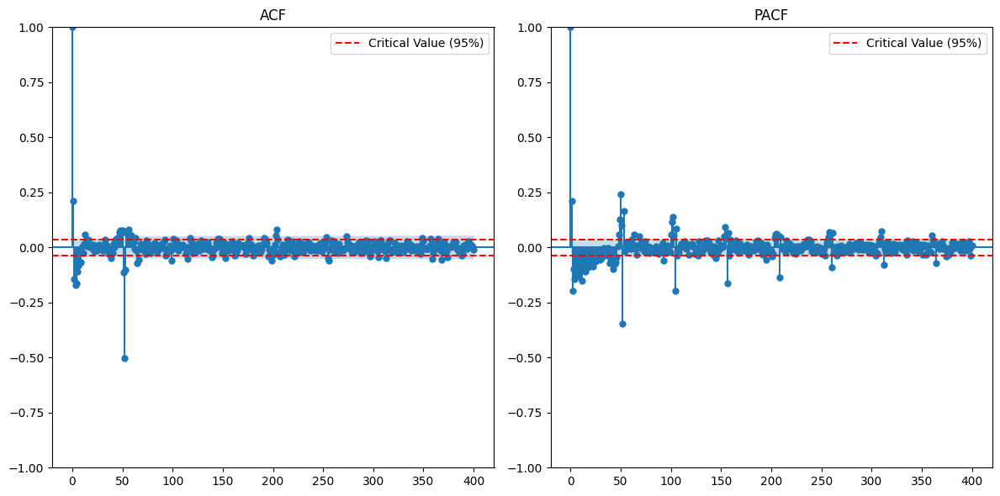

In [ ]:
plot_acf_pacf(final_w.diff(52),400,400)

In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
final_w = difference.dropna().resample('W').mean().dropna()

model_sarima_w_dif_noD = SARIMAX(final_w, order=(2, 0, 2), seasonal_order=(1, 0, 2, 52))
model_weekly_s_dif_noD = model_sarima_w_dif_noD.fit()

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [ ]:
print(model_weekly_s_dif_noD.summary())

                                     SARIMAX Results                                      
Dep. Variable:                                  y   No. Observations:                 1582
Model:             SARIMAX(2, 0, 2)x(1, 0, 2, 52)   Log Likelihood               -3037.808
Date:                            Mon, 02 Dec 2024   AIC                           6091.616
Time:                                    17:41:26   BIC                           6134.548
Sample:                                04-22-1973   HQIC                          6107.567
                                     - 08-10-2003                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.1936      0.054     22.200      0.000       1.088       1.299
ar.L2         -0.4724      0.044   

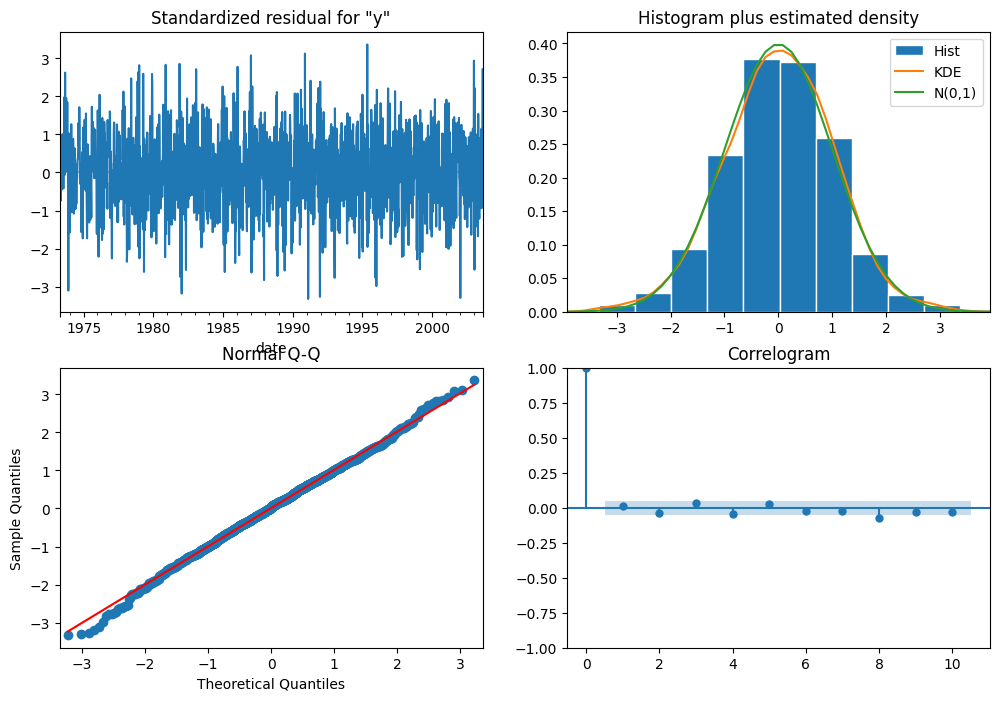

In [ ]:
model_weekly_s_dif_noD.plot_diagnostics(figsize=(12, 8))
plt.show()

Latest matching date found: 1981-08-17 00:00:00
End date for forecast: 2002-11-04 00:00:00


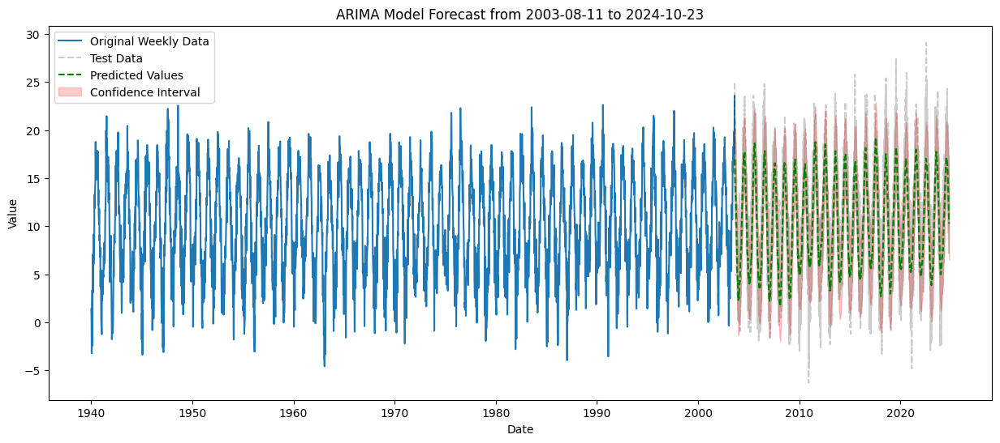

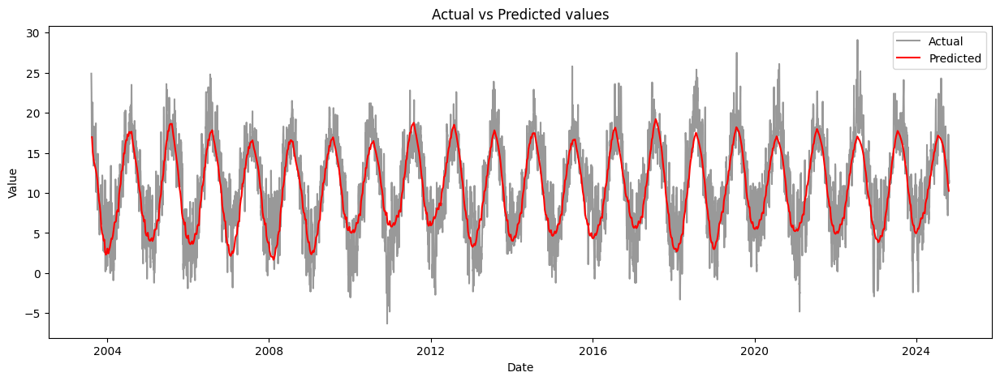

In [ ]:
test_data_indexed = test_data.set_index('date')
weekly_test = test_data_indexed.resample('W').mean().dropna()
forecast_results_dif = model_weekly_s_dif_noD.get_forecast(steps=len(weekly_test))
forecast_mean_dif = forecast_results_dif.predicted_mean
forecast_ci_dif = forecast_results_dif.conf_int()
SeaTS.index = train_data["date"][-len(SeaTS):]
weekly_test = test_data_indexed.resample('W').mean().dropna()
weekly_data = dadosTS.resample('W').mean().dropna()

seasonal_weekly = SeaTS.dropna().resample('W').mean()
MA_date = MA.copy()
MA_date = MA_date[-len(SeaTS.dropna()):]
MA_date.index =  SeaTS.dropna().index
MA_weekly = MA_date.resample('W').mean()

predicted_start_date = forecast_mean_dif.index[0]
forecast_length = len(forecast_mean_dif)
latest_matching_date, end_date = find_dates(predicted_start_date, forecast_length, MA_weekly, seasonal_weekly, "W")

print(f"Latest matching date found: {latest_matching_date}")
print(f"End date for forecast: {end_date}")


trend_values = MA_weekly[latest_matching_date:end_date].values
seasonal_values = seasonal_weekly[latest_matching_date:end_date].values

valores_dif = forecast_mean_dif + trend_values +seasonal_values
forecast_ci_dif["lower y"] = forecast_ci_dif["lower y"] + trend_values + seasonal_values
forecast_ci_dif["upper y"] = forecast_ci_dif["upper y"] + trend_values+ seasonal_values

plot_predictions(valores_dif,forecast_ci_dif,weekly_data,'W')

In [ ]:
import sklearn.metrics as metrics
test_data_indexed = test_data.set_index('date')
weekly_test = test_data_indexed.resample('W').mean().dropna()
actual_values = weekly_test['mean_temperature'].values
ARIMA_metrics(valores_dif, actual_values)

Error metrics:
MAE: 1.9417477877494786
MSE: 6.1131631112881175
RMSE: 2.4724811650016907
MAPE: 102.79164315909537 %


## Cross Validation

In [ ]:
import numpy as np

In [ ]:
device = 0

In [ ]:
dadosTS_mean=pd.Series(data=np.array(df_weather["mean_temperature"]),index=df_weather["date"],name="Mean temperature")
dadosTS_mean.dropna()
dadosTS_min=pd.Series(data=np.array(df_weather["min_temperature"]),index=df_weather["date"],name="Min temperature")
dadosTS_min.dropna()
dadosTS_rain=pd.Series(data=np.array(df_weather["rain"]),index=df_weather["date"],name="Rain")
dadosTS_rain.dropna()
dadosTS_wind=pd.Series(data=np.array(df_weather["wind"]),index=df_weather["date"],name="Wind")
dadosTS_wind.dropna()


,Wind
date,
1940-01-02,17.2
1940-01-03,19.1
1940-01-04,17.7
1940-01-05,9.2
1940-01-06,20.2
...,...
2024-10-19,21.1
2024-10-20,36.7
2024-10-21,22.8


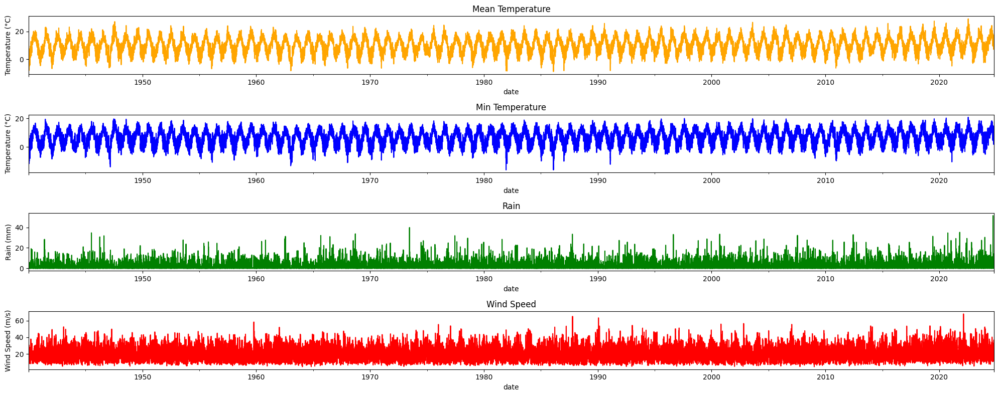

In [ ]:
fig, axs = plt.subplots(4, 1, figsize=(20, 8))

dadosTS_mean.plot(ax=axs[0], color='orange', title='Mean Temperature')
axs[0].set_ylabel('Temperature (°C)')

dadosTS_min.plot(ax=axs[1], color='blue', title='Min Temperature')
axs[1].set_ylabel('Temperature (°C)')

dadosTS_rain.plot(ax=axs[2], color='green', title='Rain')
axs[2].set_ylabel('Rain (mm)')

dadosTS_wind.plot(ax=axs[3], color='red', title='Wind Speed')
axs[3].set_ylabel('Wind Speed (m/s)')

plt.tight_layout()
plt.show()

In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

meanCTS = pd.Series(data=scaler.fit_transform(dadosTS_mean.values.reshape(-1, 1)).flatten(),
                              index=dadosTS_mean.index, name='Mean Temperature (Norm)')

minCTS = pd.Series(data=scaler.fit_transform(dadosTS_min.values.reshape(-1, 1)).flatten(),
                             index=dadosTS_min.index, name='Min Temperature (Norm)')

rainCTS = pd.Series(data=scaler.fit_transform(dadosTS_rain.values.reshape(-1, 1)).flatten(),
                              index=dadosTS_rain.index, name='Rain (Norm)')

windCTS = pd.Series(data=scaler.fit_transform(dadosTS_wind.values.reshape(-1, 1)).flatten(),
                              index=dadosTS_wind.index, name='Wind (Norm)')




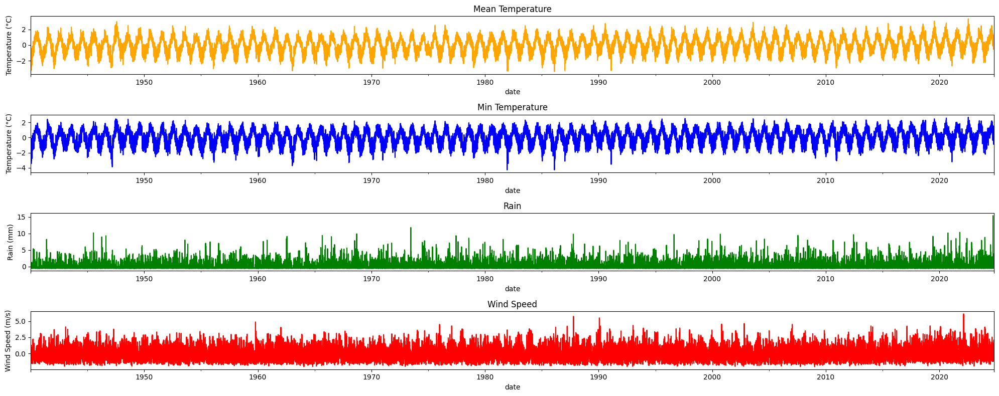

In [ ]:
fig, axs = plt.subplots(4, 1, figsize=(20, 8))

meanCTS.plot(ax=axs[0], color='orange', title='Mean Temperature')
axs[0].set_ylabel('Temperature (°C)')

minCTS.plot(ax=axs[1], color='blue', title='Min Temperature')
axs[1].set_ylabel('Temperature (°C)')

rainCTS.plot(ax=axs[2], color='green', title='Rain')
axs[2].set_ylabel('Rain (mm)')

windCTS.plot(ax=axs[3], color='red', title='Wind Speed')
axs[3].set_ylabel('Wind Speed (m/s)')

plt.tight_layout()
plt.show()

In [ ]:
X=[]
X.append(meanCTS)
X.append(minCTS)
X.append(rainCTS)
X.append(windCTS)

<ipython-input-25-0122f79b88d2>:7: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  covCoef=covCoef+(timeserie1[n]-mu1)*(timeserie2[n+T]-mu2)
/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  func(*args, **kwargs)


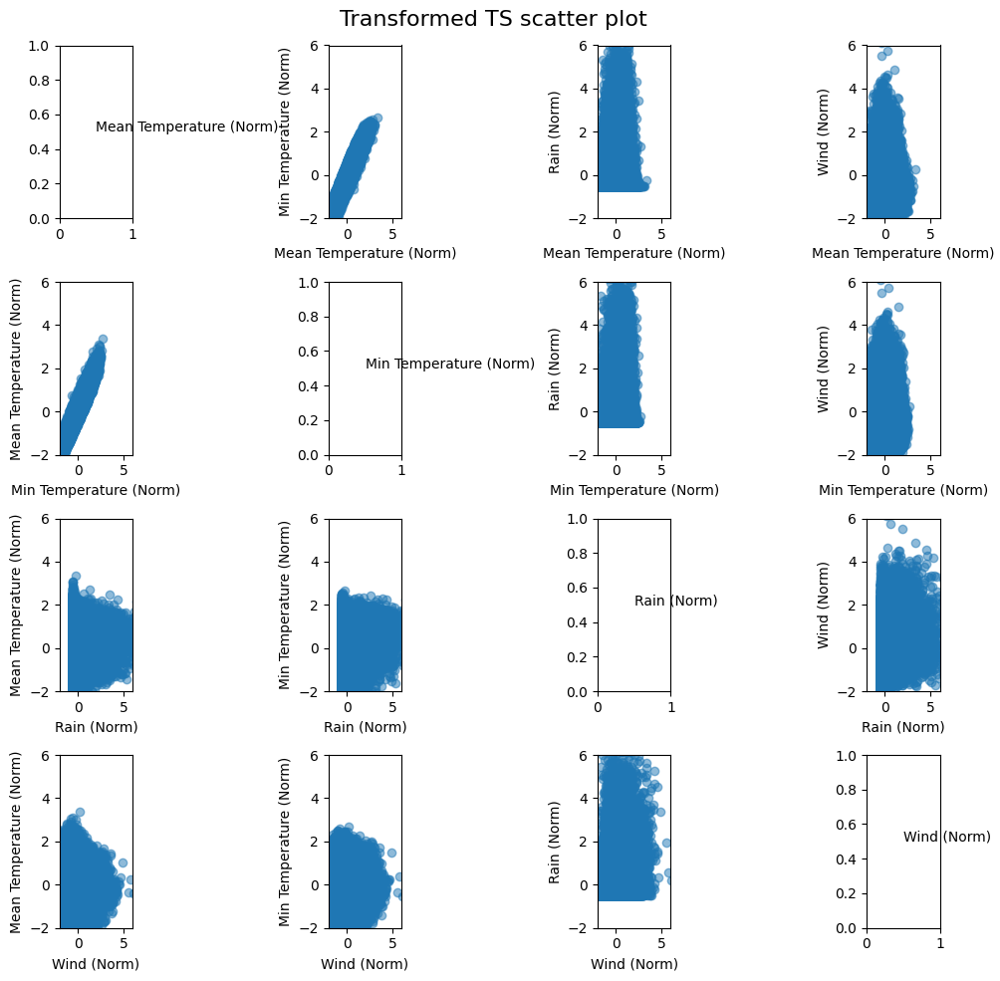

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  fig.canvas.print_figure(bytes_io, **kw)


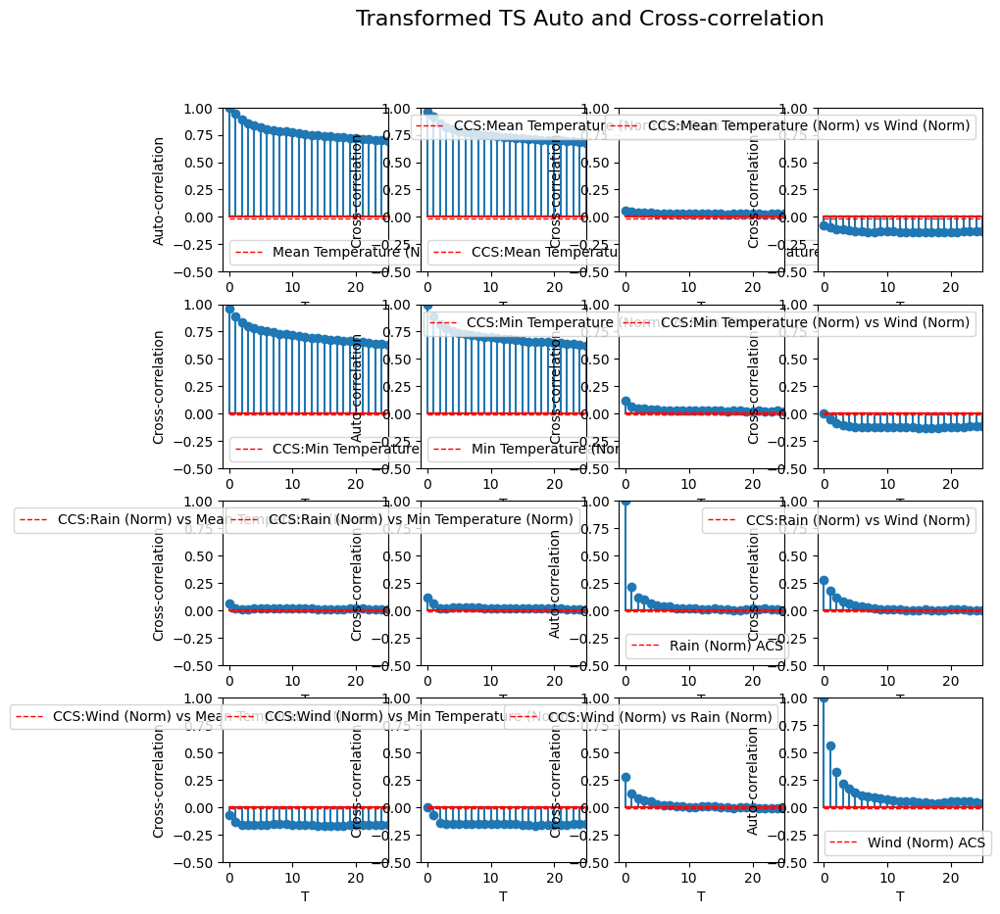

In [ ]:
def crosscov(timeserie1,timeserie2,T=0):
    N=np.array([timeserie1.size,timeserie2.size]).min()
    mu1=timeserie1.mean()
    mu2=timeserie2.mean()
    covCoef=0
    for n in range(0,N-T-1):
        covCoef=covCoef+(timeserie1[n]-mu1)*(timeserie2[n+T]-mu2)
    return covCoef/float(np.abs(N))


def crosscoef(timeserie1,timeserie2,T=0):
    s1=timeserie1.std()
    s2=timeserie2.std()
    return crosscov(timeserie1,timeserie2,T)/(s1*s2)

def ccs(timeserie1,timeserie2,maxT,twoside=False):
    N=np.array([timeserie1.size,timeserie2.size]).min()
    if twoside:
        corrl=np.zeros(2*maxT+1)
        ix=np.array(range(maxT+1))
        ix=np.concatenate((-np.flip(ix[1:]),ix),axis=0)
    else:
        corrl=np.zeros(maxT+1)
        ix=np.array(range(maxT+1))

    for i in range(maxT+1):
        if twoside:
            if i==0:
                corrl[i+maxT]=crosscoef(timeserie1,timeserie2,i);
            else:
                corrl[i+maxT]=crosscoef(timeserie1,timeserie2,i);
                corrl[maxT-i]=crosscoef(timeserie2,timeserie1,i);
        else:
            corrl[i]=crosscoef(timeserie1,timeserie2,i);
    d = {'CCS':corrl, 'upsig':np.ones(maxT+1)*(1.96/np.sqrt(N)),'dnsig':-np.ones(maxT+1)*(1.96/np.sqrt(N))}
    corrl=pd.DataFrame(data=d,index=ix)
    return corrl

def plotScatterMatrix(X,fsize=(10,10),axi=[-2,6,-2,6],title='Scatter Plot'):
    nTS=len(X)
    figs,axs=plt.subplots(nTS,nTS, tight_layout=True,figsize=fsize)
    figs.suptitle(title, fontsize=16)
    for i in range(nTS):
        for j in range(nTS):
            if i!=j:
                #corrl.name='CCS:'+X[i].name+' vs '+X[j].name
                #ylbl="Cross-correlation"
                axs[i,j].scatter(X[i],X[j], alpha=0.5)
                axs[i,j].set_xlabel(X[i].name)
                axs[i,j].set_ylabel(X[j].name)
                #axs[i,j].legend([corrl.name])
                axs[i,j].axis(axi)
            else:
                axs[i,j].text(0.5,0.5,X[i].name)


def plotCCSMatrix(X,maxT=25,fsize=(10,10),axi=[-1,25,-0.5,1],title='Auto- Cross-correlation Plots'):
    nTS=len(X)
    figs,axs=plt.subplots(nTS,nTS, tight_layout=True,figsize=fsize)
    figs.suptitle(title, fontsize=16)
    for i in range(nTS):
        for j in range(nTS):
            corrl=ccs(X[i],X[j],maxT)
            if i==j:
                corrl.name=X[i].name+' ACS'
                ylbl="Auto-correlation"
            else:
                corrl.name='CCS:'+X[i].name+' vs '+X[j].name
                ylbl="Cross-correlation"

            axs[i,j].stem(corrl.index,corrl['CCS'])
            axs[i,j].plot(corrl.index,corrl['upsig'],linestyle='--', color='r', linewidth=1)
            axs[i,j].plot(corrl.index,corrl['dnsig'],linestyle='--', color='r', linewidth=1)
            axs[i,j].set_xlabel("T")
            axs[i,j].set_ylabel(ylbl)
            axs[i,j].legend([corrl.name])
            axs[i,j].axis(axi)


plotScatterMatrix(X,title='Transformed TS scatter plot')

plotCCSMatrix(X,title='Transformed TS Auto and Cross-correlation')

Observing the scatter plots and CCS plots we see a little correlation between mean temperature and min temperature. Regarding rain and wind, the mean temperature past values seem to influence a little their current values but the oposite is not true (past values of raina and wind don't seem to influence mean temperature's values).

For this reason, a single equation model is not a good appropiate. We shall look into Multiple Equation Models. Let's try to use a VAR model

phi=
[[[ 1.1341676  -0.20070164 -0.01069846 -0.04744133]
  [ 0.79926606  0.11964904  0.00579412 -0.01575928]
  [ 0.0295729   0.00923546  0.18577384  0.07407243]
  [ 0.02901095 -0.09052312  0.04120485  0.55844623]]]


<ipython-input-12-fbcd1b195cca>:7: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  covCoef=covCoef+(timeserie1[n]-mu1)*(timeserie2[n+T]-mu2)


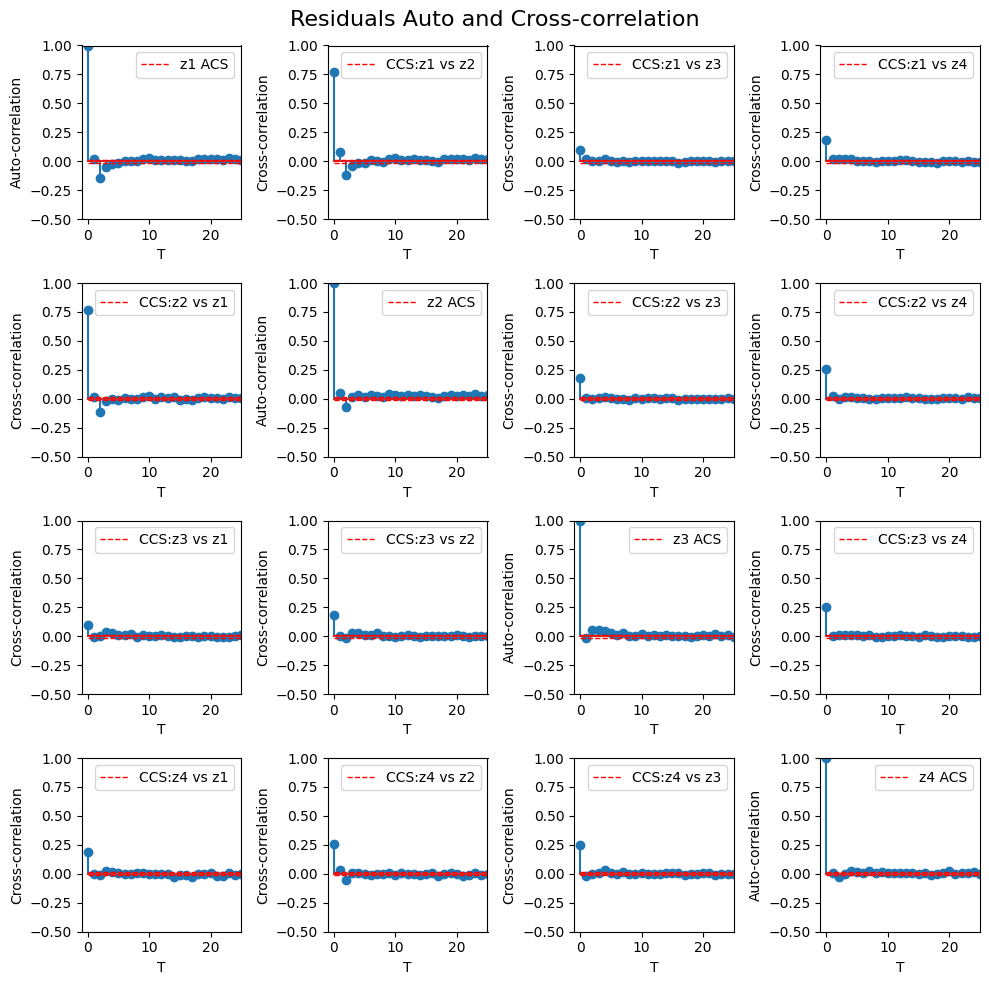

In [ ]:
import statsmodels.api as sm
meanCTS_TR=meanCTS[:train_size]
meanCTS_TE=meanCTS[train_size:]

minCTS_TR=minCTS[:train_size]
minCTS_TE=minCTS[train_size:]

rainCTS_TR=rainCTS[:train_size]
rainCTS_TE=rainCTS[train_size:]

windCTS_TR=windCTS[:train_size]
windCTS_TE=windCTS[train_size:]

trainInputs=np.array([meanCTS_TR, minCTS_TR, rainCTS_TR,windCTS_TR]).transpose()

testInputs=np.array([meanCTS_TE, minCTS_TE,rainCTS_TE,windCTS_TE]).transpose()

mod = sm.tsa.VARMAX(endog=trainInputs, order=(1,0))
res = mod.fit(maxiter=5000, disp=False)
print('phi=')
print(res.coefficient_matrices_var)

#Get residues
resid=res.resid

zmeanTS=pd.Series(data=resid[:,0],index=meanCTS_TR.index, name='z1')
zminTS=pd.Series(data=resid[:,1],index=minCTS_TR.index, name='z2')
zrainTS=pd.Series(data=resid[:,2],index=rainCTS_TR.index, name='z3')
zwindTS=pd.Series(data=resid[:,3],index=windCTS_TR.index, name='z4')

plotCCSMatrix([zmeanTS,zminTS,zrainTS,zwindTS],title='Residuals Auto and Cross-correlation')



<Axes: xlabel='date'>

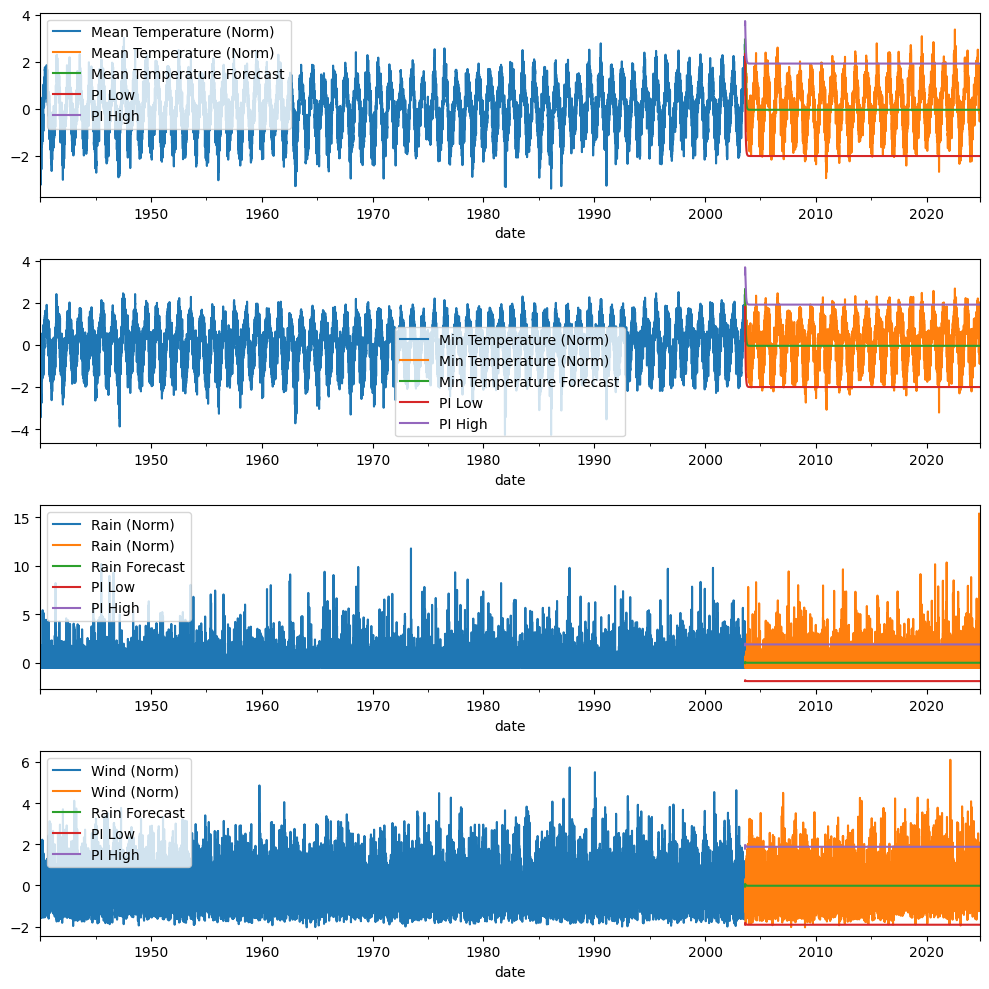

In [ ]:
forecast=res.get_forecast(steps=windCTS_TE.size)

#Plot training + test + forecasts
fig, axs=plt.subplots(4,tight_layout=True,figsize=(10,10))

meanCTS_TR.plot(ax=axs[0],legend=True)
meanCTS_TE.plot(ax=axs[0],legend=True)

minCTS_TR.plot(ax=axs[1],legend=True)
minCTS_TE.plot(ax=axs[1],legend=True)

rainCTS_TR.plot(ax=axs[2],legend=True)
rainCTS_TE.plot(ax=axs[2],legend=True)

windCTS_TR.plot(ax=axs[3],legend=True)
windCTS_TE.plot(ax=axs[3],legend=True)

meanCTS_FC=pd.Series(data=forecast.predicted_mean[:,0],index=meanCTS_TE.index,name='Mean Temperature Forecast')
meanCTS_FC_LCI=pd.Series(data=forecast.conf_int()[:,0],index=meanCTS_TE.index,name='PI Low')
meanCTS_FC_UCI=pd.Series(data=forecast.conf_int()[:,4],index=meanCTS_TE.index,name='PI High')

minCTS_FC=pd.Series(data=forecast.predicted_mean[:,1],index=minCTS_TE.index,name='Min Temperature Forecast')
minCTS_FC_LCI=pd.Series(data=forecast.conf_int()[:,1],index=minCTS_TE.index,name='PI Low')
minCTS_FC_UCI=pd.Series(data=forecast.conf_int()[:,5],index=minCTS_TE.index,name='PI High')

rainCTS_FC=pd.Series(data=forecast.predicted_mean[:,2],index=rainCTS_TE.index,name='Rain Forecast')
rainCTS_FC_LCI=pd.Series(data=forecast.conf_int()[:,2],index=rainCTS_TE.index,name='PI Low')
rainCTS_FC_UCI=pd.Series(data=forecast.conf_int()[:,6],index=rainCTS_TE.index,name='PI High')

windCTS_FC=pd.Series(data=forecast.predicted_mean[:,3],index=windCTS_TE.index,name='Wind Forecast')
windCTS_FC_LCI=pd.Series(data=forecast.conf_int()[:,3],index=windCTS_TE.index,name='PI Low')
windCTS_FC_UCI=pd.Series(data=forecast.conf_int()[:,7],index=windCTS_TE.index,name='PI High')

meanCTS_FC.plot(ax=axs[0],legend=True)
meanCTS_FC_LCI.plot(ax=axs[0],legend=True)
meanCTS_FC_UCI.plot(ax=axs[0],legend=True)

minCTS_FC.plot(ax=axs[1],legend=True)
minCTS_FC_LCI.plot(ax=axs[1],legend=True)
minCTS_FC_UCI.plot(ax=axs[1],legend=True)

rainCTS_FC.plot(ax=axs[2],legend=True)
rainCTS_FC_LCI.plot(ax=axs[2],legend=True)
rainCTS_FC_UCI.plot(ax=axs[2],legend=True)

rainCTS_FC.plot(ax=axs[3],legend=True)
rainCTS_FC_LCI.plot(ax=axs[3],legend=True)
rainCTS_FC_UCI.plot(ax=axs[3],legend=True)



Let's try to predict more time and add trend and seasonality to mean temperature

phi=
[[[ 1.1341676  -0.20070164 -0.01069846 -0.04744133]
  [ 0.79926606  0.11964904  0.00579412 -0.01575928]
  [ 0.0295729   0.00923546  0.18577384  0.07407243]
  [ 0.02901095 -0.09052312  0.04120485  0.55844623]]]


<ipython-input-83-fbcd1b195cca>:7: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  covCoef=covCoef+(timeserie1[n]-mu1)*(timeserie2[n+T]-mu2)


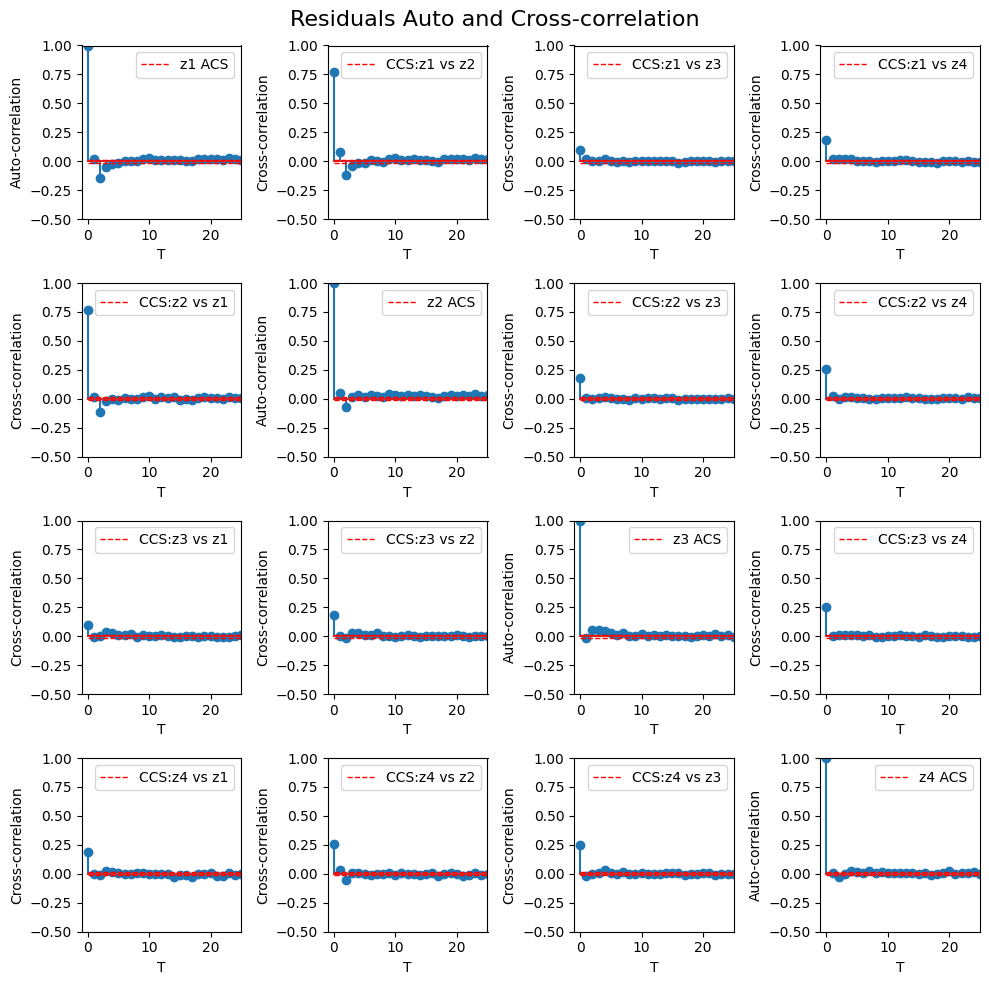

In [ ]:
import statsmodels.api as sm

meanCTS_TR=meanCTS[:train_size]
meanCTS_TE=meanCTS[train_size:]

minCTS_TR=minCTS[:train_size]
minCTS_TE=minCTS[train_size:]

rainCTS_TR=rainCTS[:train_size]
rainCTS_TE=rainCTS[train_size:]

windCTS_TR=windCTS[:train_size]
windCTS_TE=windCTS[train_size:]

trainInputs=np.array([meanCTS_TR, minCTS_TR, rainCTS_TR,windCTS_TR]).transpose()

testInputs=np.array([meanCTS_TE, minCTS_TE,rainCTS_TE,windCTS_TE]).transpose()

mod = sm.tsa.VARMAX(endog=trainInputs, order=(1,0))
res = mod.fit(maxiter=5000, disp=False)
print('phi=')
print(res.coefficient_matrices_var)

#Get residues
resid=res.resid

zmeanTS=pd.Series(data=resid[:,0],index=meanCTS_TR.index, name='z1')
zminTS=pd.Series(data=resid[:,1],index=minCTS_TR.index, name='z2')
zrainTS=pd.Series(data=resid[:,2],index=rainCTS_TR.index, name='z3')
zwindTS=pd.Series(data=resid[:,3],index=windCTS_TR.index, name='z4')

plotCCSMatrix([zmeanTS,zminTS,zrainTS,zwindTS],title='Residuals Auto and Cross-correlation')



Latest matching date found: 1981-08-11 00:00:00
End date for forecast: 2002-10-24 00:00:00


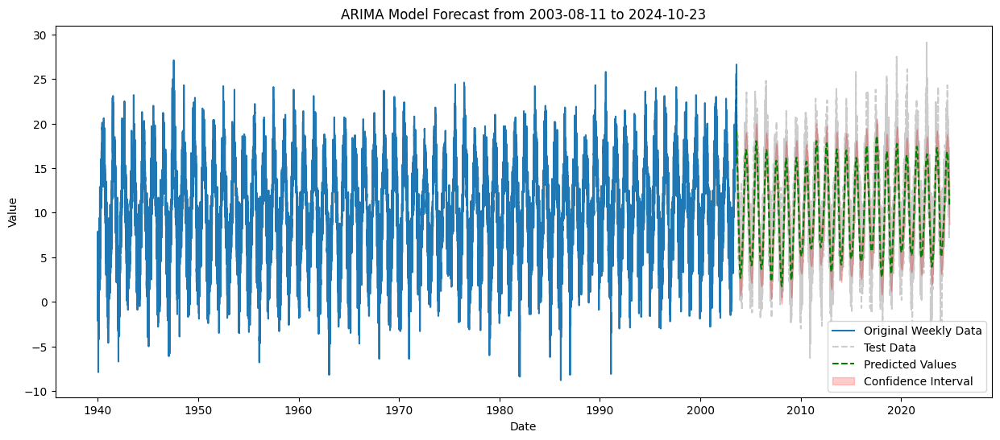

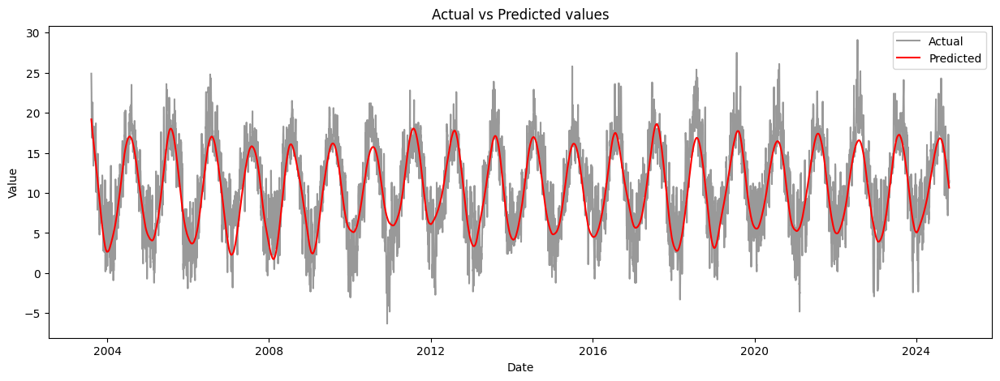

In [ ]:
# Forecast for mean temperature
forecast = res.get_forecast(steps=meanCTS_TE.size)
meanCTS_FC = pd.Series(data=forecast.predicted_mean[:, 0], index=meanCTS_TE.index, name='Mean Temperature Forecast')
meanCTS_FC_LCI = pd.Series(data=forecast.conf_int()[:, 0], index=meanCTS_TE.index, name='PI Low')
meanCTS_FC_UCI = pd.Series(data=forecast.conf_int()[:, 4], index=meanCTS_TE.index, name='PI High')
SeaTS.index = train_data["date"][-len(SeaTS):]

# Prepare the seasonal and trend data
seasonal_weekly = SeaTS.dropna().resample('D').mean()
MA_date = MA.copy()
MA_date = MA_date[-len(SeaTS.dropna()):]
MA_date.index = SeaTS.dropna().index
MA_weekly = MA_date.resample('D').mean()

# Set the predicted start date and length
predicted_start_date = meanCTS_FC.index[0]
forecast_length = len(meanCTS_FC)

# Finding the matching dates
latest_matching_date, end_matching_date = find_dates(predicted_start_date, forecast_length, MA_weekly, seasonal_weekly)

print(f"Latest matching date found: {latest_matching_date}")
print(f"End date for forecast: {end_matching_date}")

# Extracting trend and seasonal values
trend_values = MA_weekly[latest_matching_date:end_matching_date].values
seasonal_values = seasonal_weekly[latest_matching_date:end_matching_date].values

# Calculate forecast values with added trend and seasonal components
valores_dif = meanCTS_FC.values + trend_values + seasonal_values

# Create confidence interval data
forecast_ci_dif = pd.DataFrame(index=meanCTS_FC.index)
forecast_ci_dif["lower y"] = meanCTS_FC_LCI.values + trend_values + seasonal_values
forecast_ci_dif["upper y"] = meanCTS_FC_UCI.values + trend_values + seasonal_values

# Plotting predictions
plot_predictions(valores_dif, forecast_ci_dif, dadosTS, 'D')

plt.show()

In [ ]:
import sklearn.metrics as metrics

actual_values = test_data['mean_temperature'].values
mae = metrics.mean_absolute_error(actual_values, valores_dif)
mse = metrics.mean_squared_error(actual_values, valores_dif)
rmse = np.sqrt(mse)
non_zero_indices = actual_values != 0
mape = np.mean(np.abs((actual_values[non_zero_indices] - valores_dif[non_zero_indices]) / actual_values[non_zero_indices])) * 100

print("Error metrics:")
print("MAE:", mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("MAPE:", mape, "%")

Error metrics:
MAE: 2.3718210513401514
MSE: 8.98316340356306
RMSE: 2.9971925869992173
MAPE: 74.51825889754244 %


The predictions are good. We will now try a more complex model like VARMA



In [ ]:
import itertools

p = range(0, 3)  # AR order
q = range(0, 3)  # MA order
best_aic = float("inf")
best_order = None

for order in itertools.product(p, q):
    try:
        mod = sm.tsa.VARMAX(endog=trainInputs, order=order)
        res = mod.fit(disp=False)
        if res.aic < best_aic:
            best_aic = res.aic
            best_order = order
    except:
        continue

print(f'Best order: AR={best_order[0]}, MA={best_order[1]} with AIC={best_aic}')

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/varmax.py:160: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespac

Best order: AR=2, MA=2 with AIC=128759.67213424697


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/varmax.py:160: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


phi=
[[[ 1.3346759   0.01062936 -0.06504475 -0.13510289]
  [ 1.26830991  0.46321035 -0.06938746  0.069027  ]
  [ 0.18887275 -0.08463049  0.27438381  0.05635225]
  [ 0.00800928 -0.08858932  0.0234116   0.79061641]]

 [[-0.32172552 -0.05748122  0.09197653  0.08099891]
  [-1.13665447  0.40768803  0.0405611  -0.04593537]
  [-0.06234044 -0.02426175  0.40221604 -0.04694989]
  [ 0.00382248  0.00175535  0.09633435 -0.11349795]]]


<ipython-input-37-fbcd1b195cca>:7: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  covCoef=covCoef+(timeserie1[n]-mu1)*(timeserie2[n+T]-mu2)


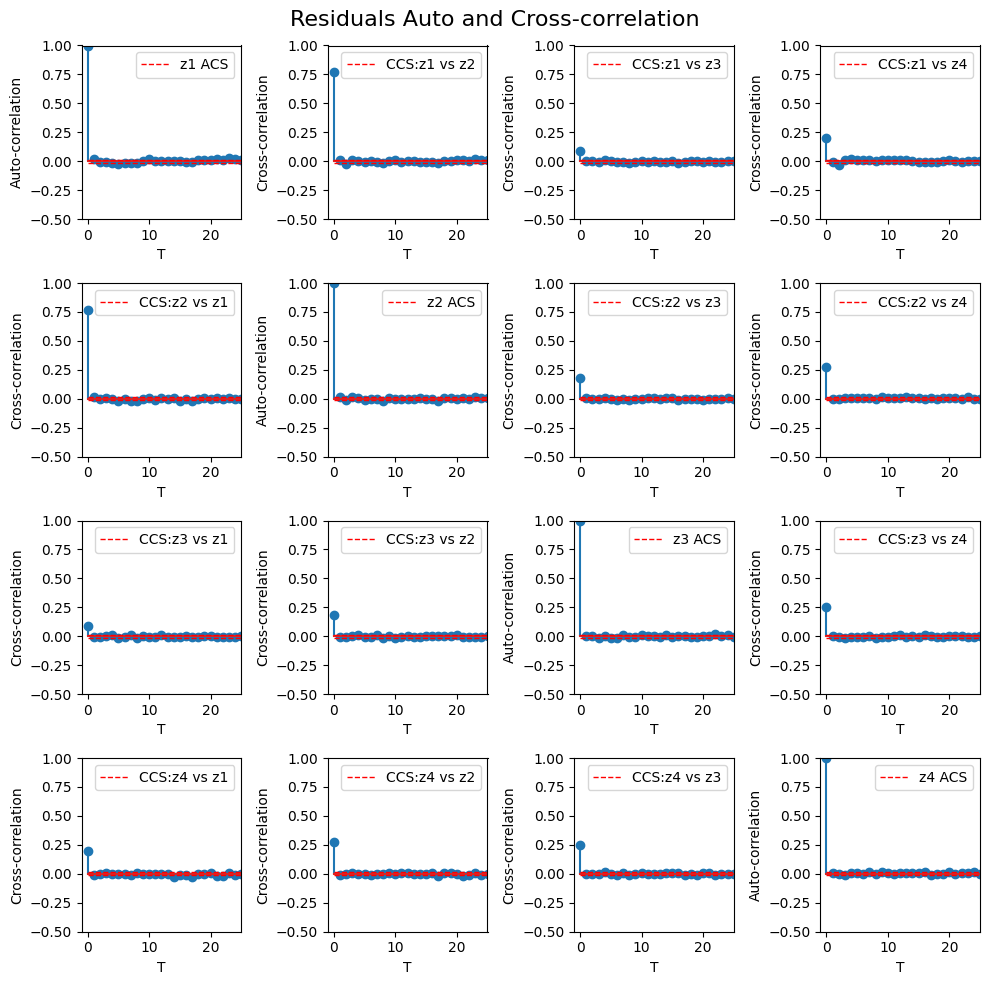

In [ ]:
import statsmodels.api as sm

meanCTS_TR=meanCTS[:train_size]
meanCTS_TE=meanCTS[train_size:]

minCTS_TR=minCTS[:train_size]
minCTS_TE=minCTS[train_size:]

rainCTS_TR=rainCTS[:train_size]
rainCTS_TE=rainCTS[train_size:]

windCTS_TR=windCTS[:train_size]
windCTS_TE=windCTS[train_size:]

trainInputs=np.array([meanCTS_TR, minCTS_TR, rainCTS_TR,windCTS_TR]).transpose()

testInputs=np.array([meanCTS_TE, minCTS_TE,rainCTS_TE,windCTS_TE]).transpose()

mod = sm.tsa.VARMAX(endog=trainInputs, order=(2,2))
res = mod.fit(maxiter=5000, disp=False)
print('phi=')
print(res.coefficient_matrices_var)

#Get residues
resid=res.resid

zmeanTS=pd.Series(data=resid[:,0],index=meanCTS_TR.index, name='z1')
zminTS=pd.Series(data=resid[:,1],index=minCTS_TR.index, name='z2')
zrainTS=pd.Series(data=resid[:,2],index=rainCTS_TR.index, name='z3')
zwindTS=pd.Series(data=resid[:,3],index=windCTS_TR.index, name='z4')

plotCCSMatrix([zmeanTS,zminTS,zrainTS,zwindTS],title='Residuals Auto and Cross-correlation')



<Axes: xlabel='date'>

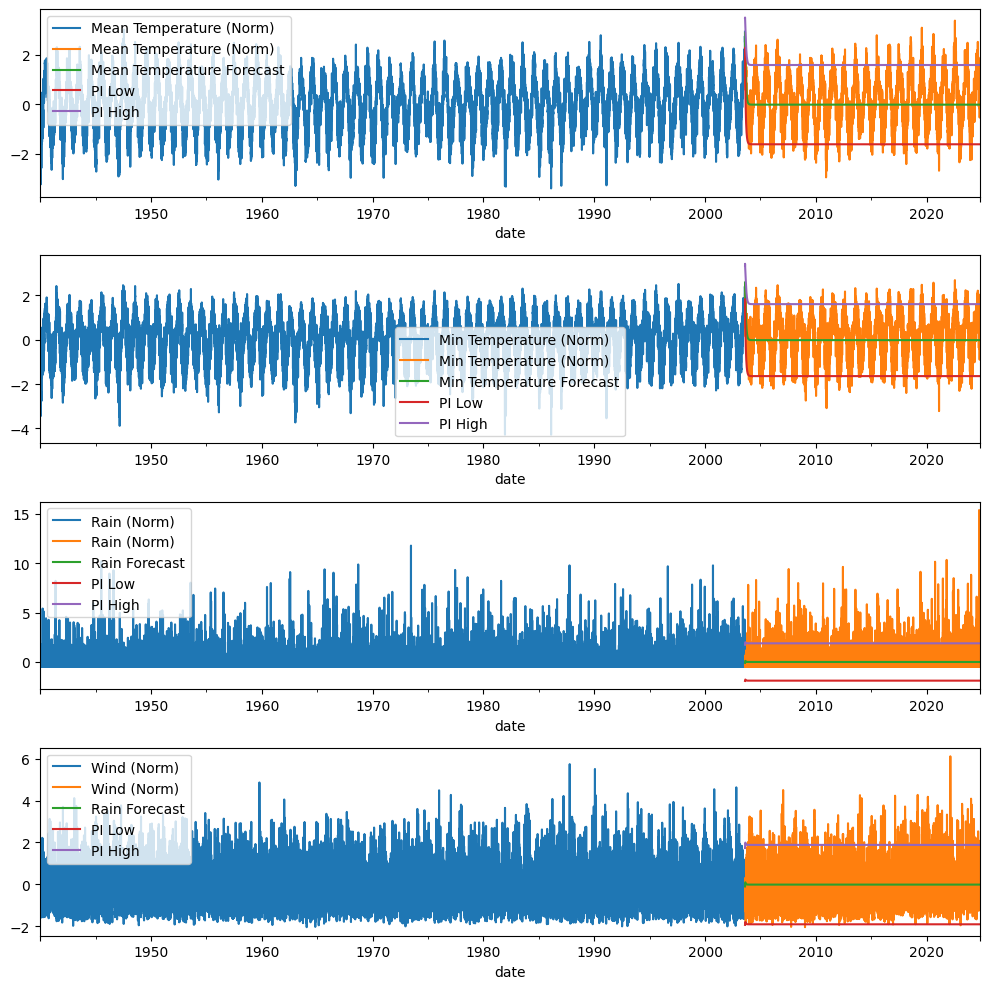

In [ ]:
forecast_1y=res.get_forecast(steps=windCTS_TE.size)

#Plot training + test + forecasts
fig, axs=plt.subplots(4,tight_layout=True,figsize=(10,10))

meanCTS_TR.plot(ax=axs[0],legend=True)
meanCTS_TE.plot(ax=axs[0],legend=True)

minCTS_TR.plot(ax=axs[1],legend=True)
minCTS_TE.plot(ax=axs[1],legend=True)

rainCTS_TR.plot(ax=axs[2],legend=True)
rainCTS_TE.plot(ax=axs[2],legend=True)

windCTS_TR.plot(ax=axs[3],legend=True)
windCTS_TE.plot(ax=axs[3],legend=True)

meanCTS_FC_1y=pd.Series(data=forecast_1y.predicted_mean[:,0],index=meanCTS_TE.index,name='Mean Temperature Forecast')
meanCTS_FC_LCI_1y=pd.Series(data=forecast_1y.conf_int()[:,0],index=meanCTS_TE.index,name='PI Low')
meanCTS_FC_UCI_1y=pd.Series(data=forecast_1y.conf_int()[:,4],index=meanCTS_TE.index,name='PI High')

minCTS_FC_1y=pd.Series(data=forecast_1y.predicted_mean[:,1],index=minCTS_TE.index,name='Min Temperature Forecast')
minCTS_FC_LCI_1y=pd.Series(data=forecast_1y.conf_int()[:,1],index=minCTS_TE.index,name='PI Low')
minCTS_FC_UCI_1y=pd.Series(data=forecast_1y.conf_int()[:,5],index=minCTS_TE.index,name='PI High')

rainCTS_FC_1y=pd.Series(data=forecast_1y.predicted_mean[:,2],index=rainCTS_TE.index,name='Rain Forecast')
rainCTS_FC_LCI_1y=pd.Series(data=forecast_1y.conf_int()[:,2],index=rainCTS_TE.index,name='PI Low')
rainCTS_FC_UCI_1y=pd.Series(data=forecast_1y.conf_int()[:,6],index=rainCTS_TE.index,name='PI High')

windCTS_FC_1y=pd.Series(data=forecast_1y.predicted_mean[:,3],index=windCTS_TE.index,name='Wind Forecast')
windCTS_FC_LCI_1y=pd.Series(data=forecast_1y.conf_int()[:,3],index=windCTS_TE.index,name='PI Low')
windCTS_FC_UCI_1y=pd.Series(data=forecast_1y.conf_int()[:,7],index=windCTS_TE.index,name='PI High')

meanCTS_FC_1y.plot(ax=axs[0],legend=True)
meanCTS_FC_LCI_1y.plot(ax=axs[0],legend=True)
meanCTS_FC_UCI_1y.plot(ax=axs[0],legend=True)

minCTS_FC_1y.plot(ax=axs[1],legend=True)
minCTS_FC_LCI_1y.plot(ax=axs[1],legend=True)
minCTS_FC_UCI_1y.plot(ax=axs[1],legend=True)

rainCTS_FC_1y.plot(ax=axs[2],legend=True)
rainCTS_FC_LCI_1y.plot(ax=axs[2],legend=True)
rainCTS_FC_UCI_1y.plot(ax=axs[2],legend=True)

rainCTS_FC_1y.plot(ax=axs[3],legend=True)
rainCTS_FC_LCI_1y.plot(ax=axs[3],legend=True)
rainCTS_FC_UCI_1y.plot(ax=axs[3],legend=True)



Now to predict with trend and seasonality too

Latest matching date found: 1981-08-11 00:00:00
End date for forecast: 2002-10-24 00:00:00


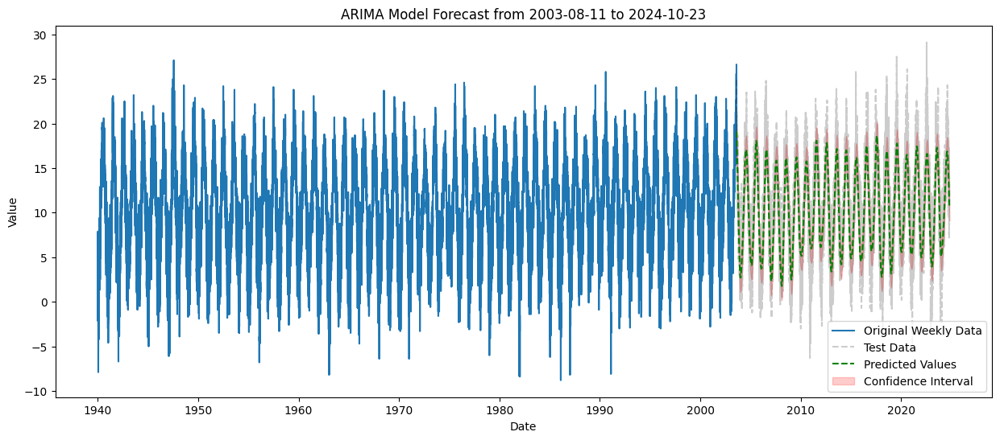

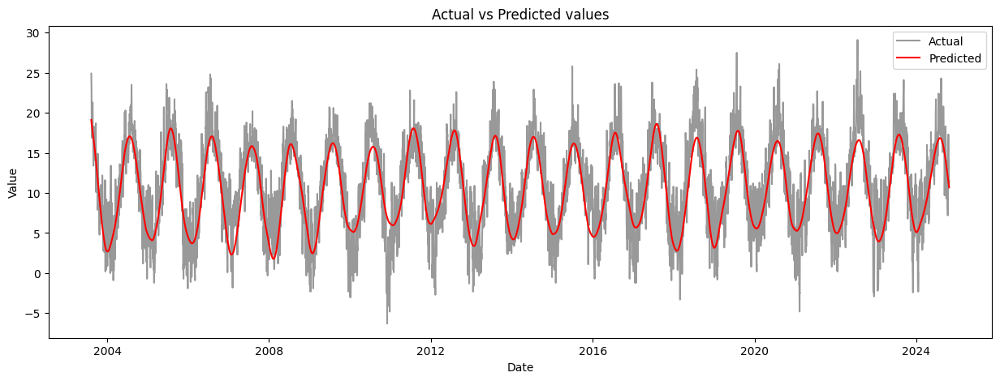

In [ ]:
# Forecast for mean temperature
forecast = res.get_forecast(steps=meanCTS_TE.size)
meanCTS_FC = pd.Series(data=forecast.predicted_mean[:, 0], index=meanCTS_TE.index, name='Mean Temperature Forecast')
meanCTS_FC_LCI = pd.Series(data=forecast.conf_int()[:, 0], index=meanCTS_TE.index, name='PI Low')
meanCTS_FC_UCI = pd.Series(data=forecast.conf_int()[:, 4], index=meanCTS_TE.index, name='PI High')
SeaTS.index = train_data["date"][-len(SeaTS):]

# Prepare the seasonal and trend data
seasonal_weekly = SeaTS.dropna().resample('D').mean()
MA_date = MA.copy()
MA_date = MA_date[-len(SeaTS.dropna()):]
MA_date.index = SeaTS.dropna().index
MA_weekly = MA_date.resample('D').mean()

# Set the predicted start date and length
predicted_start_date = meanCTS_FC.index[0]
forecast_length = len(meanCTS_FC)

# Finding the matching dates
latest_matching_date, end_matching_date = find_dates(predicted_start_date, forecast_length, MA_weekly, seasonal_weekly)

print(f"Latest matching date found: {latest_matching_date}")
print(f"End date for forecast: {end_matching_date}")

# Extracting trend and seasonal values
trend_values = MA_weekly[latest_matching_date:end_matching_date].values
seasonal_values = seasonal_weekly[latest_matching_date:end_matching_date].values

# Calculate forecast values with added trend and seasonal components
valores_dif = meanCTS_FC.values + trend_values + seasonal_values

# Create confidence interval data
forecast_ci_dif = pd.DataFrame(index=meanCTS_FC.index)
forecast_ci_dif["lower y"] = meanCTS_FC_LCI.values + trend_values + seasonal_values
forecast_ci_dif["upper y"] = meanCTS_FC_UCI.values + trend_values + seasonal_values

# Plotting predictions
plot_predictions(valores_dif, forecast_ci_dif, dadosTS, 'D')

plt.show()

In [ ]:
import sklearn.metrics as metrics

actual_values = test_data['mean_temperature'].values
mae = metrics.mean_absolute_error(actual_values, valores_dif)
mse = metrics.mean_squared_error(actual_values, valores_dif)
rmse = np.sqrt(mse)
non_zero_indices = actual_values != 0
mape = np.mean(np.abs((actual_values[non_zero_indices] - valores_dif[non_zero_indices]) / actual_values[non_zero_indices])) * 100

print("Error metrics:")
print("MAE:", mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("MAPE:", mape, "%")

Error metrics:
MAE: 2.3665600081413523
MSE: 8.94720663450701
RMSE: 2.991188164343228
MAPE: 74.79687271631879 %


In [ ]:
dadosTS_weekly_mean = dadosTS_mean.resample('W').mean()
dadosTS_weekly_min = dadosTS_min.resample('W').mean()
dadosTS_weekly_rain = dadosTS_rain.resample('W').sum()  # Rain is typically summed
dadosTS_weekly_wind = dadosTS_wind.resample('W').mean()

In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

meanCTS_w = pd.Series(data=scaler.fit_transform(dadosTS_weekly_mean.values.reshape(-1, 1)).flatten(),
                              index=dadosTS_weekly_mean.index, name='Mean Temperature (Norm)')

minCTS_w = pd.Series(data=scaler.fit_transform(dadosTS_weekly_min.values.reshape(-1, 1)).flatten(),
                             index=dadosTS_weekly_min.index, name='Min Temperature (Norm)')

rainCTS_w = pd.Series(data=scaler.fit_transform(dadosTS_weekly_rain.values.reshape(-1, 1)).flatten(),
                              index=dadosTS_weekly_rain.index, name='Rain (Norm)')

windCTS_w = pd.Series(data=scaler.fit_transform(dadosTS_weekly_wind.values.reshape(-1, 1)).flatten(),
                              index=dadosTS_weekly_wind.index, name='Wind (Norm)')




In [ ]:
X_w=[]
X_w.append(meanCTS_w)
X_w.append(minCTS_w)
X_w.append(rainCTS_w)
X_w.append(windCTS_w)

phi=
[[[ 1.41339314 -0.54041666  0.02918572 -0.06477534]
  [ 1.0368608  -0.16569646  0.03155052 -0.07806433]
  [ 0.11894575 -0.08249905  0.16452235  0.00706965]
  [-0.11030003 -0.07091352  0.03943005  0.23896652]]]


<ipython-input-15-fbcd1b195cca>:7: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  covCoef=covCoef+(timeserie1[n]-mu1)*(timeserie2[n+T]-mu2)


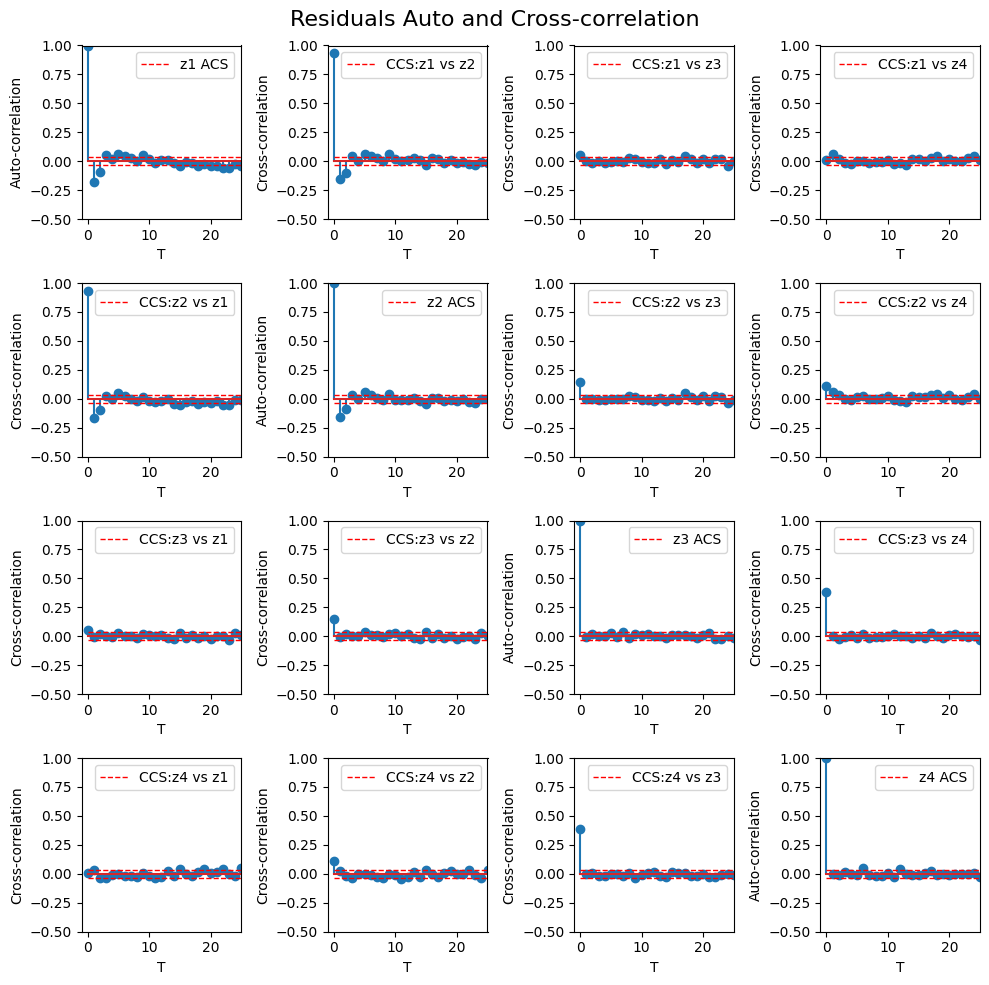

In [ ]:
import statsmodels.api as sm
meanCTS_TR_w=meanCTS_w[:-len(weekly_test)]
meanCTS_TE_w=meanCTS_w[-len(weekly_test) :]

minCTS_TR_w=minCTS_w[:-len(weekly_test)]
minCTS_TE_w=minCTS_w[-len(weekly_test):]

rainCTS_TR_w=rainCTS_w[:-len(weekly_test)]
rainCTS_TE_w=rainCTS_w[-len(weekly_test):]

windCTS_TR_w=windCTS_w[:-len(weekly_test)]
windCTS_TE_w=windCTS_w[-len(weekly_test):]

trainInputs_w=np.array([meanCTS_TR_w, minCTS_TR_w, rainCTS_TR_w,windCTS_TR_w]).transpose()

testInputs_w=np.array([meanCTS_TE_w, minCTS_TE_w,rainCTS_TE_w,windCTS_TE_w]).transpose()

mod_w = sm.tsa.VARMAX(endog=trainInputs_w, order=(1,0))
res_w = mod_w.fit(maxiter=5000, disp=False)
print('phi=')
print(res_w.coefficient_matrices_var)

#Get residues
resid_w=res_w.resid

zmeanTS_w=pd.Series(data=resid_w[:,0],index=meanCTS_TR_w.index, name='z1')
zminTS_w=pd.Series(data=resid_w[:,1],index=minCTS_TR_w.index, name='z2')
zrainTS_w=pd.Series(data=resid_w[:,2],index=rainCTS_TR_w.index, name='z3')
zwindTS_w=pd.Series(data=resid_w[:,3],index=windCTS_TR_w.index, name='z4')

plotCCSMatrix([zmeanTS_w,zminTS_w,zrainTS_w,zwindTS_w],title='Residuals Auto and Cross-correlation')



<Axes: xlabel='date'>

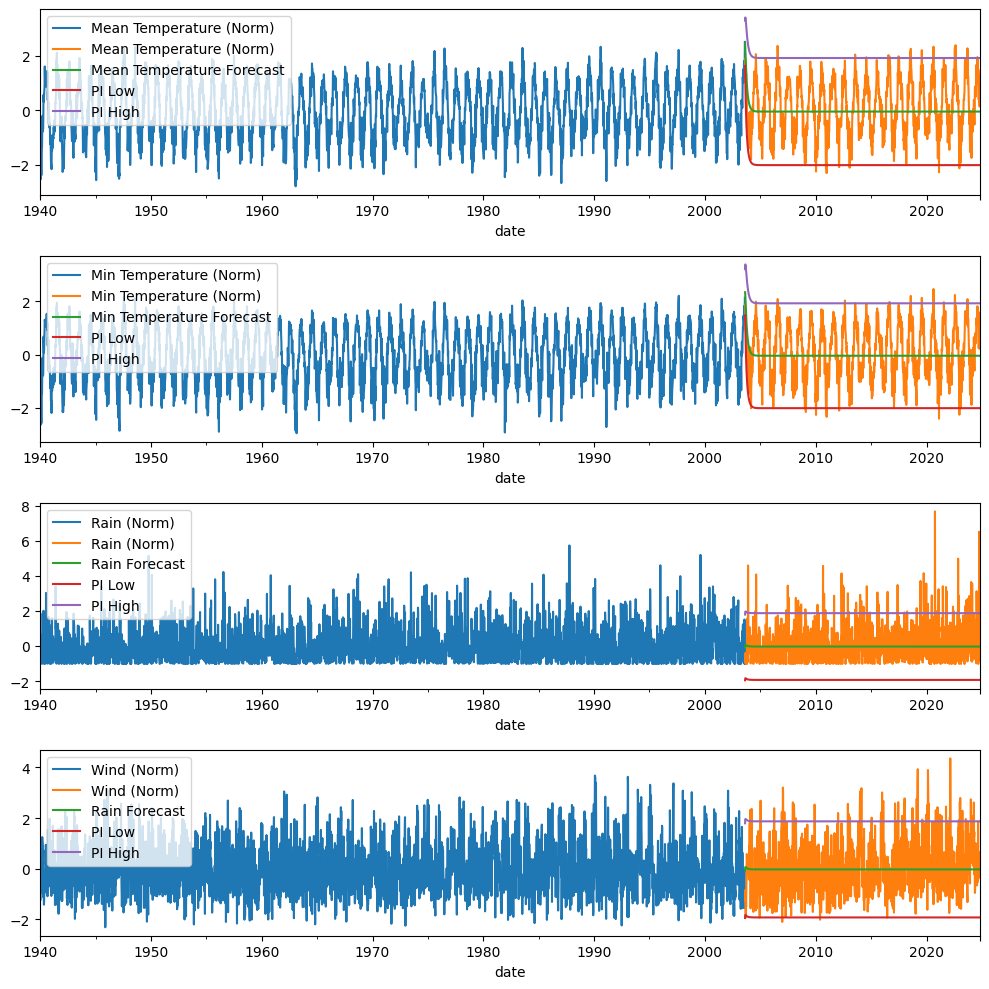

In [ ]:
forecast_1y_w=res_w.get_forecast(steps=windCTS_TE_w.size)

#Plot training + test + forecasts
fig, axs=plt.subplots(4,tight_layout=True,figsize=(10,10))

meanCTS_TR_w.plot(ax=axs[0],legend=True)
meanCTS_TE_w.plot(ax=axs[0],legend=True)

minCTS_TR_w.plot(ax=axs[1],legend=True)
minCTS_TE_w.plot(ax=axs[1],legend=True)

rainCTS_TR_w.plot(ax=axs[2],legend=True)
rainCTS_TE_w.plot(ax=axs[2],legend=True)

windCTS_TR_w.plot(ax=axs[3],legend=True)
windCTS_TE_w.plot(ax=axs[3],legend=True)

meanCTS_FC_1y_w=pd.Series(data=forecast_1y_w.predicted_mean[:,0],index=meanCTS_TE_w.index,name='Mean Temperature Forecast')
meanCTS_FC_LCI_1y_w=pd.Series(data=forecast_1y_w.conf_int()[:,0],index=meanCTS_TE_w.index,name='PI Low')
meanCTS_FC_UCI_1y_w=pd.Series(data=forecast_1y_w.conf_int()[:,4],index=meanCTS_TE_w.index,name='PI High')

minCTS_FC_1y_w=pd.Series(data=forecast_1y_w.predicted_mean[:,1],index=minCTS_TE_w.index,name='Min Temperature Forecast')
minCTS_FC_LCI_1y_w=pd.Series(data=forecast_1y_w.conf_int()[:,1],index=minCTS_TE_w.index,name='PI Low')
minCTS_FC_UCI_1y_w=pd.Series(data=forecast_1y_w.conf_int()[:,5],index=minCTS_TE_w.index,name='PI High')

rainCTS_FC_1y_w=pd.Series(data=forecast_1y_w.predicted_mean[:,2],index=rainCTS_TE_w.index,name='Rain Forecast')
rainCTS_FC_LCI_1y_w=pd.Series(data=forecast_1y_w.conf_int()[:,2],index=rainCTS_TE_w.index,name='PI Low')
rainCTS_FC_UCI_1y_w=pd.Series(data=forecast_1y_w.conf_int()[:,6],index=rainCTS_TE_w.index,name='PI High')

windCTS_FC_1y_w=pd.Series(data=forecast_1y_w.predicted_mean[:,3],index=windCTS_TE_w.index,name='Wind Forecast')
windCTS_FC_LCI_1y_w=pd.Series(data=forecast_1y_w.conf_int()[:,3],index=windCTS_TE_w.index,name='PI Low')
windCTS_FC_UCI_1y_w=pd.Series(data=forecast_1y_w.conf_int()[:,7],index=windCTS_TE_w.index,name='PI High')

meanCTS_FC_1y_w.plot(ax=axs[0],legend=True)
meanCTS_FC_LCI_1y_w.plot(ax=axs[0],legend=True)
meanCTS_FC_UCI_1y_w.plot(ax=axs[0],legend=True)

minCTS_FC_1y_w.plot(ax=axs[1],legend=True)
minCTS_FC_LCI_1y_w.plot(ax=axs[1],legend=True)
minCTS_FC_UCI_1y_w.plot(ax=axs[1],legend=True)

rainCTS_FC_1y_w.plot(ax=axs[2],legend=True)
rainCTS_FC_LCI_1y_w.plot(ax=axs[2],legend=True)
rainCTS_FC_UCI_1y_w.plot(ax=axs[2],legend=True)

rainCTS_FC_1y_w.plot(ax=axs[3],legend=True)
rainCTS_FC_LCI_1y_w.plot(ax=axs[3],legend=True)
rainCTS_FC_UCI_1y_w.plot(ax=axs[3],legend=True)



Latest matching date found: 1981-08-17 00:00:00
End date for forecast: 2002-11-04 00:00:00


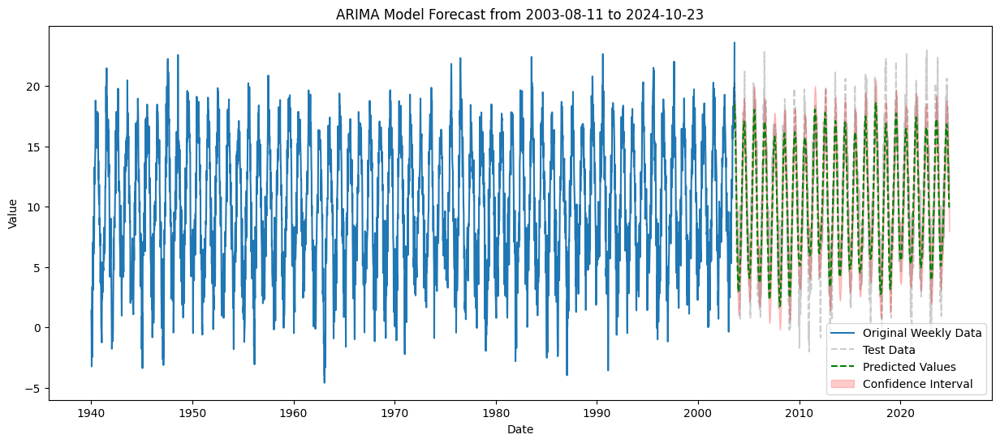

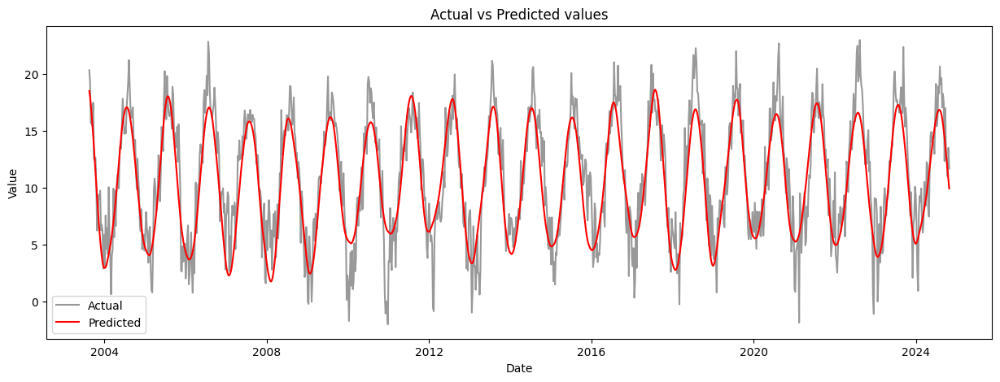

In [ ]:
# Forecast for mean temperature
forecast_w = res_w.get_forecast(steps=len(weekly_test))
meanCTS_FC_w = pd.Series(data=forecast_w.predicted_mean[:, 0], index=meanCTS_TE_w.index, name='Mean Temperature Forecast')
meanCTS_FC_LCI_w = pd.Series(data=forecast_w.conf_int()[:, 0], index=meanCTS_TE_w.index, name='PI Low')
meanCTS_FC_UCI_w = pd.Series(data=forecast_w.conf_int()[:, 4], index=meanCTS_TE_w.index, name='PI High')
SeaTS.index = train_data["date"][-len(SeaTS):]

# Prepare the seasonal and trend data
seasonal_weekly = SeaTS.dropna().resample('W').mean()
MA_date = MA.copy()
MA_date = MA_date[-len(SeaTS.dropna()):]
MA_date.index = SeaTS.dropna().index
MA_weekly = MA_date.resample('W').mean()

# Set the predicted start date and length
predicted_start_date_w = meanCTS_FC_w.index[0]
forecast_length_w = len(meanCTS_FC_w)

# Finding the matching dates
latest_matching_date, end_matching_date = find_dates(predicted_start_date_w, forecast_length_w, MA_weekly, seasonal_weekly,'W')

print(f"Latest matching date found: {latest_matching_date}")
print(f"End date for forecast: {end_matching_date}")

# Extracting trend and seasonal values
trend_values_w = MA_weekly[latest_matching_date:end_matching_date].values
seasonal_values_w = seasonal_weekly[latest_matching_date:end_matching_date].values

# Calculate forecast values with added trend and seasonal components
valores_dif_w = meanCTS_FC_w.values + trend_values_w + seasonal_values_w

# Create confidence interval data
forecast_ci_dif_w = pd.DataFrame(index=meanCTS_FC_w.index)
forecast_ci_dif_w["lower y"] = meanCTS_FC_LCI_w.values + trend_values_w + seasonal_values_w
forecast_ci_dif_w["upper y"] = meanCTS_FC_UCI_w.values + trend_values_w + seasonal_values_w

# Plotting predictions
plot_predictions(valores_dif_w, forecast_ci_dif_w, weekly_data, 'W', weekly_test)

plt.show()

In [ ]:
import sklearn.metrics as metrics

actual_values_w = weekly_test['mean_temperature'].values
mae_w = metrics.mean_absolute_error(actual_values_w, valores_dif_w)
mse_w = metrics.mean_squared_error(actual_values_w, valores_dif_w)
rmse_w = np.sqrt(mse_w)
non_zero_indices_w = actual_values_w != 0
mape_w = np.mean(np.abs((actual_values_w[non_zero_indices_w] - valores_dif_w[non_zero_indices_w]) / actual_values_w[non_zero_indices_w])) * 100

print("Error metrics:")
print("MAE:", mae_w)
print("MSE:", mse_w)
print("RMSE:", rmse_w)
print("MAPE:", mape_w, "%")

Error metrics:
MAE: 1.922999813684543
MSE: 6.023631652068567
RMSE: 2.45430879313679
MAPE: 105.10912279593816 %


Now with VARMA(2,2)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/varmax.py:160: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


phi=
[[[ 0.99787539 -0.95143394  0.14730324 -0.05424156]
  [ 0.76885017 -0.67717043  0.13397746 -0.10990752]
  [ 0.15350739 -0.18945808  0.15360515 -0.06057656]
  [ 0.28807999 -0.26734913  0.03178956  0.31059773]]

 [[ 1.41241999 -0.68644353  0.22233783 -0.19726298]
  [ 0.5876372   0.09378807  0.2519521  -0.22112022]
  [-0.037422    0.10203481  0.17624586 -0.09524641]
  [-1.06666299  0.90738201 -0.13070299  0.03546487]]]


<ipython-input-15-fbcd1b195cca>:7: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  covCoef=covCoef+(timeserie1[n]-mu1)*(timeserie2[n+T]-mu2)


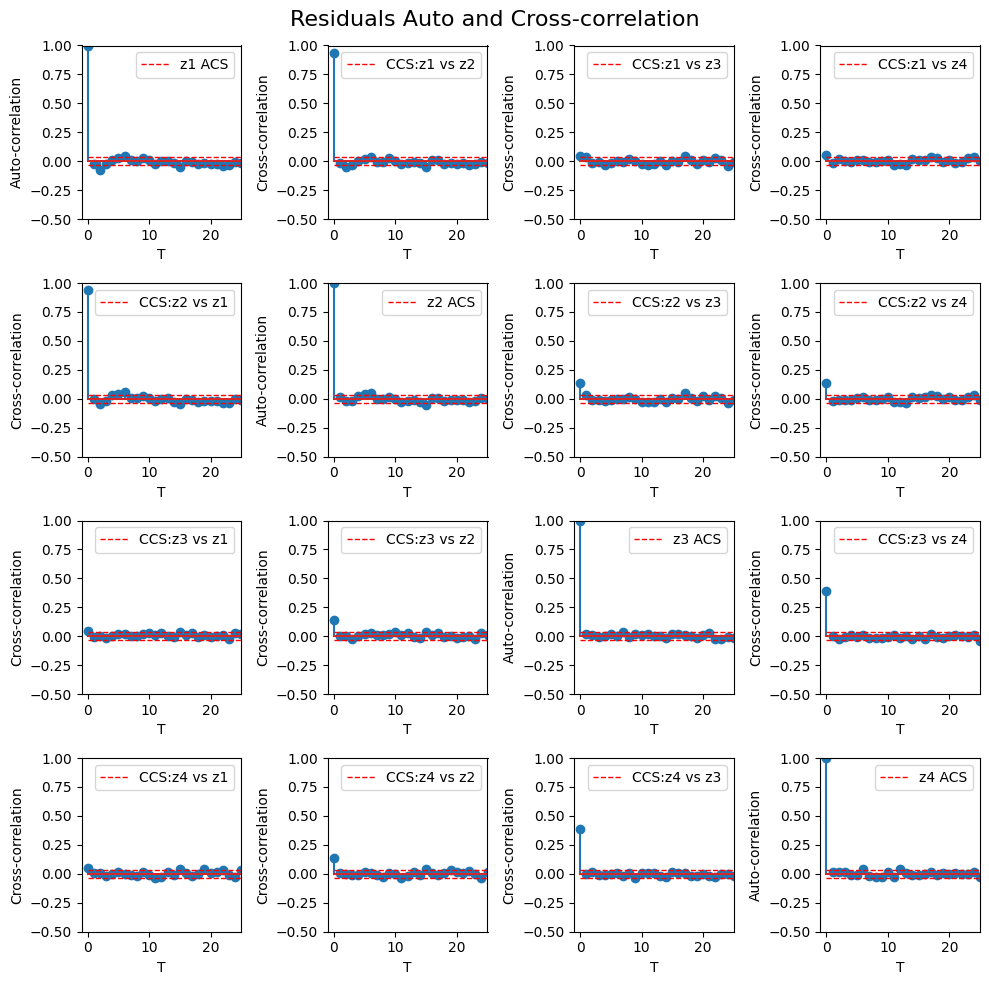

In [ ]:
import statsmodels.api as sm
meanCTS_TR_w=meanCTS_w[:-len(weekly_test)]
meanCTS_TE_w=meanCTS_w[-len(weekly_test) :]

minCTS_TR_w=minCTS_w[:-len(weekly_test)]
minCTS_TE_w=minCTS_w[-len(weekly_test):]

rainCTS_TR_w=rainCTS_w[:-len(weekly_test)]
rainCTS_TE_w=rainCTS_w[-len(weekly_test):]

windCTS_TR_w=windCTS_w[:-len(weekly_test)]
windCTS_TE_w=windCTS_w[-len(weekly_test):]

trainInputs_w=np.array([meanCTS_TR_w, minCTS_TR_w, rainCTS_TR_w,windCTS_TR_w]).transpose()

testInputs_w=np.array([meanCTS_TE_w, minCTS_TE_w,rainCTS_TE_w,windCTS_TE_w]).transpose()

mod_w = sm.tsa.VARMAX(endog=trainInputs_w, order=(2,2))
res_w = mod_w.fit(maxiter=5000, disp=False)
print('phi=')
print(res_w.coefficient_matrices_var)

#Get residues
resid_w=res_w.resid

zmeanTS_w=pd.Series(data=resid_w[:,0],index=meanCTS_TR_w.index, name='z1')
zminTS_w=pd.Series(data=resid_w[:,1],index=minCTS_TR_w.index, name='z2')
zrainTS_w=pd.Series(data=resid_w[:,2],index=rainCTS_TR_w.index, name='z3')
zwindTS_w=pd.Series(data=resid_w[:,3],index=windCTS_TR_w.index, name='z4')

plotCCSMatrix([zmeanTS_w,zminTS_w,zrainTS_w,zwindTS_w],title='Residuals Auto and Cross-correlation')



<Axes: xlabel='date'>

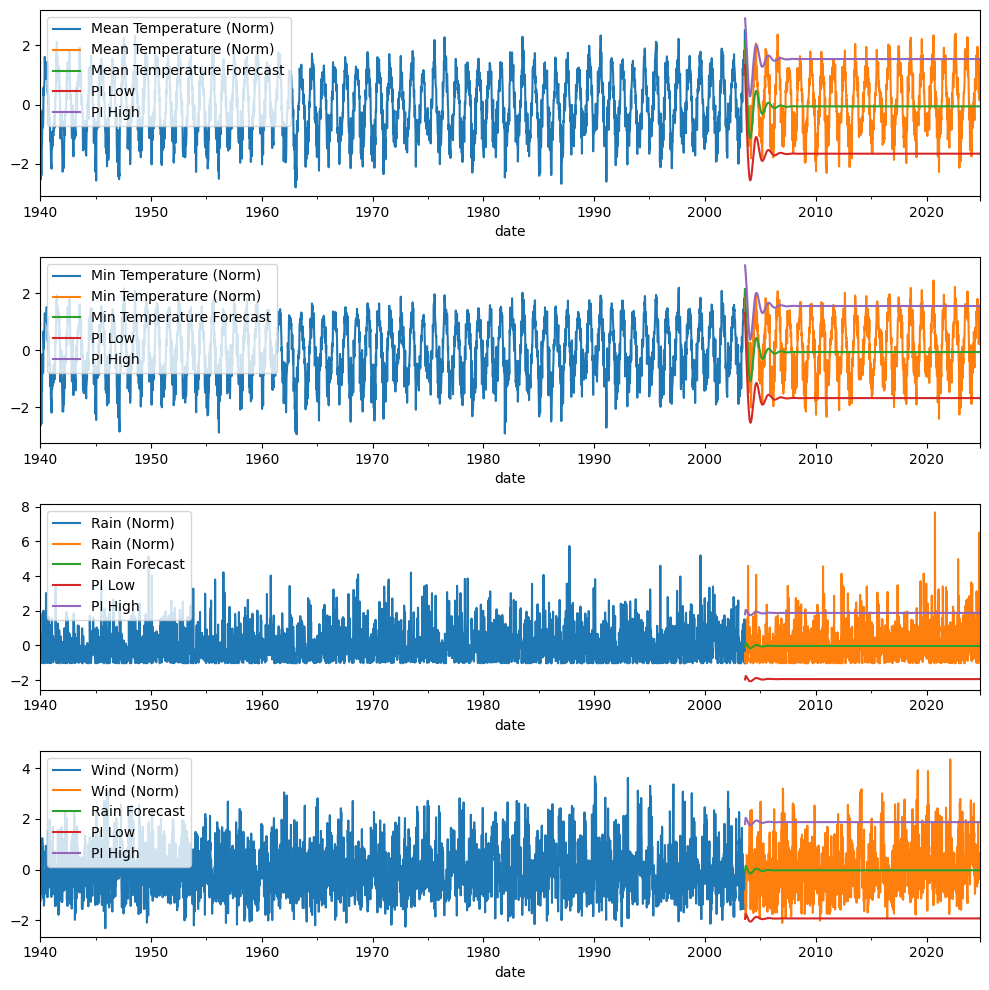

In [ ]:
forecast_1y_w=res_w.get_forecast(steps=windCTS_TE_w.size)

#Plot training + test + forecasts
fig, axs=plt.subplots(4,tight_layout=True,figsize=(10,10))

meanCTS_TR_w.plot(ax=axs[0],legend=True)
meanCTS_TE_w.plot(ax=axs[0],legend=True)

minCTS_TR_w.plot(ax=axs[1],legend=True)
minCTS_TE_w.plot(ax=axs[1],legend=True)

rainCTS_TR_w.plot(ax=axs[2],legend=True)
rainCTS_TE_w.plot(ax=axs[2],legend=True)

windCTS_TR_w.plot(ax=axs[3],legend=True)
windCTS_TE_w.plot(ax=axs[3],legend=True)

meanCTS_FC_1y_w=pd.Series(data=forecast_1y_w.predicted_mean[:,0],index=meanCTS_TE_w.index,name='Mean Temperature Forecast')
meanCTS_FC_LCI_1y_w=pd.Series(data=forecast_1y_w.conf_int()[:,0],index=meanCTS_TE_w.index,name='PI Low')
meanCTS_FC_UCI_1y_w=pd.Series(data=forecast_1y_w.conf_int()[:,4],index=meanCTS_TE_w.index,name='PI High')

minCTS_FC_1y_w=pd.Series(data=forecast_1y_w.predicted_mean[:,1],index=minCTS_TE_w.index,name='Min Temperature Forecast')
minCTS_FC_LCI_1y_w=pd.Series(data=forecast_1y_w.conf_int()[:,1],index=minCTS_TE_w.index,name='PI Low')
minCTS_FC_UCI_1y_w=pd.Series(data=forecast_1y_w.conf_int()[:,5],index=minCTS_TE_w.index,name='PI High')

rainCTS_FC_1y_w=pd.Series(data=forecast_1y_w.predicted_mean[:,2],index=rainCTS_TE_w.index,name='Rain Forecast')
rainCTS_FC_LCI_1y_w=pd.Series(data=forecast_1y_w.conf_int()[:,2],index=rainCTS_TE_w.index,name='PI Low')
rainCTS_FC_UCI_1y_w=pd.Series(data=forecast_1y_w.conf_int()[:,6],index=rainCTS_TE_w.index,name='PI High')

windCTS_FC_1y_w=pd.Series(data=forecast_1y_w.predicted_mean[:,3],index=windCTS_TE_w.index,name='Wind Forecast')
windCTS_FC_LCI_1y_w=pd.Series(data=forecast_1y_w.conf_int()[:,3],index=windCTS_TE_w.index,name='PI Low')
windCTS_FC_UCI_1y_w=pd.Series(data=forecast_1y_w.conf_int()[:,7],index=windCTS_TE_w.index,name='PI High')

meanCTS_FC_1y_w.plot(ax=axs[0],legend=True)
meanCTS_FC_LCI_1y_w.plot(ax=axs[0],legend=True)
meanCTS_FC_UCI_1y_w.plot(ax=axs[0],legend=True)

minCTS_FC_1y_w.plot(ax=axs[1],legend=True)
minCTS_FC_LCI_1y_w.plot(ax=axs[1],legend=True)
minCTS_FC_UCI_1y_w.plot(ax=axs[1],legend=True)

rainCTS_FC_1y_w.plot(ax=axs[2],legend=True)
rainCTS_FC_LCI_1y_w.plot(ax=axs[2],legend=True)
rainCTS_FC_UCI_1y_w.plot(ax=axs[2],legend=True)

rainCTS_FC_1y_w.plot(ax=axs[3],legend=True)
rainCTS_FC_LCI_1y_w.plot(ax=axs[3],legend=True)
rainCTS_FC_UCI_1y_w.plot(ax=axs[3],legend=True)



Latest matching date found: 1981-08-17 00:00:00
End date for forecast: 2002-11-04 00:00:00


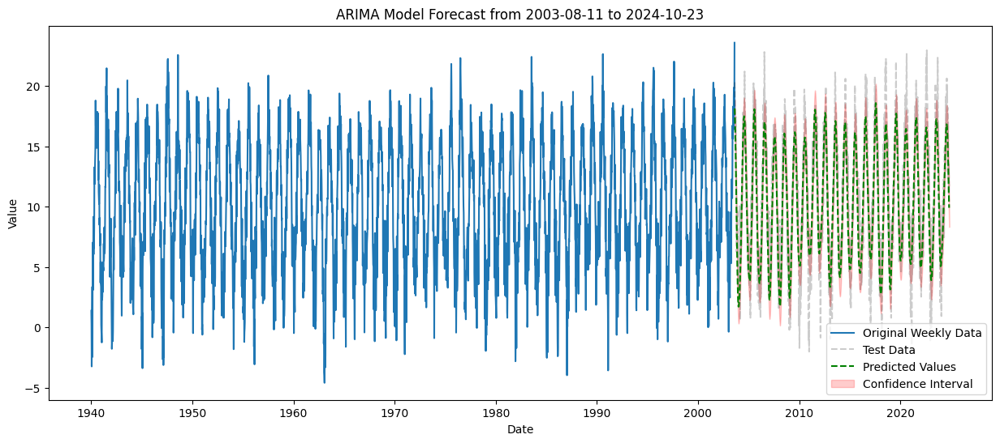

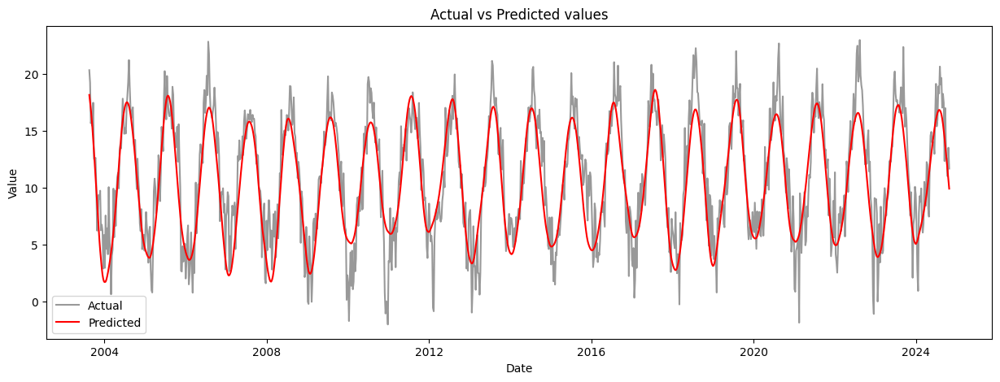

In [ ]:
# Forecast for mean temperature
forecast_w = res_w.get_forecast(steps=len(weekly_test))
meanCTS_FC_w = pd.Series(data=forecast_w.predicted_mean[:, 0], index=meanCTS_TE_w.index, name='Mean Temperature Forecast')
meanCTS_FC_LCI_w = pd.Series(data=forecast_w.conf_int()[:, 0], index=meanCTS_TE_w.index, name='PI Low')
meanCTS_FC_UCI_w = pd.Series(data=forecast_w.conf_int()[:, 4], index=meanCTS_TE_w.index, name='PI High')
SeaTS.index = train_data["date"][-len(SeaTS):]

# Prepare the seasonal and trend data
seasonal_weekly = SeaTS.dropna().resample('W').mean()
MA_date = MA.copy()
MA_date = MA_date[-len(SeaTS.dropna()):]
MA_date.index = SeaTS.dropna().index
MA_weekly = MA_date.resample('W').mean()

# Set the predicted start date and length
predicted_start_date_w = meanCTS_FC_w.index[0]
forecast_length_w = len(meanCTS_FC_w)

# Finding the matching dates
latest_matching_date, end_matching_date = find_dates(predicted_start_date_w, forecast_length_w, MA_weekly, seasonal_weekly,'W')

print(f"Latest matching date found: {latest_matching_date}")
print(f"End date for forecast: {end_matching_date}")

# Extracting trend and seasonal values
trend_values_w = MA_weekly[latest_matching_date:end_matching_date].values
seasonal_values_w = seasonal_weekly[latest_matching_date:end_matching_date].values

# Calculate forecast values with added trend and seasonal components
valores_dif_w = meanCTS_FC_w.values + trend_values_w + seasonal_values_w

# Create confidence interval data
forecast_ci_dif_w = pd.DataFrame(index=meanCTS_FC_w.index)
forecast_ci_dif_w["lower y"] = meanCTS_FC_LCI_w.values + trend_values_w + seasonal_values_w
forecast_ci_dif_w["upper y"] = meanCTS_FC_UCI_w.values + trend_values_w + seasonal_values_w

# Plotting predictions
plot_predictions(valores_dif_w, forecast_ci_dif_w, weekly_data, 'W', weekly_test)

plt.show()

In [ ]:
import sklearn.metrics as metrics

actual_values_w = weekly_test['mean_temperature'].values
mae_w = metrics.mean_absolute_error(actual_values_w, valores_dif_w)
mse_w = metrics.mean_squared_error(actual_values_w, valores_dif_w)
rmse_w = np.sqrt(mse_w)
non_zero_indices_w = actual_values_w != 0
mape_w = np.mean(np.abs((actual_values_w[non_zero_indices_w] - valores_dif_w[non_zero_indices_w]) / actual_values_w[non_zero_indices_w])) * 100

print("Error metrics:")
print("MAE:", mae_w)
print("MSE:", mse_w)
print("RMSE:", rmse_w)
print("MAPE:", mape_w, "%")

Error metrics:
MAE: 1.9346169558802346
MSE: 6.105583791779623
RMSE: 2.470947954081515
MAPE: 104.83420042504459 %


In [ ]:
import itertools
import statsmodels.api as sm
import warnings

p = range(2, 4)  # AR order
q = range(2, 4)  # MA order
best_aic = float("inf")
best_order = None

# Suppress specific warnings from statsmodels
with warnings.catch_warnings():
    warnings.simplefilter("ignore", category=UserWarning)  # To suppress convergence warnings
    warnings.simplefilter("ignore", category=RuntimeWarning)  # To suppress estimation warnings

    for order in itertools.product(p, q):
        if order == (0, 0):
            continue
        try:
            mod = sm.tsa.VARMAX(endog=trainInputs_w, order=order)
            res = mod.fit(disp=False)
            if res.aic < best_aic:
                best_aic = res.aic
                best_order = order
        except:
            continue

print(f'Best order: AR={best_order[0]}, MA={best_order[1]} with AIC={best_aic}')

Best order: AR=3, MA=2 with AIC=17457.020246655626


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/varmax.py:160: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


phi=
[[[ 1.0656539  -0.65906193  0.01469717  0.04284646]
  [ 0.79350534 -0.33063428  0.00263901  0.00239521]
  [ 0.27822296 -0.24478189  0.17143787  0.01294336]
  [ 0.36313361 -0.33477056  0.02335426  0.25670143]]

 [[ 0.61428561 -0.33957034  0.09342662 -0.36016406]
  [-0.00803189  0.44683803  0.08433631 -0.34581837]
  [-0.19436147  0.33075678  0.07998827 -0.05436439]
  [-0.56654052  0.49772579 -0.06610518  0.11643416]]

 [[ 0.31406442 -0.19565183  0.01866271  0.0452471 ]
  [ 0.09656594 -0.15985024  0.00925015  0.06019034]
  [-0.00730939 -0.1219934   0.00125193 -0.01087445]
  [-0.30836168  0.19627221 -0.01670723 -0.01414333]]]


<ipython-input-15-fbcd1b195cca>:7: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  covCoef=covCoef+(timeserie1[n]-mu1)*(timeserie2[n+T]-mu2)


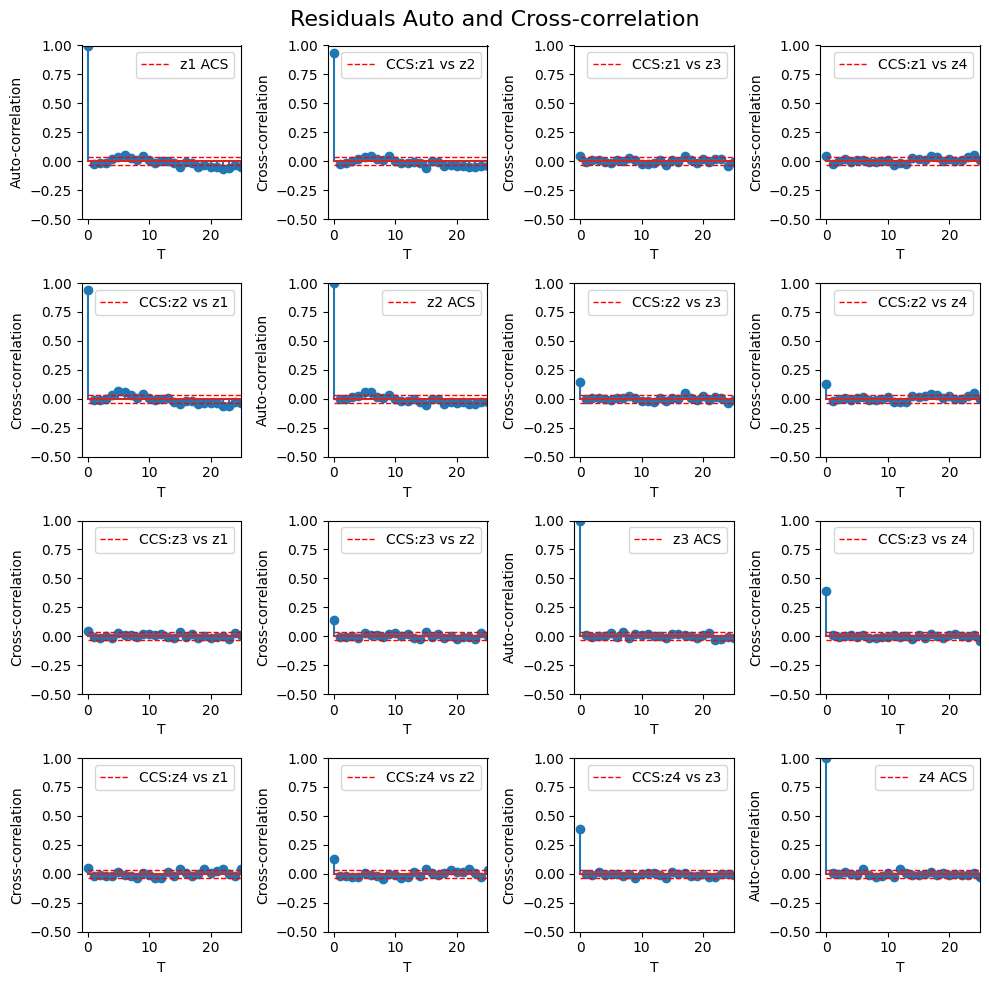

In [ ]:
import statsmodels.api as sm
meanCTS_TR_w=meanCTS_w[:-len(weekly_test)]
meanCTS_TE_w=meanCTS_w[-len(weekly_test) :]

minCTS_TR_w=minCTS_w[:-len(weekly_test)]
minCTS_TE_w=minCTS_w[-len(weekly_test):]

rainCTS_TR_w=rainCTS_w[:-len(weekly_test)]
rainCTS_TE_w=rainCTS_w[-len(weekly_test):]

windCTS_TR_w=windCTS_w[:-len(weekly_test)]
windCTS_TE_w=windCTS_w[-len(weekly_test):]

trainInputs_w=np.array([meanCTS_TR_w, minCTS_TR_w, rainCTS_TR_w,windCTS_TR_w]).transpose()

testInputs_w=np.array([meanCTS_TE_w, minCTS_TE_w,rainCTS_TE_w,windCTS_TE_w]).transpose()

mod_w = sm.tsa.VARMAX(endog=trainInputs_w, order=(3,2))
res_w = mod_w.fit(maxiter=5000, disp=False)
print('phi=')
print(res_w.coefficient_matrices_var)

#Get residues
resid_w=res_w.resid

zmeanTS_w=pd.Series(data=resid_w[:,0],index=meanCTS_TR_w.index, name='z1')
zminTS_w=pd.Series(data=resid_w[:,1],index=minCTS_TR_w.index, name='z2')
zrainTS_w=pd.Series(data=resid_w[:,2],index=rainCTS_TR_w.index, name='z3')
zwindTS_w=pd.Series(data=resid_w[:,3],index=windCTS_TR_w.index, name='z4')

plotCCSMatrix([zmeanTS_w,zminTS_w,zrainTS_w,zwindTS_w],title='Residuals Auto and Cross-correlation')



<Axes: xlabel='date'>

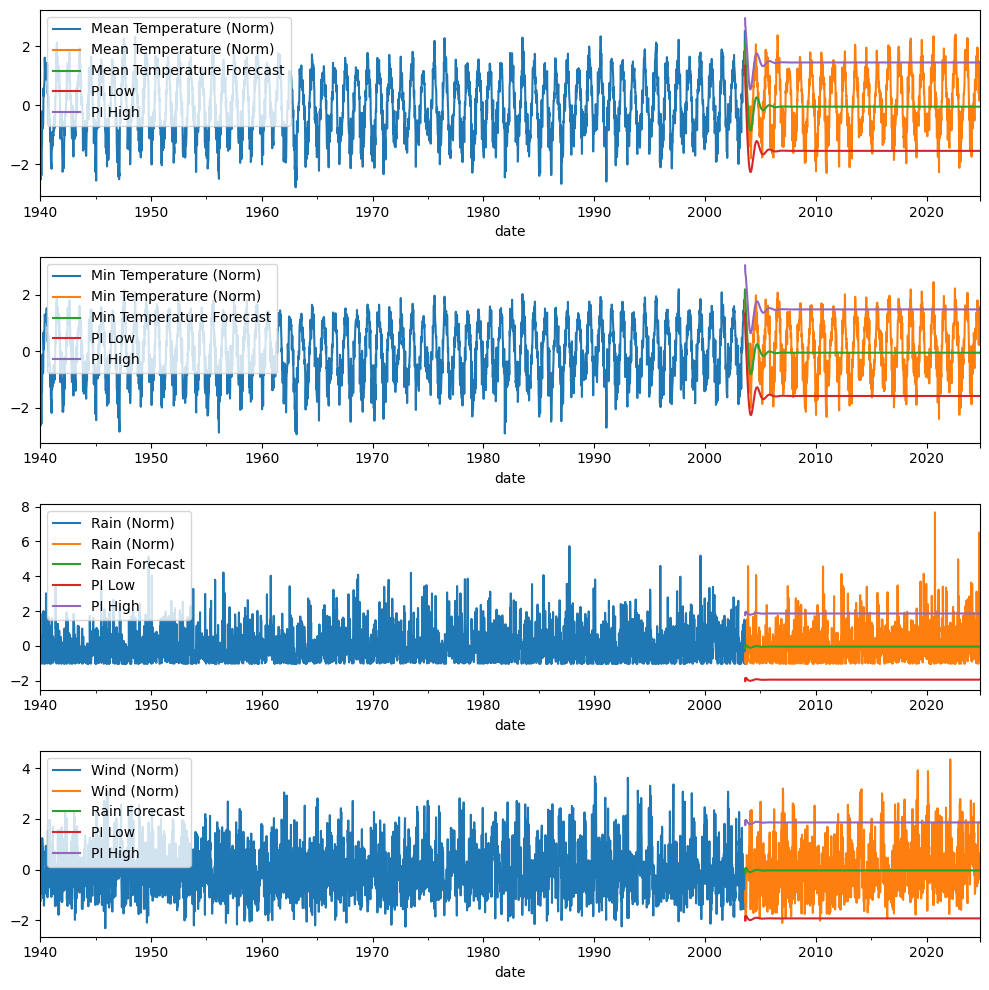

In [ ]:
forecast_1y_w=res_w.get_forecast(steps=windCTS_TE_w.size)

#Plot training + test + forecasts
fig, axs=plt.subplots(4,tight_layout=True,figsize=(10,10))

meanCTS_TR_w.plot(ax=axs[0],legend=True)
meanCTS_TE_w.plot(ax=axs[0],legend=True)

minCTS_TR_w.plot(ax=axs[1],legend=True)
minCTS_TE_w.plot(ax=axs[1],legend=True)

rainCTS_TR_w.plot(ax=axs[2],legend=True)
rainCTS_TE_w.plot(ax=axs[2],legend=True)

windCTS_TR_w.plot(ax=axs[3],legend=True)
windCTS_TE_w.plot(ax=axs[3],legend=True)

meanCTS_FC_1y_w=pd.Series(data=forecast_1y_w.predicted_mean[:,0],index=meanCTS_TE_w.index,name='Mean Temperature Forecast')
meanCTS_FC_LCI_1y_w=pd.Series(data=forecast_1y_w.conf_int()[:,0],index=meanCTS_TE_w.index,name='PI Low')
meanCTS_FC_UCI_1y_w=pd.Series(data=forecast_1y_w.conf_int()[:,4],index=meanCTS_TE_w.index,name='PI High')

minCTS_FC_1y_w=pd.Series(data=forecast_1y_w.predicted_mean[:,1],index=minCTS_TE_w.index,name='Min Temperature Forecast')
minCTS_FC_LCI_1y_w=pd.Series(data=forecast_1y_w.conf_int()[:,1],index=minCTS_TE_w.index,name='PI Low')
minCTS_FC_UCI_1y_w=pd.Series(data=forecast_1y_w.conf_int()[:,5],index=minCTS_TE_w.index,name='PI High')

rainCTS_FC_1y_w=pd.Series(data=forecast_1y_w.predicted_mean[:,2],index=rainCTS_TE_w.index,name='Rain Forecast')
rainCTS_FC_LCI_1y_w=pd.Series(data=forecast_1y_w.conf_int()[:,2],index=rainCTS_TE_w.index,name='PI Low')
rainCTS_FC_UCI_1y_w=pd.Series(data=forecast_1y_w.conf_int()[:,6],index=rainCTS_TE_w.index,name='PI High')

windCTS_FC_1y_w=pd.Series(data=forecast_1y_w.predicted_mean[:,3],index=windCTS_TE_w.index,name='Wind Forecast')
windCTS_FC_LCI_1y_w=pd.Series(data=forecast_1y_w.conf_int()[:,3],index=windCTS_TE_w.index,name='PI Low')
windCTS_FC_UCI_1y_w=pd.Series(data=forecast_1y_w.conf_int()[:,7],index=windCTS_TE_w.index,name='PI High')

meanCTS_FC_1y_w.plot(ax=axs[0],legend=True)
meanCTS_FC_LCI_1y_w.plot(ax=axs[0],legend=True)
meanCTS_FC_UCI_1y_w.plot(ax=axs[0],legend=True)

minCTS_FC_1y_w.plot(ax=axs[1],legend=True)
minCTS_FC_LCI_1y_w.plot(ax=axs[1],legend=True)
minCTS_FC_UCI_1y_w.plot(ax=axs[1],legend=True)

rainCTS_FC_1y_w.plot(ax=axs[2],legend=True)
rainCTS_FC_LCI_1y_w.plot(ax=axs[2],legend=True)
rainCTS_FC_UCI_1y_w.plot(ax=axs[2],legend=True)

rainCTS_FC_1y_w.plot(ax=axs[3],legend=True)
rainCTS_FC_LCI_1y_w.plot(ax=axs[3],legend=True)
rainCTS_FC_UCI_1y_w.plot(ax=axs[3],legend=True)



Latest matching date found: 1981-08-17 00:00:00
End date for forecast: 2002-11-04 00:00:00


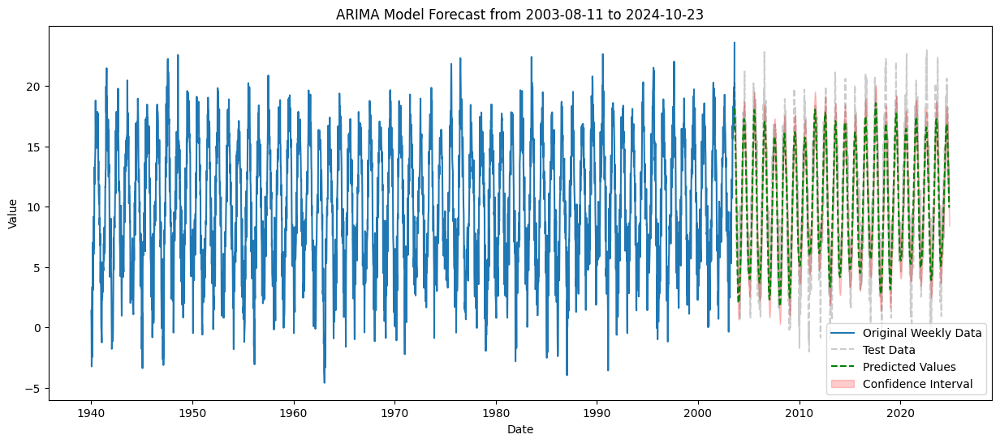

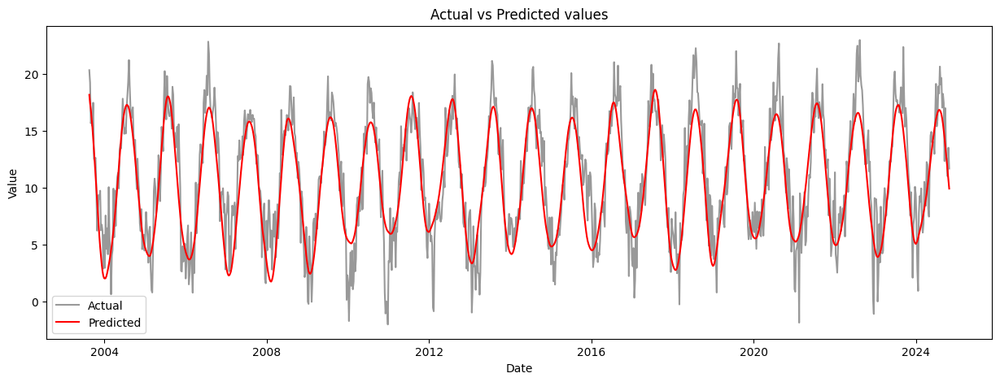

In [ ]:
# Forecast for mean temperature
forecast_w = res_w.get_forecast(steps=len(weekly_test))
meanCTS_FC_w = pd.Series(data=forecast_w.predicted_mean[:, 0], index=meanCTS_TE_w.index, name='Mean Temperature Forecast')
meanCTS_FC_LCI_w = pd.Series(data=forecast_w.conf_int()[:, 0], index=meanCTS_TE_w.index, name='PI Low')
meanCTS_FC_UCI_w = pd.Series(data=forecast_w.conf_int()[:, 4], index=meanCTS_TE_w.index, name='PI High')
SeaTS.index = train_data["date"][-len(SeaTS):]

# Prepare the seasonal and trend data
seasonal_weekly = SeaTS.dropna().resample('W').mean()
MA_date = MA.copy()
MA_date = MA_date[-len(SeaTS.dropna()):]
MA_date.index = SeaTS.dropna().index
MA_weekly = MA_date.resample('W').mean()

# Set the predicted start date and length
predicted_start_date_w = meanCTS_FC_w.index[0]
forecast_length_w = len(meanCTS_FC_w)

# Finding the matching dates
latest_matching_date, end_matching_date = find_dates(predicted_start_date_w, forecast_length_w, MA_weekly, seasonal_weekly,'W')

print(f"Latest matching date found: {latest_matching_date}")
print(f"End date for forecast: {end_matching_date}")

# Extracting trend and seasonal values
trend_values_w = MA_weekly[latest_matching_date:end_matching_date].values
seasonal_values_w = seasonal_weekly[latest_matching_date:end_matching_date].values

# Calculate forecast values with added trend and seasonal components
valores_dif_w = meanCTS_FC_w.values + trend_values_w + seasonal_values_w

# Create confidence interval data
forecast_ci_dif_w = pd.DataFrame(index=meanCTS_FC_w.index)
forecast_ci_dif_w["lower y"] = meanCTS_FC_LCI_w.values + trend_values_w + seasonal_values_w
forecast_ci_dif_w["upper y"] = meanCTS_FC_UCI_w.values + trend_values_w + seasonal_values_w

# Plotting predictions
plot_predictions(valores_dif_w, forecast_ci_dif_w, weekly_data, 'W', weekly_test)

plt.show()

In [ ]:
import sklearn.metrics as metrics

actual_values_w = weekly_test['mean_temperature'].values
mae_w = metrics.mean_absolute_error(actual_values_w, valores_dif_w)
mse_w = metrics.mean_squared_error(actual_values_w, valores_dif_w)
rmse_w = np.sqrt(mse_w)
non_zero_indices_w = actual_values_w != 0
mape_w = np.mean(np.abs((actual_values_w[non_zero_indices_w] - valores_dif_w[non_zero_indices_w]) / actual_values_w[non_zero_indices_w])) * 100

print("Error metrics:")
print("MAE:", mae_w)
print("MSE:", mse_w)
print("RMSE:", rmse_w)
print("MAPE:", mape_w, "%")

Error metrics:
MAE: 1.9312623149090868
MSE: 6.07819494310917
RMSE: 2.46539955039932
MAPE: 104.93341876343104 %


## MLP

The best SARIMA model on original data (with trend and seasonality) was SARIMA(2,1,2) (0,1,2,52), which expression, ignoring MA values, is $X(n)=f(X(n-1),X(n-2),X(n-3),X(n-52),X(n-53),X(n-54))$.
Let's define a model based on MLP by assuming that this model as the same inputs as SARIMA.

In [82]:

def genIOData(outData,inData=pd.DataFrame(),delayEndog=[1],delayExog=[],h=1):
    N=outData.shape[0]
    inShape=inData.shape
    if len(inShape)==1:
        M=1
    else:
        M=inShape[1]# The number of explanatory TS (Exogenous inputs)

    laggedData=pd.DataFrame(index=inData.index)
    for i in range(M):
        for j in range(len(delayExog[i])):
            if isinstance(inData, pd.DataFrame):
                laggedData[inData.columns[i]+'_lag'+str(delayExog[i][j]+(h-1))] = inData[inData.columns[i]].shift(periods=delayExog[i][j]+(h-1))
            else:
                laggedData[inData.name+'_lag'+str(delayExog[i][j]+(h-1))] = inData.shift(periods=delayExog[i][j]+(h-1))

    for j in range(len(delayEndog)):
        laggedData[outData.name+'_lag'+str(delayEndog[j]+(h-1))] = outData.shift(periods=delayEndog[j]+(h-1))

    laggedData[outData.name]=outData

    return laggedData.dropna(axis=0)

def genTensor(data,T,M):
    dataMat=data.to_numpy()
    N=data.shape[0]
    Ti=0
    tensor=np.zeros((N,T,M))
    print(tensor.shape)
    for i in range(M):
        tensor[:,:,i]=dataMat[:,Ti:Ti+T]
        Ti=Ti+T

    return tensor


In [83]:

#Delay data to simulate external dynamics
#Delay just output and consider X(n-1), X(n-2), X(n-3), X(n-12), X(n-13), X(n-14), X(n-15)
unTRTS=pd.Series(data=np.array(weekly_data.values),index=weekly_data.index,name="Mean Temperature weekly")
unTETS=pd.Series(data=np.array(weekly_test["mean_temperature"].values),index=weekly_test.index,name="Mean Temperature weekly")

delays=[1,2,52]
dataDelTR=genIOData(unTRTS,delayEndog=delays)
dataInpTR=dataDelTR.iloc[:,0:-1].to_numpy()
dataOutTR=dataDelTR.iloc[:,-1].to_numpy()
dataTRTS=pd.Series(data=dataOutTR,index=unTRTS.index[52:],name='Training Data')

#Testing data
unTEUTS=pd.Series(pd.concat((unTRTS.iloc[unTRTS.size-52:],unTETS)),name='test')
dataDelTE=genIOData(unTEUTS,delayEndog=delays)
dataInpTE=dataDelTE.iloc[:,0:-1].to_numpy()

dataOutTE=dataDelTE.iloc[:,-1].to_numpy()
dataTETS=pd.Series(data=dataOutTE,index=unTEUTS.index[52:],name='Testing Data')


In [85]:
from sklearn.neural_network import MLPRegressor
from statsmodels.tsa.stattools import acf
import scipy.stats as spyst
#Implement a MLP regressor
regr = MLPRegressor(random_state=1, max_iter=10000,early_stopping=True,
                    hidden_layer_sizes=(50,500,)).fit(dataInpTR, dataOutTR)

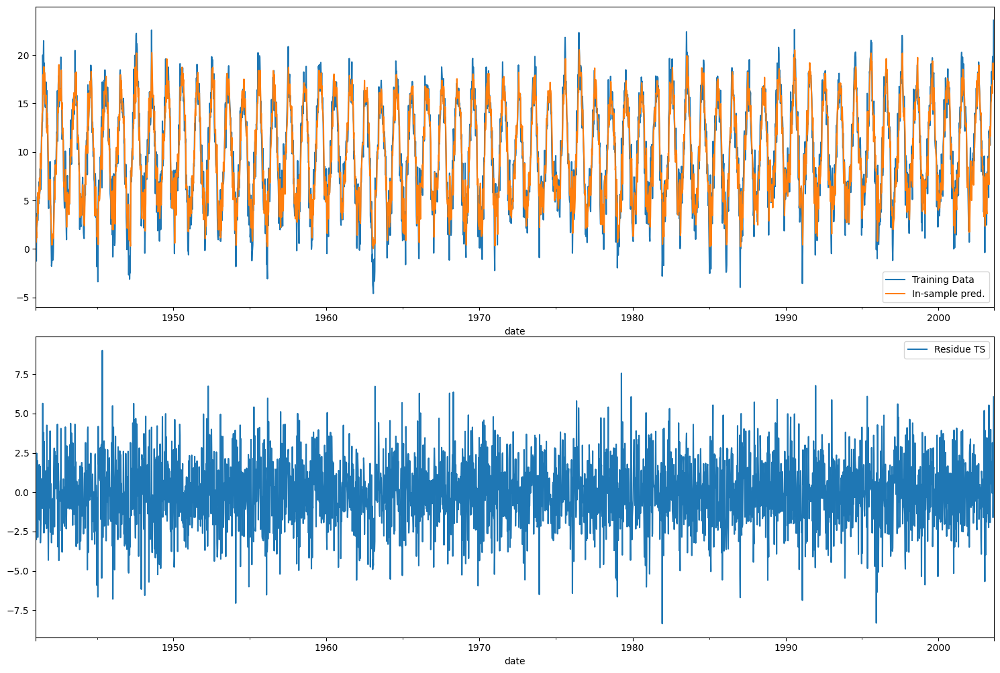

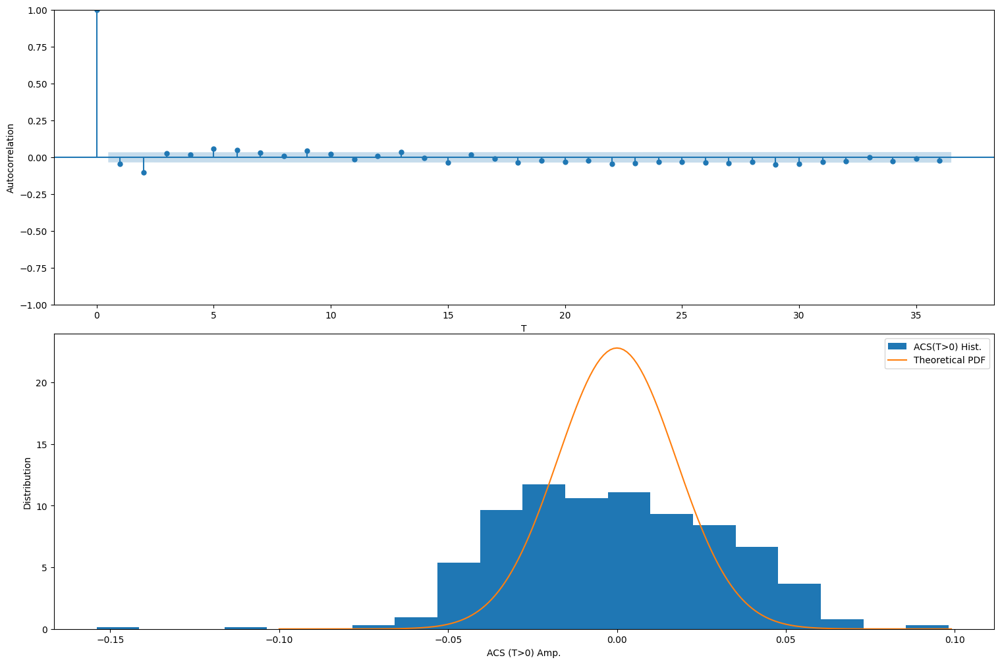

In [90]:
#Evaluate residuals
predictTRTS=pd.Series(data=regr.predict(dataInpTR),index=dataTRTS.index,
                      name='In-sample pred.')
resTS=dataTRTS-predictTRTS
resTS.name='Residue TS'

fig, axs=plt.subplots(2,figsize=(15,10))
fig.tight_layout()
dataTRTS.plot(ax=axs[0],legend=True)
predictTRTS.plot(ax=axs[0],legend=True)
resTS.plot(ax=axs[1],legend=True)

#Evaluate fitting quality by inspecting residuals at two levels: ACS and ACS
#distribution
fig, axs=plt.subplots(2,figsize=(15,10))
fig.tight_layout()
plot_acf(resTS,ax=axs[0],title="")
axs[0].set_xlabel("T")
axs[0].set_ylabel("Autocorrelation")

ac=acf(resTS,nlags=500,fft=False)

axs[1].hist(ac[1:],bins=20,density=True,label='ACS(T>0) Hist.')

N=resTS.size
rg=np.arange(-0.1,0.1,0.001)
pdf = spyst.norm.pdf(rg,0,1/np.sqrt(N))
plt.plot(rg,pdf,label='Theoretical PDF')
plt.xlabel("ACS (T>0) Amp.")
plt.ylabel("Distribution")
plt.legend()

In [95]:
from sklearn.metrics import mean_absolute_error, mean_squared_error
# Perform prediction on the testing data
#predictTETS = pd.Series(data=regr.predict(dataInpTE), index=unTEUTS.index[52:], name='Test Predictions')

#resTETS = dataOutTE - predictTETS

# Calculate error metrics
mae = mean_absolute_error(dataTRTS, predictTRTS)
mse = mean_squared_error(dataTRTS, predictTRTS)
rmse = np.sqrt(mse)

# Avoid division by zero when calculating MAPE
non_zero_indices = dataTRTS != 0
mape = np.mean(np.abs((dataTRTS[non_zero_indices] - predictTRTS[non_zero_indices]) / dataTRTS[non_zero_indices])) * 100

# Print the error metrics
print("Error metrics:")
print("MAE:", mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("MAPE:", mape, "%")

Error metrics:
MAE: 1.677961348534793
MSE: 4.577176905744106
RMSE: 2.1394337815749536
MAPE: 4384828158943738.5 %


Forecast RMSE=2.1680203655482897


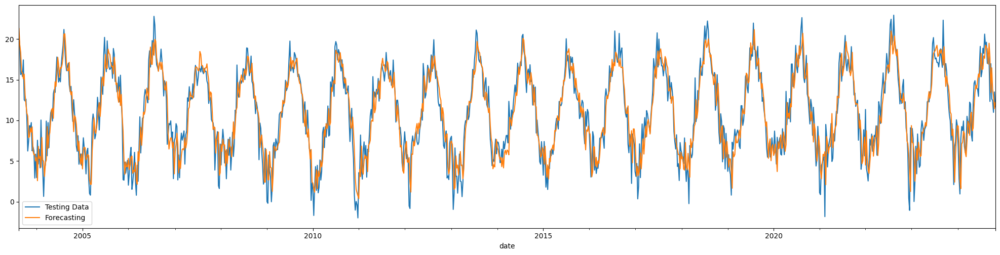

In [96]:
#Plot forecasting in testing (One-step-ahead)
forecastTETS=pd.Series(data=regr.predict(dataInpTE),
                       index=dataTETS.index,name='Forecasting')
fig, axs=plt.subplots(1,figsize=(20,5))
fig.tight_layout()
#dataTRTS.plot(legend=True)
dataTETS.plot(ax=axs,legend=True)
forecastTETS.plot(ax=axs,legend=True)

print("Forecast RMSE="+str(np.sqrt(np.sum((dataTETS-forecastTETS)**2)/forecastTETS.size)))

In [97]:
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Calculate error metrics
mae = mean_absolute_error(dataTETS, forecastTETS)
mse = mean_squared_error(dataTETS, forecastTETS)
rmse = np.sqrt(mse)

# Avoid division by zero when calculating MAPE
non_zero_indices = dataTETS != 0
mape = np.mean(np.abs((dataTETS[non_zero_indices] - forecastTETS[non_zero_indices]) / dataTETS[non_zero_indices])) * 100

# Print the error metrics
print("Error metrics:")
print("MAE:", mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("MAPE:", mape, "%")

Error metrics:
MAE: 1.6975856892624868
MSE: 4.700312305432139
RMSE: 2.1680203655482897
MAPE: 107.26403640435018 %


<ipython-input-89-05ca8ae215ef>:9: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  hStepFor[i,0]=regr.predict(psample.reshape(1, -1))
<ipython-input-89-05ca8ae215ef>:9: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  hStepFor[i,0]=regr.predict(psample.reshape(1, -1))
<ipython-input-89-05ca8ae215ef>:9: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  hStepFor[i,0]=regr.predict(psample.reshape(1, -1))
<ipython-input-89-05ca8ae215ef>:9: DeprecationWarning: Conversion of an a

Forecast RMSE=6.298332311199905


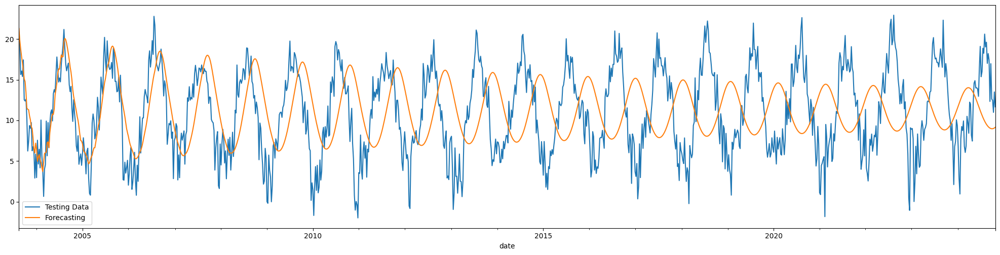

In [89]:
#Plot forecasting in testing (several steps ahead)

hStepFor=np.zeros((len(dataOutTE),1))
startTE=dataTRTS.copy()
startTE=startTE.iloc[dataTRTS.size-52:]
buffer=np.flip(startTE.to_numpy())
for i in range(len(dataOutTE)):
    psample=buffer[(np.array(delays)-1)]
    hStepFor[i,0]=regr.predict(psample.reshape(1, -1))
    buffer[1:]=buffer[0:-1]
    buffer[0]=hStepFor[i,0]

forecastHSTS=pd.Series(data=hStepFor[:,0],index=dataTETS.index,name='Forecasting')
fig, axs=plt.subplots(1,figsize=(20,5))
fig.tight_layout()
dataTETS.plot(ax=axs,legend=True)
forecastHSTS.plot(ax=axs,legend=True)
print("Forecast RMSE="+str(np.sqrt(np.sum((dataTETS-forecastHSTS)**2)/forecastHSTS.size)))

In [ ]:

mae = mean_absolute_error(dataTETS, forecastHSTS)
mse = mean_squared_error(dataTETS, forecastHSTS)
rmse = np.sqrt(mse)

non_zero_indices = dataTETS != 0
mape = np.mean(np.abs((dataTETS[non_zero_indices] - forecastHSTS[non_zero_indices]) / dataTETS[non_zero_indices])) * 100 if non_zero_indices.any() else np.inf

# Print metrics
print("Error metrics for multi-step forecast:")
print("MAE:", mae)
print("MSE:", mse)
print("RMSE:", rmse)
print("MAPE:", mape, "%")

Error metrics for multi-step forecast:
MAE: 5.2785906717574695
MSE: 39.66898990230474
RMSE: 6.298332311199905
MAPE: 294.0341193689461 %
